<a href="https://colab.research.google.com/github/x1ew/Students-Academic-Performance/blob/main/Final_Projec2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#***DataSet***

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import gdown
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import KFold

In [ ]:
!gdown --id 12wyRWegwJ7R-t2hYshX9Qj1Qs460lPr1

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=12wyRWegwJ7R-t2hYshX9Qj1Qs460lPr1
To: /content/xAPI-Edu-Data.csv
100% 38.0k/38.0k [00:00<00:00, 41.9MB/s]


In [ ]:
df = pd.read_csv('/content/xAPI-Edu-Data.csv')
df.head()

,gender,NationalITy,PlaceofBirth,StageID,GradeID,SectionID,Topic,Semester,Relation,raisedhands,VisITedResources,AnnouncementsView,Discussion,ParentAnsweringSurvey,ParentschoolSatisfaction,StudentAbsenceDays,Class
0,M,KW,KuwaIT,lowerlevel,G-04,A,IT,F,Father,15,16,2,20,Yes,Good,Under-7,M
1,M,KW,KuwaIT,lowerlevel,G-04,A,IT,F,Father,20,20,3,25,Yes,Good,Under-7,M
2,M,KW,KuwaIT,lowerlevel,G-04,A,IT,F,Father,10,7,0,30,No,Bad,Above-7,L
3,M,KW,KuwaIT,lowerlevel,G-04,A,IT,F,Father,30,25,5,35,No,Bad,Above-7,L
4,M,KW,KuwaIT,lowerlevel,G-04,A,IT,F,Father,40,50,12,50,No,Bad,Above-7,M


In [ ]:
df.columns

Index(['gender', 'NationalITy', 'PlaceofBirth', 'StageID', 'GradeID',
       'SectionID', 'Topic', 'Semester', 'Relation', 'raisedhands',
       'VisITedResources', 'AnnouncementsView', 'Discussion',
       'ParentAnsweringSurvey', 'ParentschoolSatisfaction',
       'StudentAbsenceDays', 'Class'],
      dtype='object')

In [ ]:
df.shape

(480, 17)

In [ ]:
df["Class"].unique()

array(['M', 'L', 'H'], dtype=object)

In [ ]:
X = np.array(pd.get_dummies(df.iloc[:,:-1])).astype("float")
Y = np.array(df["Class"])

In [ ]:
Y[Y == 'M'] = 1
Y[Y == 'H'] = 2
Y[Y == 'L'] = 0

In [ ]:
# df.head(20)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=32) #choose 20 80

In [ ]:
#Standarlize data
scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)

In [ ]:
print('Number of dataset: ', len(X))
print('Number of train set: ', len(X_train))
print('Number of validation set: ', len(X_test))

Number of dataset:  480
Number of train set:  384
Number of validation set:  96


In [ ]:
y_train, y_test = y_train.reshape(y_train.shape[0], -1),  y_test.reshape(y_test.shape[0], -1) #reshape

In [ ]:
print("X_train: ",X_train.shape)
print("y_train: " ,y_train.shape)
print("X_val: " ,X_test.shape)
print("y_val:" ,y_test.shape)

X_train:  (384, 72)
y_train:  (384, 1)
X_val:  (96, 72)
y_val: (96, 1)


Kind of Data:['M' 'F']

Number of Data:
M    305
F    175
Name: gender, dtype: int64



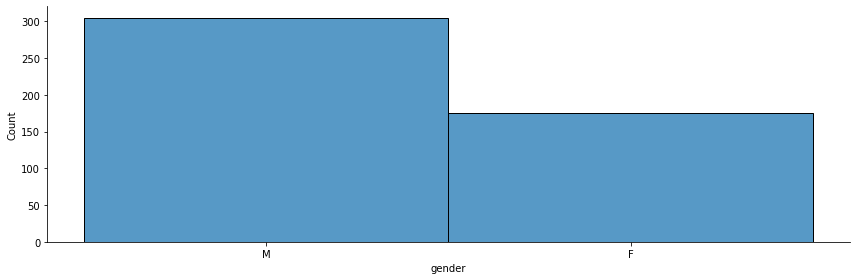

In [ ]:
print("Kind of Data:" + str(df['gender'].unique())) #print Kind of Data each column has
print()
print("Number of Data:") #Number of each part
print(df['gender'].value_counts())
print()
sns.displot(data = df, x = 'gender', height = 4, aspect = 3)

Kind of Data:['KW' 'lebanon' 'Egypt' 'SaudiArabia' 'USA' 'Jordan' 'venzuela' 'Iran'
 'Tunis' 'Morocco' 'Syria' 'Palestine' 'Iraq' 'Lybia']

Number of Data:
KW             179
Jordan         172
Palestine       28
Iraq            22
lebanon         17
Tunis           12
SaudiArabia     11
Egypt            9
Syria            7
USA              6
Iran             6
Lybia            6
Morocco          4
venzuela         1
Name: NationalITy, dtype: int64



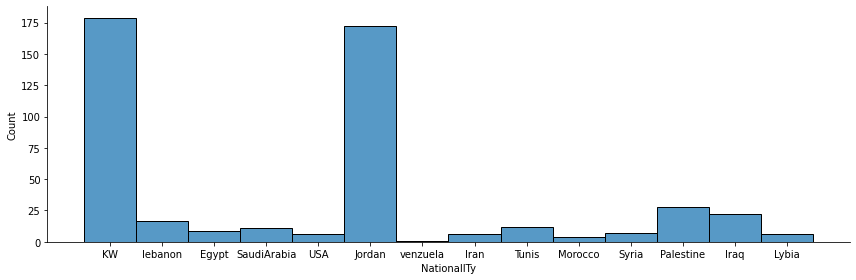

In [ ]:
print("Kind of Data:" + str(df['NationalITy'].unique()))
print()
print("Number of Data:")
print(df['NationalITy'].value_counts())
print()
sns.displot(data = df, x = 'NationalITy', height = 4, aspect= 3)

Kind of Data:['KuwaIT' 'lebanon' 'Egypt' 'SaudiArabia' 'USA' 'Jordan' 'venzuela' 'Iran'
 'Tunis' 'Morocco' 'Syria' 'Iraq' 'Palestine' 'Lybia']

Number of Data:
KuwaIT         180
Jordan         176
Iraq            22
lebanon         19
SaudiArabia     16
USA             16
Palestine       10
Egypt            9
Tunis            9
Iran             6
Syria            6
Lybia            6
Morocco          4
venzuela         1
Name: PlaceofBirth, dtype: int64



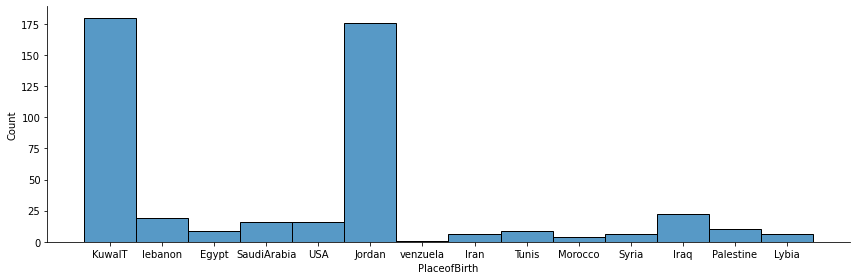

In [ ]:
print("Kind of Data:" + str(df['PlaceofBirth'].unique()))
print()
print("Number of Data:")
print(df['PlaceofBirth'].value_counts())
print()
sns.displot(data = df, x = 'PlaceofBirth', height = 4, aspect= 3)

Kind of Data:['lowerlevel' 'MiddleSchool' 'HighSchool']

Number of Data:
MiddleSchool    248
lowerlevel      199
HighSchool       33
Name: StageID, dtype: int64



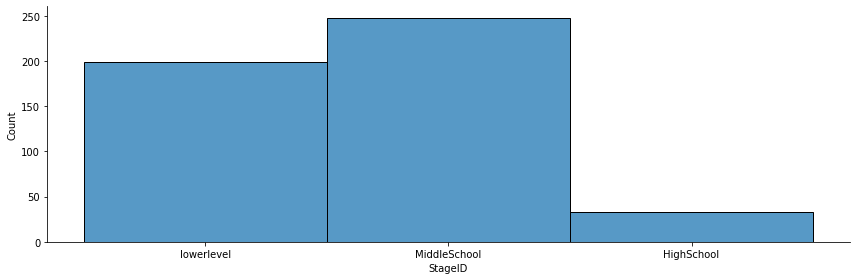

In [ ]:
print("Kind of Data:" + str(df['StageID'].unique()))
print()
print("Number of Data:")
print(df['StageID'].value_counts())
print()
sns.displot(data = df, x = 'StageID', height = 4, aspect= 3)

Kind of Data:['G-04' 'G-07' 'G-08' 'G-06' 'G-05' 'G-09' 'G-12' 'G-11' 'G-10' 'G-02']

Number of Data:
G-02    147
G-08    116
G-07    101
G-04     48
G-06     32
G-11     13
G-12     11
G-09      5
G-10      4
G-05      3
Name: GradeID, dtype: int64



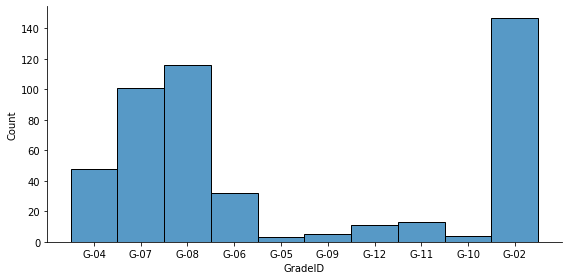

In [ ]:
print("Kind of Data:" + str(df['GradeID'].unique()))
print()
print("Number of Data:")
print(df['GradeID'].value_counts())
print()
sns.displot(data = df, x = 'GradeID', height = 4, aspect= 2)

Kind of Data:['A' 'B' 'C']

Number of Data:
A    283
B    167
C     30
Name: SectionID, dtype: int64



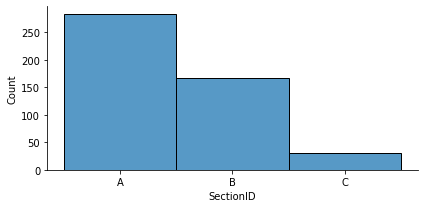

In [ ]:
print("Kind of Data:" + str(df['SectionID'].unique()))
print()
print("Number of Data:")
print(df['SectionID'].value_counts())
print()
sns.displot(data = df, x = 'SectionID', height = 3, aspect= 2)

Kind of Data:['IT' 'Math' 'Arabic' 'Science' 'English' 'Quran' 'Spanish' 'French'
 'History' 'Biology' 'Chemistry' 'Geology']

Number of Data:
IT           95
French       65
Arabic       59
Science      51
English      45
Biology      30
Spanish      25
Chemistry    24
Geology      24
Quran        22
Math         21
History      19
Name: Topic, dtype: int64



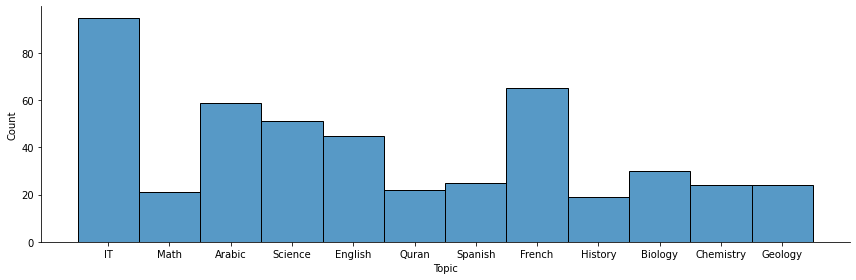

In [ ]:
print("Kind of Data:" + str(df['Topic'].unique()))
print()
print("Number of Data:")
print(df['Topic'].value_counts())
print()
sns.displot(data = df, x = 'Topic', height = 4, aspect= 3)

Kind of Data:['F' 'S']

Number of Data:
F    245
S    235
Name: Semester, dtype: int64



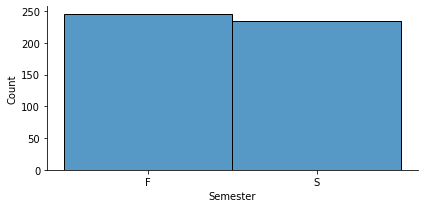

In [ ]:
print("Kind of Data:" + str(df['Semester'].unique()))
print()
print("Number of Data:")
print(df['Semester'].value_counts())
print()
sns.displot(data = df, x = 'Semester', height = 3, aspect= 2)

Kind of Data:['Father' 'Mum']

Number of Data:
Father    283
Mum       197
Name: Relation, dtype: int64



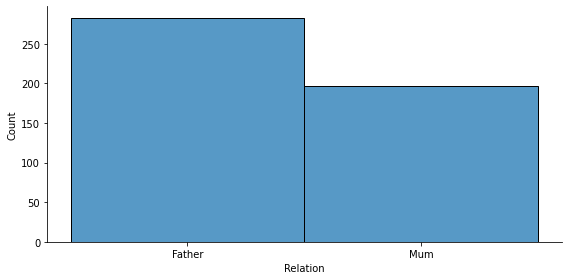

In [ ]:
print("Kind of Data:" + str(df['Relation'].unique()))
print()
print("Number of Data:")
print(df['Relation'].value_counts())
print()
sns.displot(data = df, x = 'Relation', height = 4, aspect= 2)

Kind of Data:[ 15  20  10  30  40  42  35  50  12  70  19   5  62  36  55  69  60   2
   0   8  25  75   4  45  14  33   7  13  29  39  49  16  28  27  21  80
  17  65  22  11   1   3 100   6  90  77  24  66  23  82  72  51  85  87
  95  81  53  92  83  67  96  57  73   9  32  52  59  61  79  18  74  97
  41  71  98  78  89  88  86  76  99  84]

Number of Data:
10    31
70    31
80    28
72    17
50    17
      ..
61     1
83     1
52     1
67     1
97     1
Name: raisedhands, Length: 82, dtype: int64



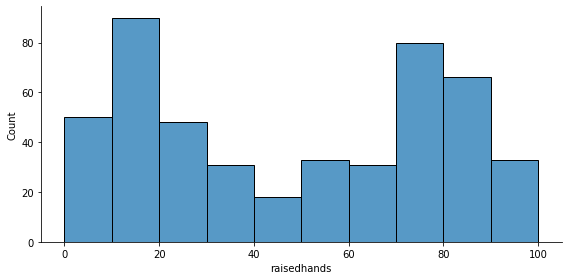

In [ ]:
print("Kind of Data:" + str(df['raisedhands'].unique()))
print()
print("Number of Data:")
print(df['raisedhands'].value_counts())
print()
sns.displot(data = df, x = 'raisedhands', height = 4, aspect= 2)

Kind of Data:[16 20  7 25 50 30 12 10 21 80 88  6  1 14 70 40 13 15 60  0  2 19 85 90
  5 22 11 54 35 33  4 39 75 69  3  8 89 44 92 26 27 29 98  9 42 65 79 55
 63 91 51 58 68 82 72 52 62 71 66 43 95 31 41 81 61 83 84 17 94 48 86 74
 76 97 87 99 34 64 28 38 36 24 59 57 77 18 93 96 78]

Number of Data:
80    29
90    29
82    16
12    13
88    13
      ..
63     1
55     1
54     1
1      1
78     1
Name: VisITedResources, Length: 89, dtype: int64



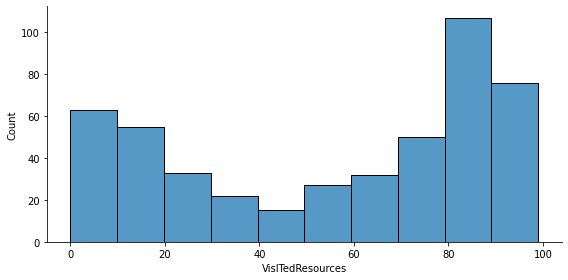

In [ ]:
print("Kind of Data:" + str(df['VisITedResources'].unique()))
print()
print("Number of Data:")
print(df['VisITedResources'].value_counts())
print()
sns.displot(data = df, x = 'VisITedResources', height = 4, aspect= 2)

Kind of Data:[ 2  3  0  5 12 13 15 16 25 30 19 44 22 20 35 36 40 33  4 52 50 10  9  8
 17 26 37  7 28  1 39  6 32 70 18 23 11 29 49 55 38 41 51 95 85 71 98 73
 48 58 93 83 53 63 62 82 72 42 46 77 21 88 66 86 80 56 91 65 76 24 74 59
 79 34 69 89 31 60 54 57 64 87 75 67 43 45 14 78]

Number of Data:
12    21
42    16
50    16
40    16
2     14
20    14
82    13
29    12
32    12
10    12
52    11
15    11
23    10
22    10
62    10
0     10
30     9
83     9
3      8
9      8
19     8
72     8
6      7
11     7
33     7
21     7
58     7
5      6
55     6
86     6
51     6
4      6
74     6
13     6
41     5
73     5
49     5
16     5
76     5
1      5
7      5
79     5
18     4
80     4
25     4
46     4
89     4
35     4
59     4
66     3
31     3
64     3
14     3
85     3
63     3
71     3
8      3
26     3
70     3
95     3
37     3
69     2
39     2
54     2
77     2
34     2
48     2
53     2
28     2
65     2
44     2
56     2
98     2
38     2
57     2
45     1
87     1
43     1

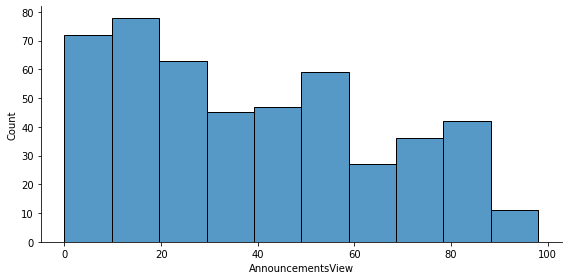

In [ ]:
print("Kind of Data:" + str(df['AnnouncementsView'].unique()))
print()
print("Number of Data:")
print(df['AnnouncementsView'].value_counts().to_string())
print()
sns.displot(data = df, x = 'AnnouncementsView', height = 4, aspect= 2)

Kind of Data:[20 25 30 35 50 70 17 22 80 12 11 19 60 66 90 96 99 40 33 43 16  4 88 77
 75  1  5  2  8 13 44  9 55 10 15  7  3 14 69 59 89 41 91 49 73 23 53 93
 51 83 24 84 61 94 34 81 29 46 26  6 76 86 85 65 95 64 32 37 36 27 39 74
 79 21 31 28 38 48 97 98 63 72 82 71 45 68 92 58 57 62]

Number of Data:
70    24
40    23
33    21
50    18
30    17
10    16
80    15
14    13
53    12
20    11
90    11
13    11
43    11
23    11
83     9
19     9
11     9
89     9
12     8
3      8
66     7
60     7
17     7
21     7
22     6
29     6
7      5
15     5
84     5
81     5
8      5
39     5
28     5
41     5
34     4
24     4
26     4
85     4
31     4
72     4
61     4
5      4
16     4
86     3
96     3
27     3
68     3
75     3
79     3
6      3
1      3
2      3
44     3
9      3
38     3
51     3
35     3
25     3
98     3
49     3
37     3
36     2
71     2
4      2
97     2
88     2
74     2
77     2
63     2
91     2
92     2
46     2
94     2
55     2
69     2
93     2
45     1
82

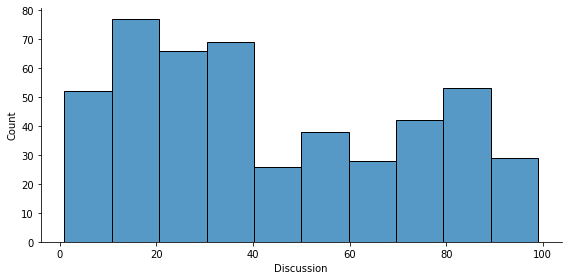

In [ ]:
print("Kind of Data:" + str(df['Discussion'].unique()))
print()
print("Number of Data:")
print(df['Discussion'].value_counts().to_string())
print()
sns.displot(data = df, x = 'Discussion', height = 4, aspect= 2)

Kind of Data:['Yes' 'No']

Number of Data:
Yes    270
No     210
Name: ParentAnsweringSurvey, dtype: int64



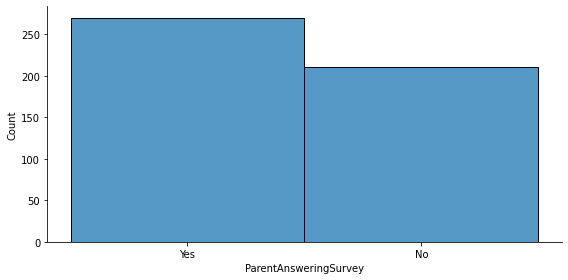

In [ ]:
print("Kind of Data:" + str(df['ParentAnsweringSurvey'].unique()))
print()
print("Number of Data:")
print(df['ParentAnsweringSurvey'].value_counts())
print()
sns.displot(data = df, x = 'ParentAnsweringSurvey', height = 4, aspect= 2)

Kind of Data:['Good' 'Bad']

Number of Data:
Good    292
Bad     188
Name: ParentschoolSatisfaction, dtype: int64



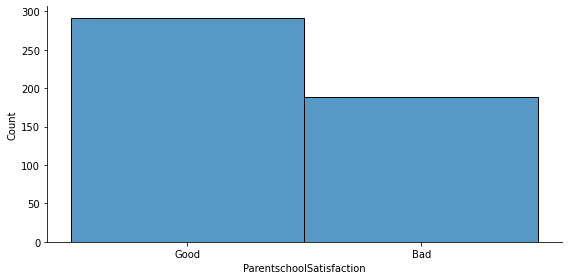

In [ ]:
print("Kind of Data:" + str(df['ParentschoolSatisfaction'].unique()))
print()
print("Number of Data:")
print(df['ParentschoolSatisfaction'].value_counts())
print()
sns.displot(data = df, x = 'ParentschoolSatisfaction', height = 4, aspect= 2)

Kind of Data:['Under-7' 'Above-7']

Number of Data:
Under-7    289
Above-7    191
Name: StudentAbsenceDays, dtype: int64



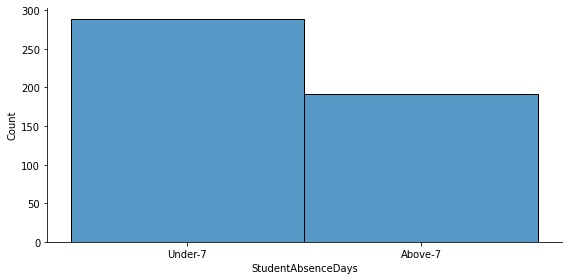

In [ ]:
print("Kind of Data:" + str(df['StudentAbsenceDays'].unique()))
print()
print("Number of Data:")
print(df['StudentAbsenceDays'].value_counts())
print()
sns.displot(data = df, x = 'StudentAbsenceDays', height = 4, aspect= 2)

Kind of Data:['M' 'L' 'H']

Number of Data:
M    211
H    142
L    127
Name: Class, dtype: int64



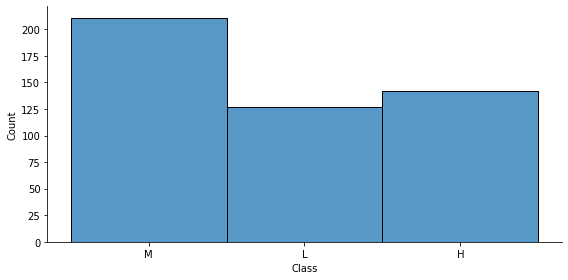

In [ ]:
print("Kind of Data:" + str(df['Class'].unique()))
print()
print("Number of Data:")
print(df['Class'].value_counts())
print()
sns.displot(data = df, x = 'Class', height = 4, aspect= 2)

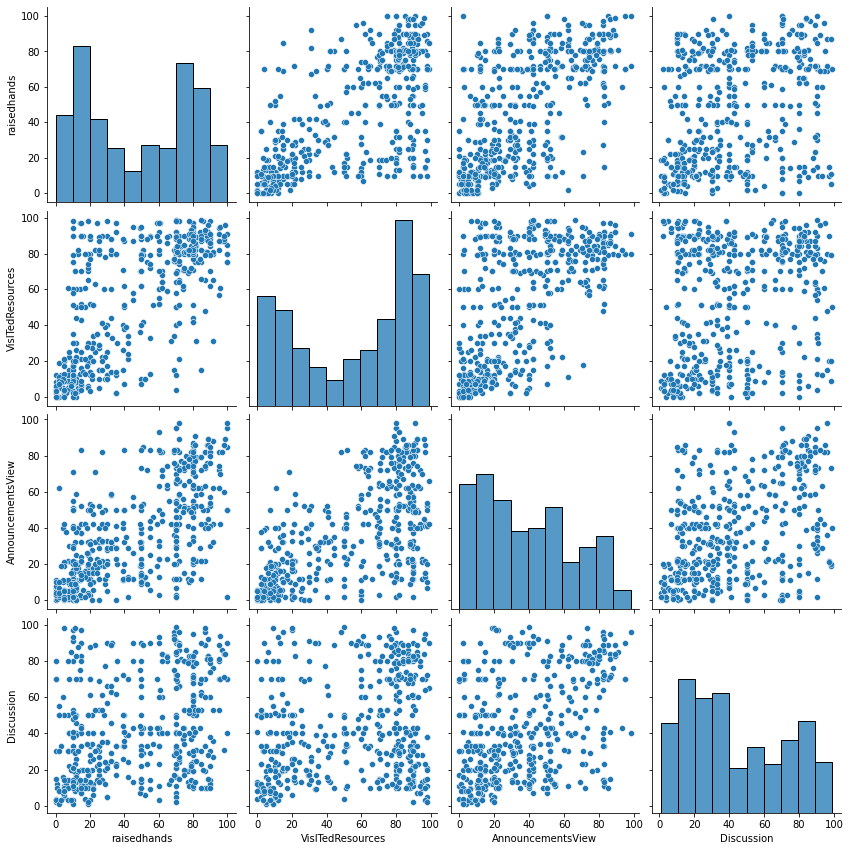

In [ ]:
sns.pairplot(df[['raisedhands','VisITedResources', 'AnnouncementsView', 'Discussion']], height = 3)

In [ ]:
#Convert to tensor needed
X_train = tf.convert_to_tensor(X_train, dtype=tf.float64)
y_train = tf.convert_to_tensor(y_train, dtype=tf.float32) 
X_test = tf.convert_to_tensor(X_test, dtype=tf.float64)
y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)

#**Model 3-layer model Relu SGD**

In [ ]:
model_3layer_RS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#Number each layer neoron and activation Function
#make ready for training
model_3layer_RS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 2s 29ms/step - loss: 1.1186 - accuracy: 0.3984 - val_loss: 0.9776 - val_accuracy: 0.4896
Epoch 2/100
24/24 [==============================] - 0s 10ms/step - loss: 0.9820 - accuracy: 0.5026 - val_loss: 0.9046 - val_accuracy: 0.5312
Epoch 3/100
24/24 [==============================] - 0s 10ms/step - loss: 0.8834 - accuracy: 0.5807 - val_loss: 0.8516 - val_accuracy: 0.5625
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 0.8086 - accuracy: 0.6302 - val_loss: 0.8078 - val_accuracy: 0.6354
Epoch 5/100
24/24 [==============================] - 0s 11ms/step - loss: 0.7485 - accuracy: 0.6719 - val_loss: 0.7753 - val_accuracy: 0.6146
Epoch 6/100
24/24 [==============================] - 0s 6ms/step - loss: 0.7015 - accuracy: 0.7109 - val_loss: 0.7459 - val_accuracy: 0.6562
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 0.6626 - accuracy: 0.7318 - val_loss: 0.7236 - val_accuracy: 0.6667
Epoch 8/1

In [ ]:
predictions_test = model_3layer_RS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test) #This for Confusion matrix for test / Using predict and y_test

prediction_train = model_3layer_RS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro") #for first row 
recall = recall_score(y_test, y_pred_test , average="macro") #first column
F1_score = f1_score(y_test, y_pred_test , average="macro") # 2(p*R) / p + R
accuracy = accuracy_score(y_test, y_pred_test) #This for Confusion matrix for train / Using predict and y_train
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.742080188784256
recall; 0.7356532356532356
F1_score: 0.7372497021407433
confusion_matrix test: 
[[19  7  0]
 [ 4 29  9]
 [ 0  6 22]]
confusion_matrix train: 
[[ 98   3   0]
 [  3 163   3]
 [  0   3 111]]


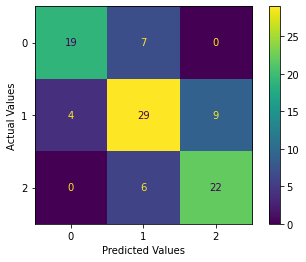

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2]) #Printing Confusion matrix
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

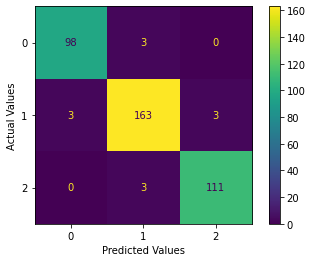

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2]) #Same as previouse
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

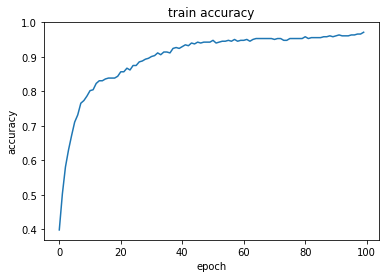

In [ ]:
plt.plot(model.history['accuracy']) #train accuracy plot
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

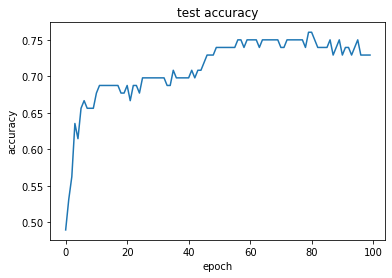

In [ ]:
plt.plot(model.history['val_accuracy']) #test accuracy plot
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

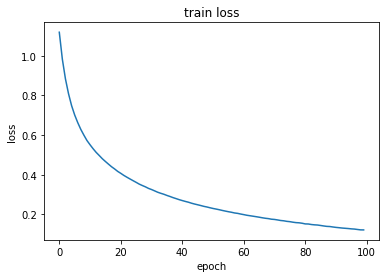

In [ ]:
plt.plot(model.history['loss']) #train loss plot
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

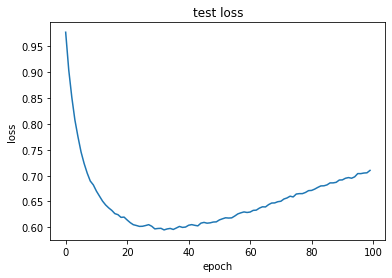

In [ ]:
plt.plot(model.history['val_loss']) #test plot loss
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer Relu Adam***

In [ ]:
model_3layer_RA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
model_3layer_RA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_RA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.1452 - accuracy: 0.4141 - val_loss: 1.1730 - val_accuracy: 0.3750
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.1060 - accuracy: 0.4375 - val_loss: 1.1434 - val_accuracy: 0.3750
Epoch 3/100
24/24 [==============================] - 0s 6ms/step - loss: 1.0734 - accuracy: 0.4714 - val_loss: 1.1209 - val_accuracy: 0.3958
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0458 - accuracy: 0.4818 - val_loss: 1.1008 - val_accuracy: 0.3958
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 1.0202 - accuracy: 0.5078 - val_loss: 1.0830 - val_accuracy: 0.4062
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9966 - accuracy: 0.5260 - val_loss: 1.0679 - val_accuracy: 0.4271
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 0.9754 - accuracy: 0.5443 - val_loss: 1.0539 - val_accuracy: 0.4271
Epoch 8/100


In [ ]:
predictions_test = model_3layer_RA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix test: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.7197971781305115
recall; 0.684065934065934
F1_score: 0.697786374382119
confusion_matrix test: 
[[19  7  0]
 [ 2 30 10]
 [ 0 11 17]]
confusion_matrix test: 
[[ 99   2   0]
 [  6 155   8]
 [  0   7 107]]


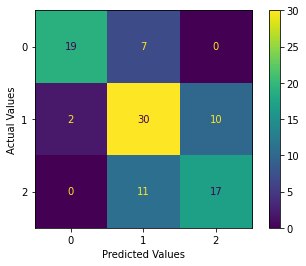

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

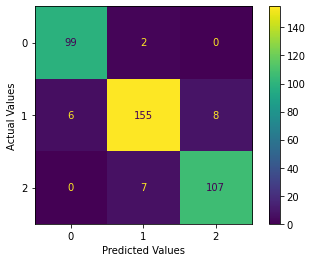

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

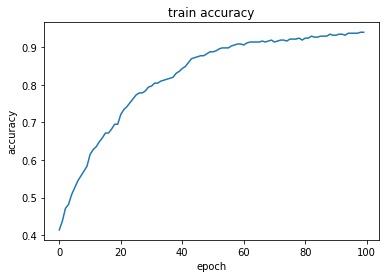

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

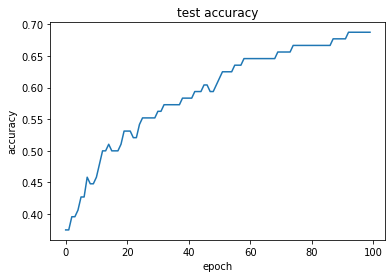

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

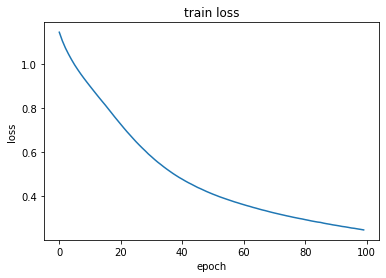

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

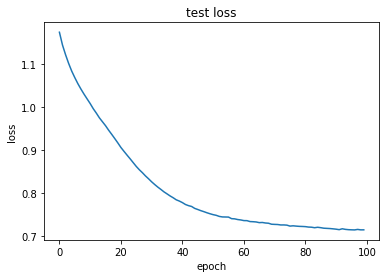

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer Relu RMS***




In [ ]:
model_3layer_RR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_RR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_RR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.2113 - accuracy: 0.3906 - val_loss: 1.1479 - val_accuracy: 0.3958
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.1554 - accuracy: 0.4271 - val_loss: 1.1091 - val_accuracy: 0.3854
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1126 - accuracy: 0.4401 - val_loss: 1.0767 - val_accuracy: 0.3958
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0730 - accuracy: 0.4505 - val_loss: 1.0456 - val_accuracy: 0.4375
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0366 - accuracy: 0.4766 - val_loss: 1.0179 - val_accuracy: 0.4479
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0028 - accuracy: 0.4922 - val_loss: 0.9921 - val_accuracy: 0.4896
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9713 - accuracy: 0.5052 - val_loss: 0.9677 - val_accuracy: 0.5104
Epoch 8/100


In [ ]:
predictions_test = model_3layer_RR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.739583
precision: 0.7569960671986179
recall; 0.7435897435897436
F1_score: 0.7477705771574167
confusion_matrix test: 
[[19  7  0]
 [ 3 30  9]
 [ 0  6 22]]
confusion_matrix train: 
[[ 99   2   0]
 [  5 156   8]
 [  0  10 104]]


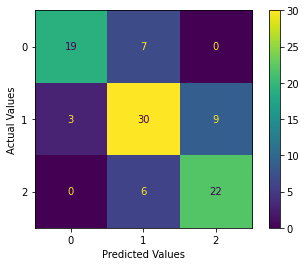

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

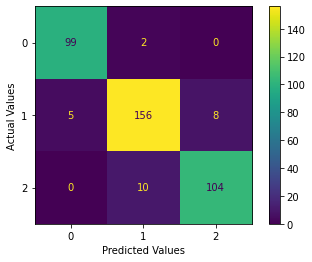

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

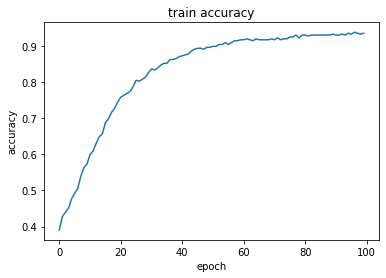

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

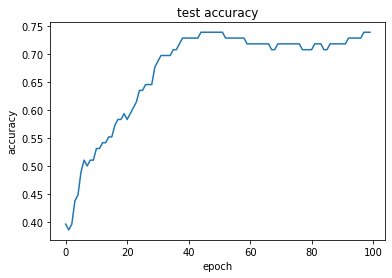

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

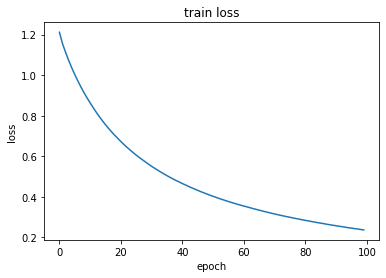

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

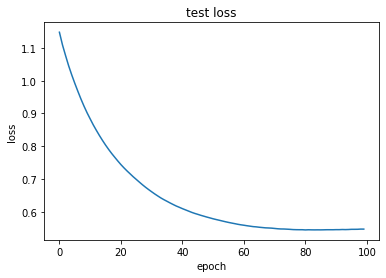

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer tanh SGD***


In [ ]:
model_3layer_tS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_tS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_tS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 15ms/step - loss: 1.0363 - accuracy: 0.4974 - val_loss: 0.9652 - val_accuracy: 0.5208
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9081 - accuracy: 0.5625 - val_loss: 0.8806 - val_accuracy: 0.5625
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8257 - accuracy: 0.5990 - val_loss: 0.8253 - val_accuracy: 0.5938
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 0.7674 - accuracy: 0.6224 - val_loss: 0.7863 - val_accuracy: 0.6042
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 0.7215 - accuracy: 0.6797 - val_loss: 0.7580 - val_accuracy: 0.6042
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7109 - val_loss: 0.7350 - val_accuracy: 0.5833
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 0.6535 - accuracy: 0.7292 - val_loss: 0.7164 - val_accuracy: 0.6042
Epoch 8/100


In [ ]:
predictions_test = model_3layer_tS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7249443460088137
recall; 0.7118437118437119
F1_score: 0.7172277315659025
confusion_matrix test: 
[[19  7  0]
 [ 4 29  9]
 [ 0  8 20]]
confusion_matrix train: 
[[ 99   1   1]
 [  3 162   4]
 [  0   4 110]]


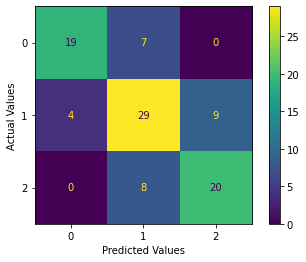

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

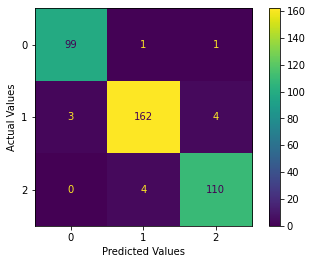

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

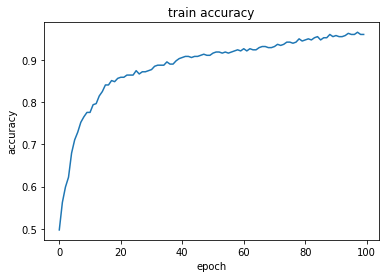

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

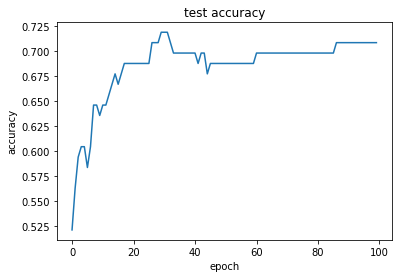

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

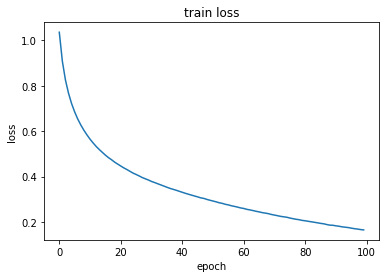

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

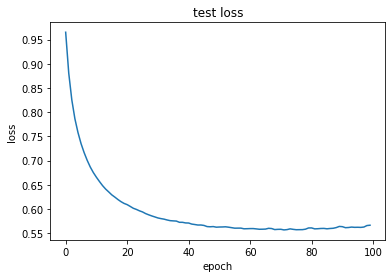

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer tanh Adam***

In [ ]:
model_3layer_tA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_tA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_tA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.1174 - accuracy: 0.3932 - val_loss: 1.0284 - val_accuracy: 0.4896
Epoch 2/100
24/24 [==============================] - 0s 6ms/step - loss: 1.0581 - accuracy: 0.4714 - val_loss: 0.9832 - val_accuracy: 0.5312
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0085 - accuracy: 0.5234 - val_loss: 0.9458 - val_accuracy: 0.5625
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9658 - accuracy: 0.5547 - val_loss: 0.9138 - val_accuracy: 0.5833
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9291 - accuracy: 0.5833 - val_loss: 0.8857 - val_accuracy: 0.5729
Epoch 6/100
24/24 [==============================] - 0s 7ms/step - loss: 0.8951 - accuracy: 0.6068 - val_loss: 0.8618 - val_accuracy: 0.5833
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8667 - accuracy: 0.6328 - val_loss: 0.8419 - val_accuracy: 0.6146
Epoch 8/100


In [ ]:
predictions_test = model_3layer_tA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7454106280193237
recall; 0.7405372405372406
F1_score: 0.7401882784301245
confusion_matrix test: 
[[20  6  0]
 [ 3 28 11]
 [ 0  6 22]]
confusion_matrix train: 
[[ 96   5   0]
 [  7 148  14]
 [  1  12 101]]


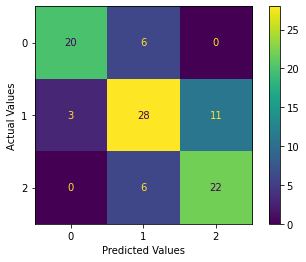

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

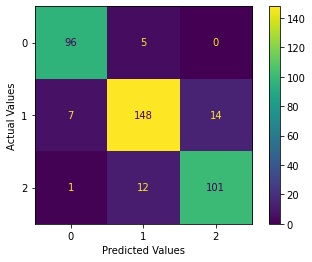

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

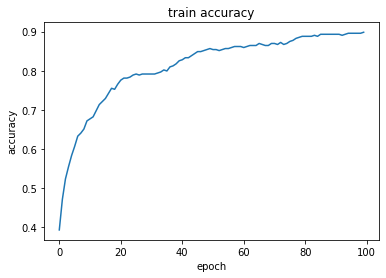

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

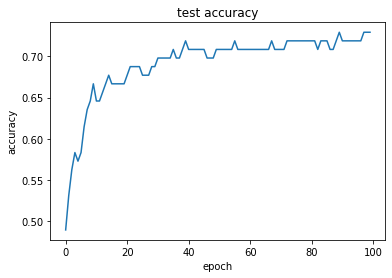

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

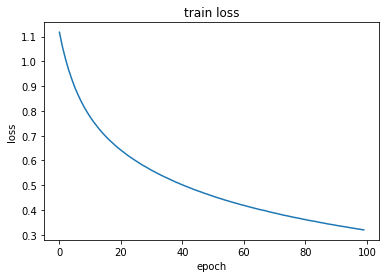

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

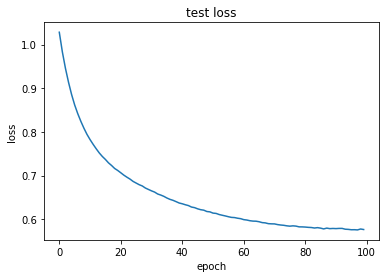

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer tanh RMS***

In [ ]:
model_3layer_tR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_tR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_tR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 14ms/step - loss: 1.1232 - accuracy: 0.3932 - val_loss: 1.0100 - val_accuracy: 0.5208
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0523 - accuracy: 0.4479 - val_loss: 0.9592 - val_accuracy: 0.5521
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9993 - accuracy: 0.4870 - val_loss: 0.9183 - val_accuracy: 0.5625
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9542 - accuracy: 0.5026 - val_loss: 0.8850 - val_accuracy: 0.5625
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9152 - accuracy: 0.5312 - val_loss: 0.8571 - val_accuracy: 0.5938
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8819 - accuracy: 0.5469 - val_loss: 0.8345 - val_accuracy: 0.5938
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8525 - accuracy: 0.5651 - val_loss: 0.8146 - val_accuracy: 0.6250
Epoch 8/100


In [ ]:
predictions_test = model_3layer_tR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_test)

Accuracy: 0.729167
precision: 0.7440143564581345
recall; 0.7316849816849818
F1_score: 0.7366755759831473
confusion_matrix test: 
[[19  7  0]
 [ 4 30  8]
 [ 0  7 21]]
confusion_matrix train: 
[[19  7  0]
 [ 4 30  8]
 [ 0  7 21]]


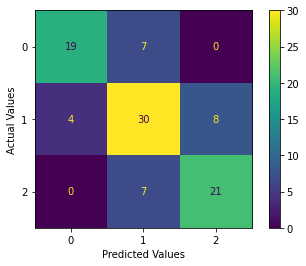

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

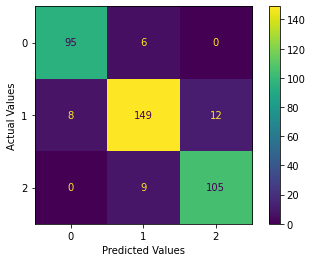

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

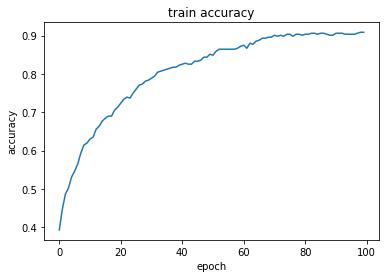

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

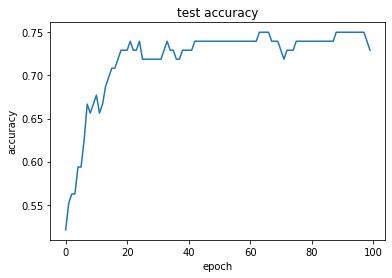

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

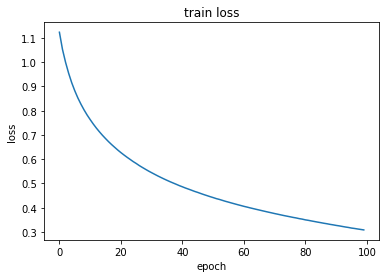

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

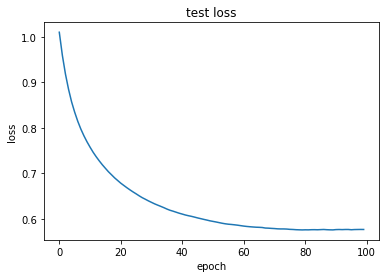

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer sigmoid SGD***

In [ ]:
model_3layer_sS = keras.Sequential(
    [
        keras.layers.Dense(32, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_sS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_sS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 18ms/step - loss: 1.1134 - accuracy: 0.3125 - val_loss: 1.0924 - val_accuracy: 0.3646
Epoch 2/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0791 - accuracy: 0.3880 - val_loss: 1.0730 - val_accuracy: 0.4271
Epoch 3/1000
24/24 [==============================] - 0s 9ms/step - loss: 1.0634 - accuracy: 0.4505 - val_loss: 1.0644 - val_accuracy: 0.4375
Epoch 4/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0568 - accuracy: 0.4479 - val_loss: 1.0598 - val_accuracy: 0.4375
Epoch 5/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0523 - accuracy: 0.4401 - val_loss: 1.0567 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 6ms/step - loss: 1.0488 - accuracy: 0.4401 - val_loss: 1.0540 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 8ms/step - loss: 1.0455 - accuracy: 0.4401 - val_loss: 1.0512 - val_accuracy: 0.4375
Epoch

In [ ]:
predictions_test = model_3layer_sS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix train: ")
print(cm_test)
print("confusion_matrix test: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7276422764227641
recall; 0.7286324786324787
F1_score: 0.7277168172351338
confusion_matrix train: 
[[20  6  0]
 [ 5 28  9]
 [ 0  7 21]]
confusion_matrix test: 
[[ 97   4   0]
 [  4 156   9]
 [  0   6 108]]


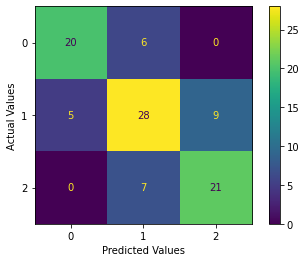

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

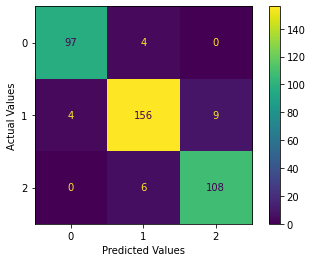

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

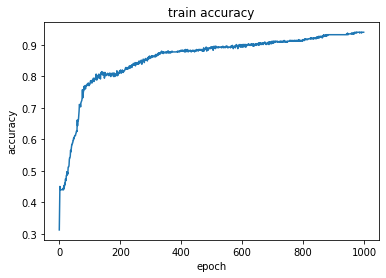

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

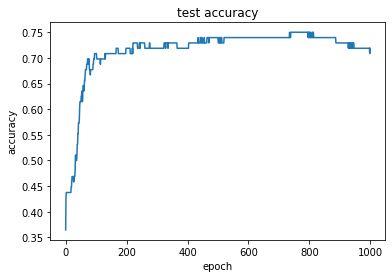

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

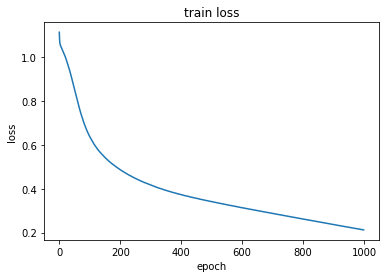

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

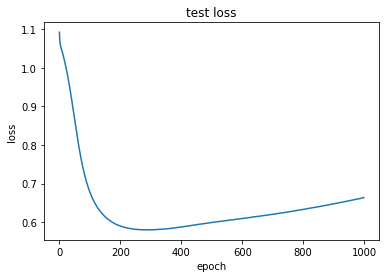

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer sigmoid Adam***

In [ ]:
model_3layer_sA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_sA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_sA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 16ms/step - loss: 1.2087 - accuracy: 0.4401 - val_loss: 1.1972 - val_accuracy: 0.4375
Epoch 2/1000
24/24 [==============================] - 0s 6ms/step - loss: 1.1757 - accuracy: 0.4401 - val_loss: 1.1638 - val_accuracy: 0.4375
Epoch 3/1000
24/24 [==============================] - 0s 7ms/step - loss: 1.1441 - accuracy: 0.4401 - val_loss: 1.1374 - val_accuracy: 0.4375
Epoch 4/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.1184 - accuracy: 0.4401 - val_loss: 1.1115 - val_accuracy: 0.4375
Epoch 5/1000
24/24 [==============================] - 0s 9ms/step - loss: 1.0961 - accuracy: 0.4401 - val_loss: 1.0884 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0757 - accuracy: 0.4401 - val_loss: 1.0707 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 6ms/step - loss: 1.0595 - accuracy: 0.4401 - val_loss: 1.0557 - val_accuracy: 0.4375
Epoch

In [ ]:
predictions_test = model_3layer_sA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7408529741863076
recall; 0.7326007326007327
F1_score: 0.7364202904558582
confusion_matrix test: 
[[20  6  0]
 [ 5 30  7]
 [ 0  8 20]]
confusion_matrix train: 
[[ 98   3   0]
 [  3 160   6]
 [  0   6 108]]


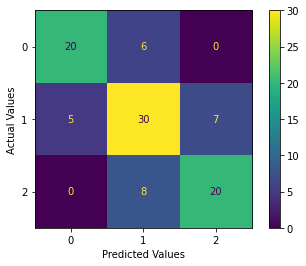

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

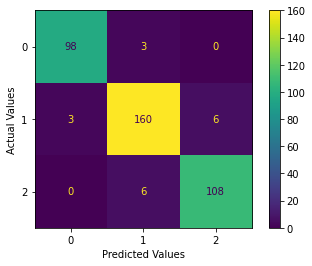

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

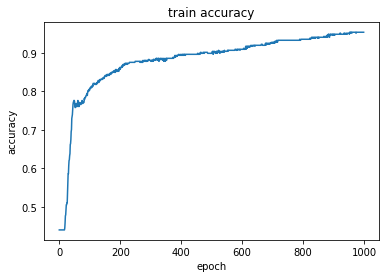

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

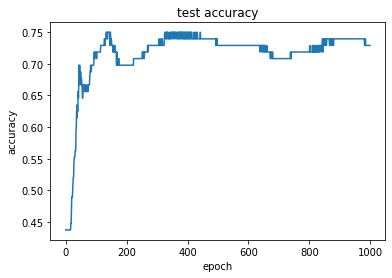

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

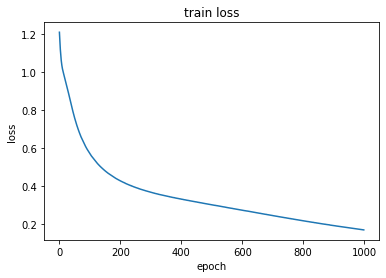

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

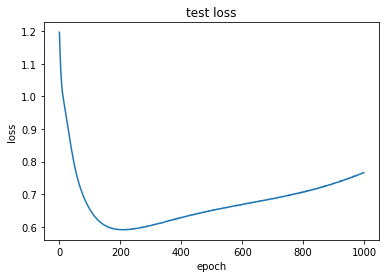

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 3-layer sigmoid RMS***

In [ ]:
model_3layer_sR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_3layer_sR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_3layer_sR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 13ms/step - loss: 1.4924 - accuracy: 0.2630 - val_loss: 1.4223 - val_accuracy: 0.2708
Epoch 2/1000
24/24 [==============================] - 0s 6ms/step - loss: 1.4057 - accuracy: 0.2630 - val_loss: 1.3498 - val_accuracy: 0.2708
Epoch 3/1000
24/24 [==============================] - 0s 7ms/step - loss: 1.3359 - accuracy: 0.2630 - val_loss: 1.2868 - val_accuracy: 0.2708
Epoch 4/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.2751 - accuracy: 0.2630 - val_loss: 1.2331 - val_accuracy: 0.2708
Epoch 5/1000
24/24 [==============================] - 0s 6ms/step - loss: 1.2220 - accuracy: 0.2630 - val_loss: 1.1854 - val_accuracy: 0.2708
Epoch 6/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.1768 - accuracy: 0.2630 - val_loss: 1.1467 - val_accuracy: 0.2708
Epoch 7/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.1403 - accuracy: 0.2630 - val_loss: 1.1151 - val_accuracy: 0.2708
Epoch

In [ ]:
predictions_test = model_3layer_sR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7398653198653199
recall; 0.7316849816849818
F1_score: 0.7354696071522336
confusion_matrix test: 
[[19  7  0]
 [ 6 30  6]
 [ 0  7 21]]
confusion_matrix train: 
[[ 98   3   0]
 [  3 158   8]
 [  0   8 106]]


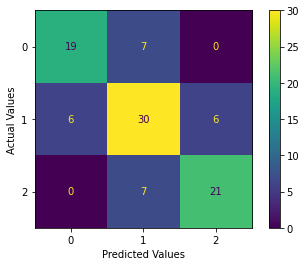

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

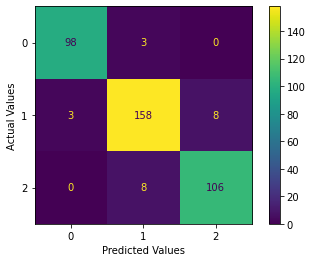

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

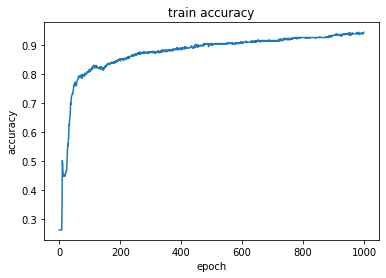

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

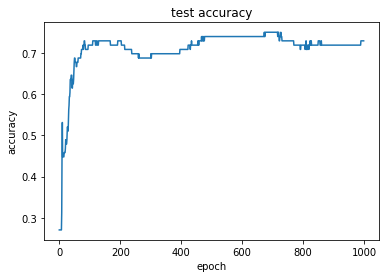

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

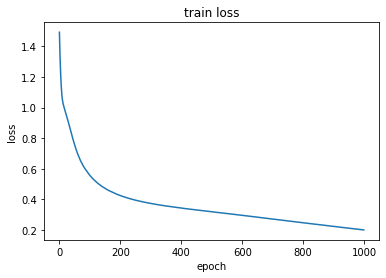

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

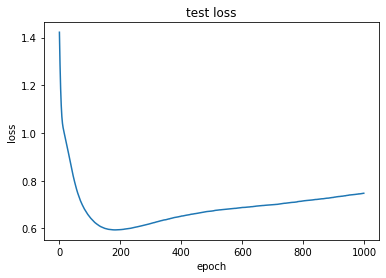

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu SGD**

In [ ]:
model_4layer_RS = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.2121 - accuracy: 0.3932 - val_loss: 1.0693 - val_accuracy: 0.4167
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0528 - accuracy: 0.4531 - val_loss: 0.9881 - val_accuracy: 0.4375
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9636 - accuracy: 0.5104 - val_loss: 0.9332 - val_accuracy: 0.5104
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8908 - accuracy: 0.6068 - val_loss: 0.8829 - val_accuracy: 0.5104
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8239 - accuracy: 0.6589 - val_loss: 0.8366 - val_accuracy: 0.5938
Epoch 6/100
24/24 [==============================] - 0s 6ms/step - loss: 0.7622 - accuracy: 0.7344 - val_loss: 0.7951 - val_accuracy: 0.5938
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 0.7083 - accuracy: 0.7552 - val_loss: 0.7592 - val_accuracy: 0.6354
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.750000
precision: 0.7830769230769231
recall; 0.7387057387057387
F1_score: 0.7541599570585079
confusion_matrix test: 
[[18  8  0]
 [ 2 34  6]
 [ 0  8 20]]
confusion_matrix train: 
[[101   0   0]
 [  2 167   0]
 [  0   2 112]]


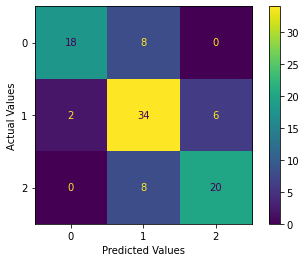

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

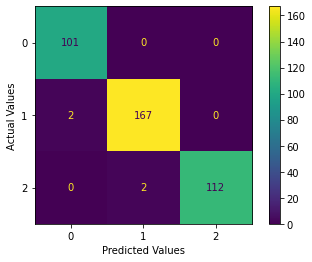

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

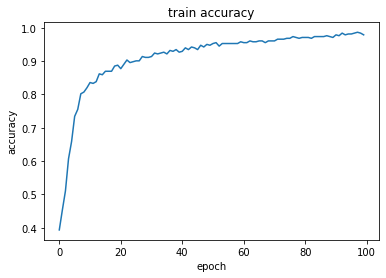

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

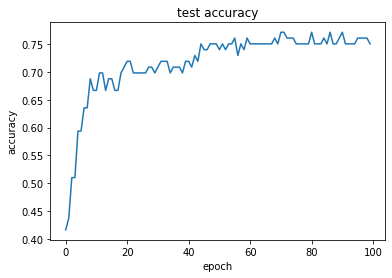

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

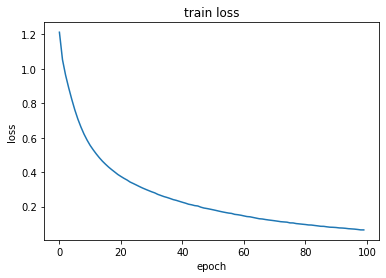

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

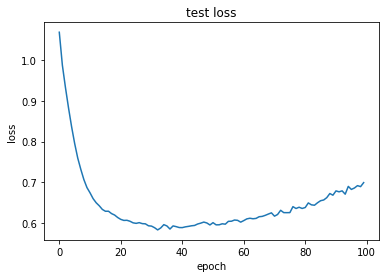

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer Relu Adam***

In [ ]:
model_4layer_RA = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
model_4layer_RA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_4layer_RA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 14ms/step - loss: 1.1426 - accuracy: 0.3385 - val_loss: 1.1214 - val_accuracy: 0.4062
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0713 - accuracy: 0.4505 - val_loss: 1.0687 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0188 - accuracy: 0.5260 - val_loss: 1.0302 - val_accuracy: 0.5208
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9744 - accuracy: 0.5755 - val_loss: 0.9995 - val_accuracy: 0.5312
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9337 - accuracy: 0.6276 - val_loss: 0.9725 - val_accuracy: 0.5208
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8946 - accuracy: 0.6823 - val_loss: 0.9450 - val_accuracy: 0.5625
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 0.8562 - accuracy: 0.7031 - val_loss: 0.9188 - val_accuracy: 0.5521
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7618471466021375
recall; 0.7219169719169719
F1_score: 0.7345029239766082
confusion_matrix test: 
[[17  9  0]
 [ 2 32  8]
 [ 0  7 21]]
confusion_matrix train: 
[[ 99   2   0]
 [  2 166   1]
 [  0   2 112]]


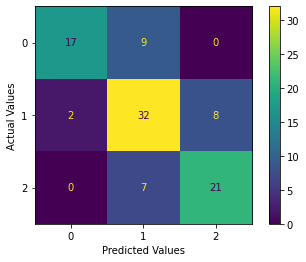

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

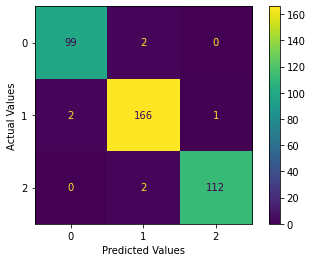

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

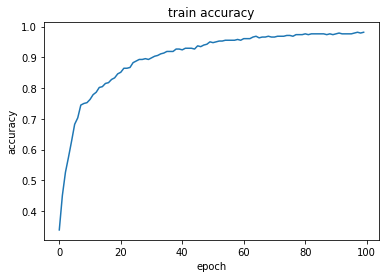

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

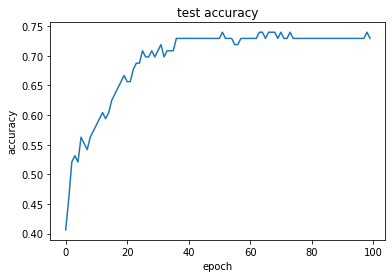

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

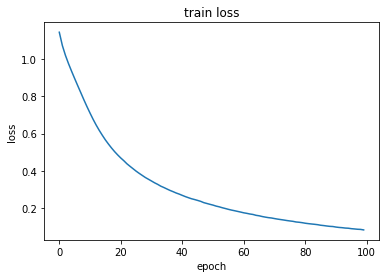

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

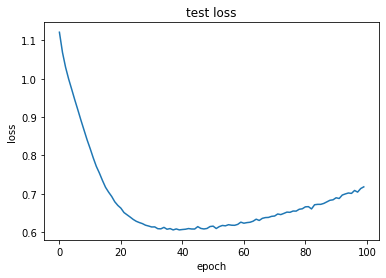

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer Relu RMS***

In [ ]:
model_4layer_RR = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_RR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_4layer_RR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.0321 - accuracy: 0.4453 - val_loss: 1.0082 - val_accuracy: 0.4792
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9824 - accuracy: 0.4974 - val_loss: 0.9814 - val_accuracy: 0.4792
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9447 - accuracy: 0.5391 - val_loss: 0.9597 - val_accuracy: 0.4792
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9102 - accuracy: 0.5833 - val_loss: 0.9381 - val_accuracy: 0.4792
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8780 - accuracy: 0.6172 - val_loss: 0.9185 - val_accuracy: 0.4896
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8474 - accuracy: 0.6224 - val_loss: 0.8982 - val_accuracy: 0.5417
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8174 - accuracy: 0.6432 - val_loss: 0.8793 - val_accuracy: 0.5521
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7440143564581345
recall; 0.7316849816849818
F1_score: 0.7366755759831473
confusion_matrix test: 
[[19  7  0]
 [ 4 30  8]
 [ 0  7 21]]
confusion_matrix train: 
[[100   0   1]
 [  3 164   2]
 [  0   2 112]]


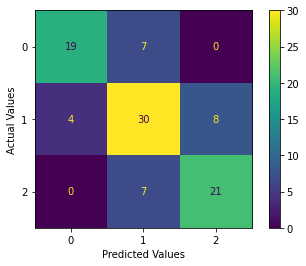

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

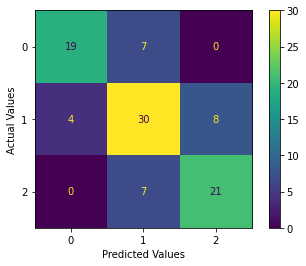

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

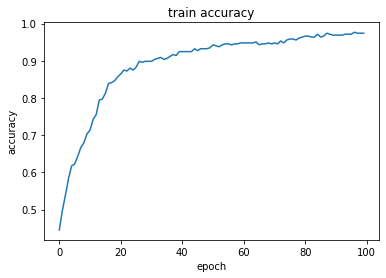

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

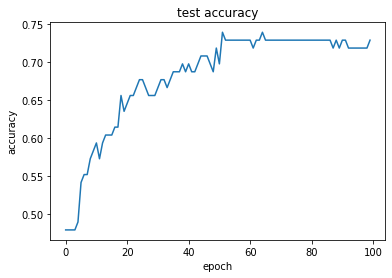

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

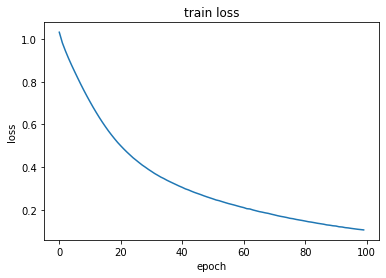

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

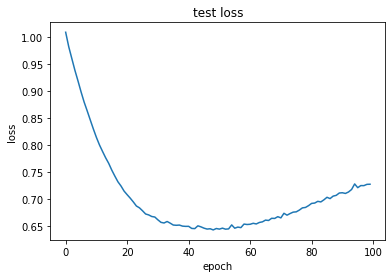

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer tanh SGD***

In [ ]:
model_4layer_tS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_tS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_4layer_tS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 14ms/step - loss: 1.0435 - accuracy: 0.4635 - val_loss: 1.0313 - val_accuracy: 0.4792
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9218 - accuracy: 0.5990 - val_loss: 0.9555 - val_accuracy: 0.5417
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8463 - accuracy: 0.6432 - val_loss: 0.9069 - val_accuracy: 0.5833
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 0.7932 - accuracy: 0.6745 - val_loss: 0.8707 - val_accuracy: 0.6146
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 0.7522 - accuracy: 0.6927 - val_loss: 0.8427 - val_accuracy: 0.6146
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.7185 - accuracy: 0.7057 - val_loss: 0.8193 - val_accuracy: 0.6250
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.7188 - val_loss: 0.7999 - val_accuracy: 0.6354
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7132928905917412
recall; 0.7206959706959708
F1_score: 0.7166985572536957
confusion_matrix test: 
[[20  6  0]
 [ 7 27  8]
 [ 0  7 21]]
confusion_matrix train: 
[[100   1   0]
 [  2 164   3]
 [  0   1 113]]


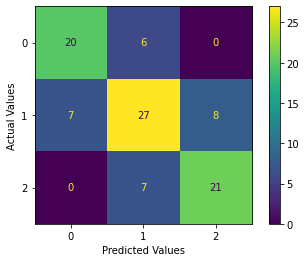

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

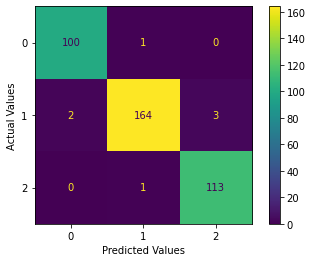

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

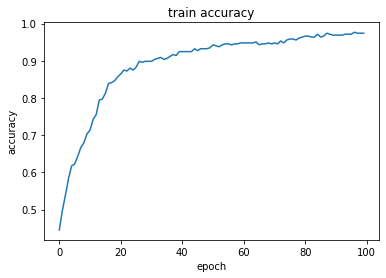

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

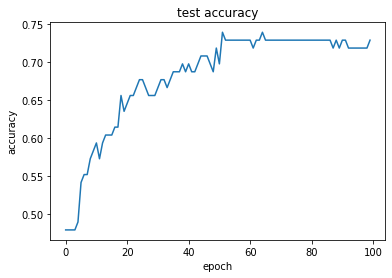

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

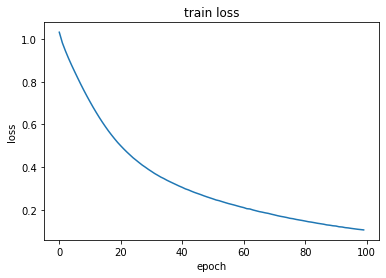

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

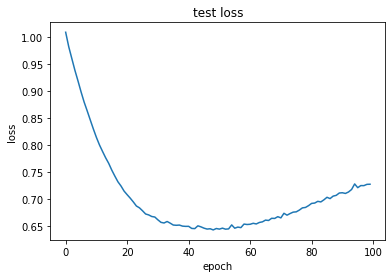

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer tanh Adam***

In [ ]:
model_4layer_tA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_tA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_4layer_tA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 14ms/step - loss: 1.1547 - accuracy: 0.3464 - val_loss: 1.0701 - val_accuracy: 0.3854
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0811 - accuracy: 0.4089 - val_loss: 1.0127 - val_accuracy: 0.4271
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0195 - accuracy: 0.4531 - val_loss: 0.9686 - val_accuracy: 0.4479
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9692 - accuracy: 0.5052 - val_loss: 0.9332 - val_accuracy: 0.4896
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 0.9252 - accuracy: 0.5391 - val_loss: 0.9043 - val_accuracy: 0.5104
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8873 - accuracy: 0.5703 - val_loss: 0.8784 - val_accuracy: 0.5312
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 0.8551 - accuracy: 0.5938 - val_loss: 0.8575 - val_accuracy: 0.5521
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7076388888888889
recall; 0.7127594627594628
F1_score: 0.7087630113773905
confusion_matrix test: 
[[20  6  0]
 [ 5 26 11]
 [ 0  7 21]]
confusion_matrix train: 
[[ 97   4   0]
 [  6 150  13]
 [  0   8 106]]


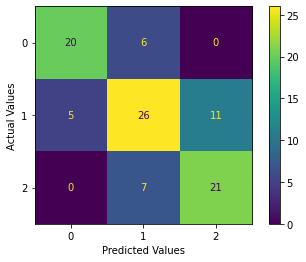

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

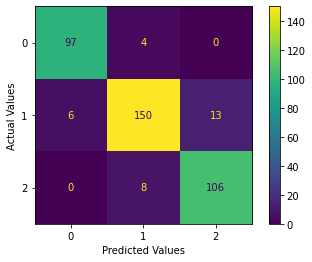

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

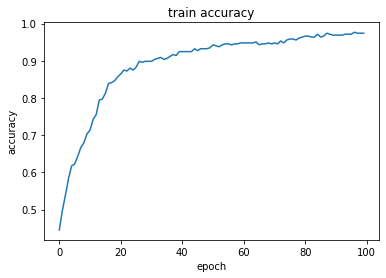

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

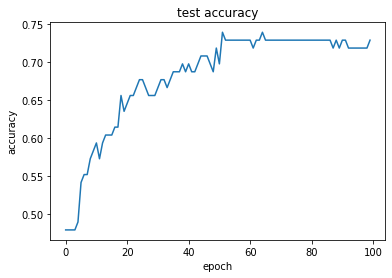

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

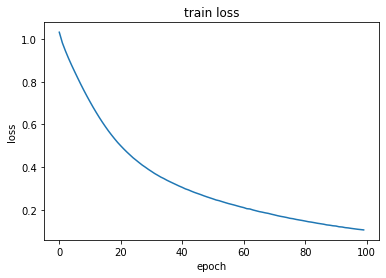

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

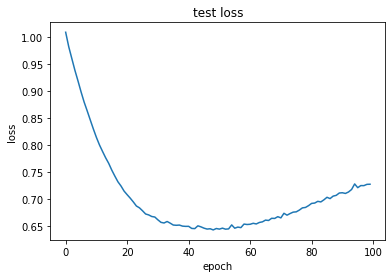

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer tanh RMS***

In [ ]:
model_4layer_tR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_tR.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_4layer_tR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.1073 - accuracy: 0.4349 - val_loss: 1.1067 - val_accuracy: 0.3333
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0470 - accuracy: 0.4661 - val_loss: 1.0526 - val_accuracy: 0.3854
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9970 - accuracy: 0.5052 - val_loss: 1.0091 - val_accuracy: 0.4271
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 0.9547 - accuracy: 0.5234 - val_loss: 0.9730 - val_accuracy: 0.4583
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 0.9184 - accuracy: 0.5599 - val_loss: 0.9416 - val_accuracy: 0.5000
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 0.8860 - accuracy: 0.5964 - val_loss: 0.9155 - val_accuracy: 0.4896
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 0.8569 - accuracy: 0.5990 - val_loss: 0.8924 - val_accuracy: 0.4896
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7233909926757051
recall; 0.7158119658119658
F1_score: 0.7180137591759866
confusion_matrix test: 
[[19  7  0]
 [ 4 28 10]
 [ 0  7 21]]
confusion_matrix train: 
[[ 98   3   0]
 [  5 153  11]
 [  0   6 108]]


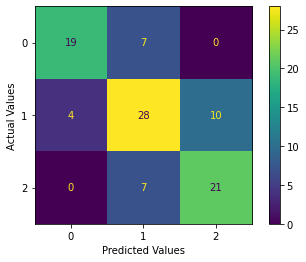

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

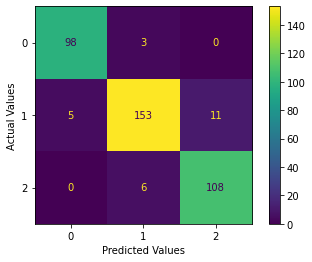

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

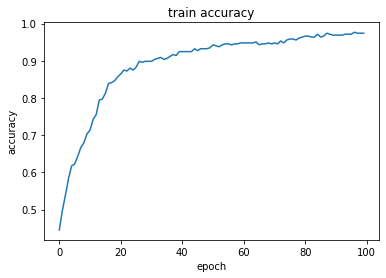

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

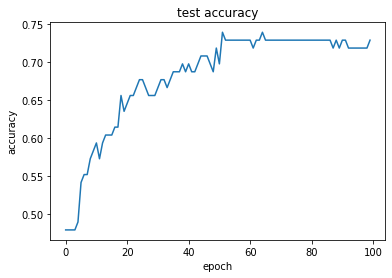

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

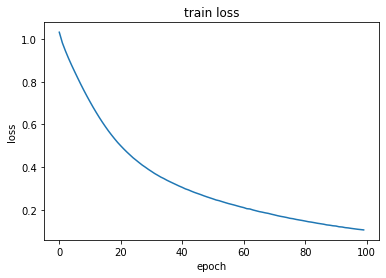

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

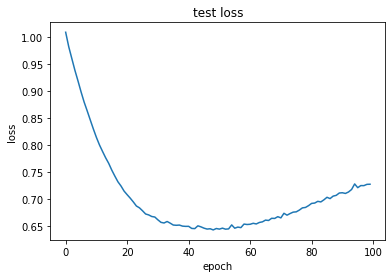

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer sigmoid SGD***

In [ ]:
model_4layer_sS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_sS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_4layer_sS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 13ms/step - loss: 1.1620 - accuracy: 0.4401 - val_loss: 1.1299 - val_accuracy: 0.4375
Epoch 2/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.1091 - accuracy: 0.4401 - val_loss: 1.0973 - val_accuracy: 0.4375
Epoch 3/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.0876 - accuracy: 0.4401 - val_loss: 1.0836 - val_accuracy: 0.4375
Epoch 4/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.0786 - accuracy: 0.4401 - val_loss: 1.0779 - val_accuracy: 0.4375
Epoch 5/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.0750 - accuracy: 0.4401 - val_loss: 1.0749 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0735 - accuracy: 0.4401 - val_loss: 1.0737 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0723 - accuracy: 0.4401 - val_loss: 1.0727 - val_accuracy: 0.4375
Epoch

In [ ]:
predictions_test = model_4layer_sS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.750000
precision: 0.7573260073260073
recall; 0.7573260073260073
F1_score: 0.7573260073260073
confusion_matrix test: 
[[21  5  0]
 [ 5 30  7]
 [ 0  7 21]]
confusion_matrix train: 
[[ 95   6   0]
 [  6 149  14]
 [  0  11 103]]


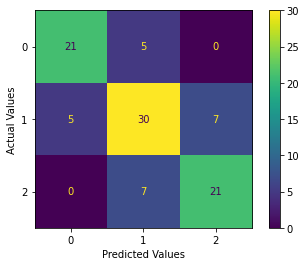

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

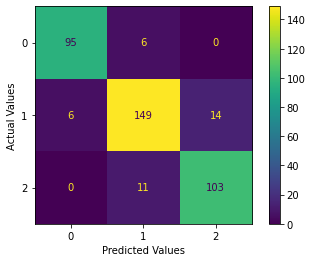

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

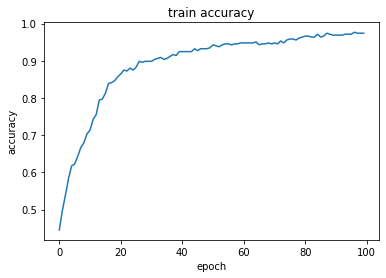

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

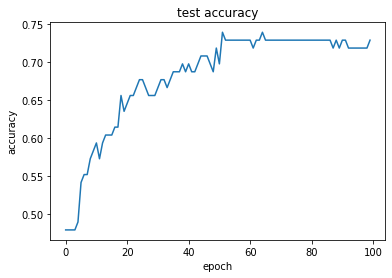

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

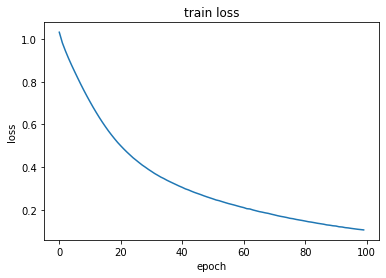

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

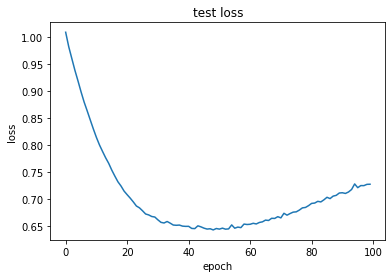

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer sigmoid Adam***

In [ ]:
model_4layer_sA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_sA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_4layer_sA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 14ms/step - loss: 1.1293 - accuracy: 0.2969 - val_loss: 1.1220 - val_accuracy: 0.2917
Epoch 2/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.1155 - accuracy: 0.2969 - val_loss: 1.1087 - val_accuracy: 0.2917
Epoch 3/1000
24/24 [==============================] - 0s 6ms/step - loss: 1.1032 - accuracy: 0.2969 - val_loss: 1.0986 - val_accuracy: 0.2917
Epoch 4/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0937 - accuracy: 0.3021 - val_loss: 1.0896 - val_accuracy: 0.3125
Epoch 5/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0856 - accuracy: 0.3750 - val_loss: 1.0827 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0791 - accuracy: 0.4635 - val_loss: 1.0770 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 5ms/step - loss: 1.0735 - accuracy: 0.4401 - val_loss: 1.0726 - val_accuracy: 0.4375
Epoch

In [ ]:
predictions_test = model_4layer_sA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.725174449812131
recall; 0.706959706959707
F1_score: 0.7145949288806431
confusion_matrix test: 
[[18  8  0]
 [ 5 30  7]
 [ 0  8 20]]
confusion_matrix train: 
[[ 99   2   0]
 [  2 160   7]
 [  0   4 110]]


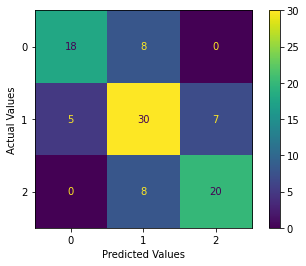

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

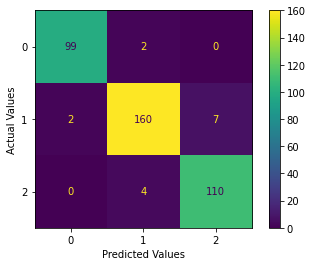

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

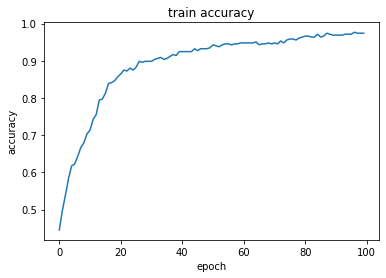

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

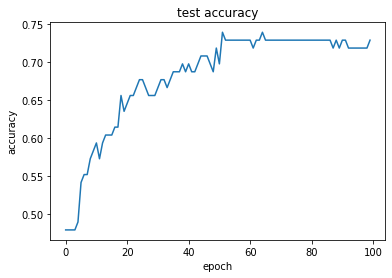

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

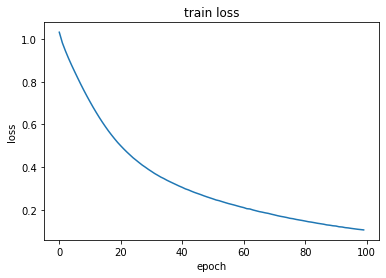

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

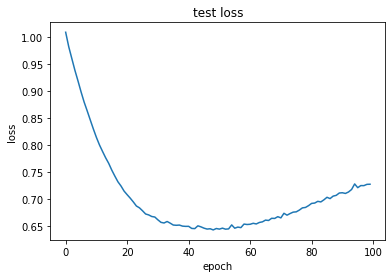

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#***Model 4-layer sigmoid RMS***

In [ ]:
model_4layer_sR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layer_sR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_4layer_sR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 9ms/step - loss: 1.1172 - accuracy: 0.2630 - val_loss: 1.1096 - val_accuracy: 0.2708
Epoch 2/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.1030 - accuracy: 0.2630 - val_loss: 1.0983 - val_accuracy: 0.2812
Epoch 3/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0928 - accuracy: 0.3411 - val_loss: 1.0900 - val_accuracy: 0.3854
Epoch 4/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0840 - accuracy: 0.4531 - val_loss: 1.0828 - val_accuracy: 0.4375
Epoch 5/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0772 - accuracy: 0.4401 - val_loss: 1.0771 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0715 - accuracy: 0.4401 - val_loss: 1.0723 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0664 - accuracy: 0.4401 - val_loss: 1.0679 - val_accuracy: 0.4375
Epoch 

In [ ]:
predictions_test = model_4layer_sR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.739583
precision: 0.746382437299174
recall; 0.7493894993894994
F1_score: 0.7477765312261191
confusion_matrix test: 
[[21  5  0]
 [ 5 29  8]
 [ 0  7 21]]
confusion_matrix train: 
[[ 98   3   0]
 [  4 158   7]
 [  0   6 108]]


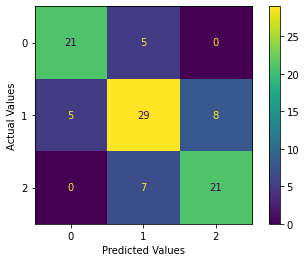

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

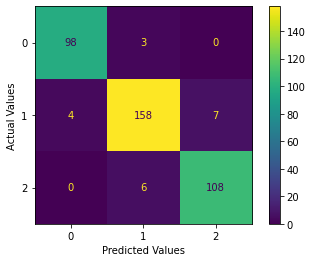

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

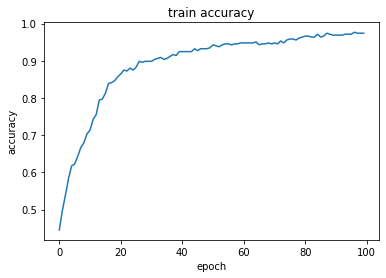

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

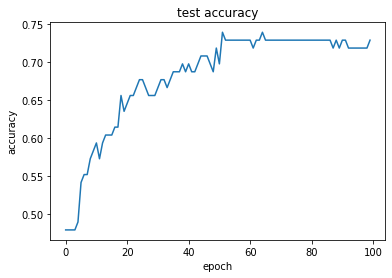

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

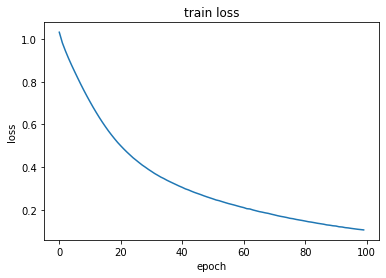

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

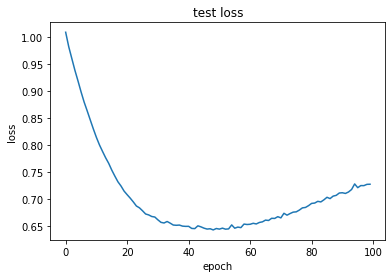

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu SGD**

In [ ]:
model_5layer_RS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_RS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_RS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 25ms/step - loss: 1.1199 - accuracy: 0.4323 - val_loss: 1.0260 - val_accuracy: 0.4583
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0421 - accuracy: 0.4557 - val_loss: 1.0026 - val_accuracy: 0.4375
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0016 - accuracy: 0.4844 - val_loss: 0.9783 - val_accuracy: 0.5000
Epoch 4/100
24/24 [==============================] - 0s 2ms/step - loss: 0.9632 - accuracy: 0.5260 - val_loss: 0.9454 - val_accuracy: 0.5208
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9206 - accuracy: 0.5703 - val_loss: 0.9081 - val_accuracy: 0.5938
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8716 - accuracy: 0.6224 - val_loss: 0.8699 - val_accuracy: 0.6354
Epoch 7/100
24/24 [==============================] - 0s 2ms/step - loss: 0.8205 - accuracy: 0.6771 - val_loss: 0.8299 - val_accuracy: 0.6562
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7590476190476191
recall; 0.718864468864469
F1_score: 0.7334432944106029
confusion_matrix test: 
[[18  8  0]
 [ 3 33  6]
 [ 0  9 19]]
confusion_matrix train: 
[[101   0   0]
 [  2 166   1]
 [  0   0 114]]


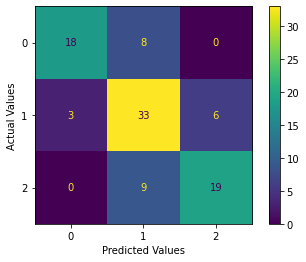

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

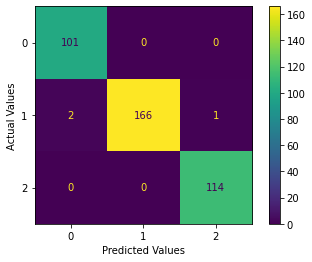

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

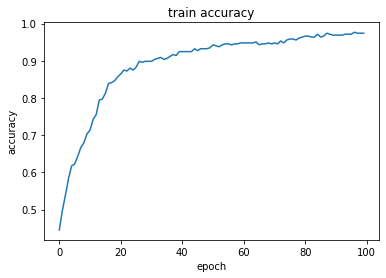

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

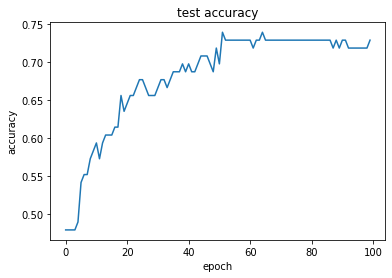

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

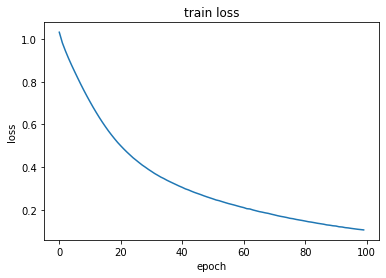

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

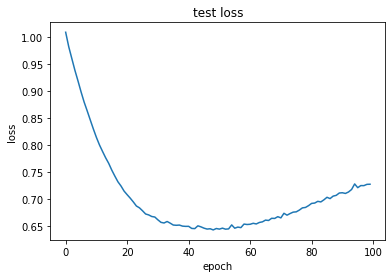

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu Adam**

In [ ]:
model_5layer_RA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_RA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_RA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.1561 - accuracy: 0.3281 - val_loss: 1.1471 - val_accuracy: 0.3542
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1293 - accuracy: 0.3724 - val_loss: 1.1264 - val_accuracy: 0.3958
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1064 - accuracy: 0.3958 - val_loss: 1.1105 - val_accuracy: 0.4167
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0868 - accuracy: 0.4401 - val_loss: 1.0985 - val_accuracy: 0.4271
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0700 - accuracy: 0.4688 - val_loss: 1.0871 - val_accuracy: 0.4583
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0548 - accuracy: 0.4870 - val_loss: 1.0766 - val_accuracy: 0.4792
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0402 - accuracy: 0.5026 - val_loss: 1.0660 - val_accuracy: 0.4583
Epoch 8/100
2

In [ ]:
predictions_test = model_5layer_RA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7356797791580401
recall; 0.7197802197802198
F1_score: 0.7264836969270467
confusion_matrix test: 
[[19  7  0]
 [ 4 30  8]
 [ 0  8 20]]
confusion_matrix train: 
[[ 99   2   0]
 [  6 157   6]
 [  0   8 106]]


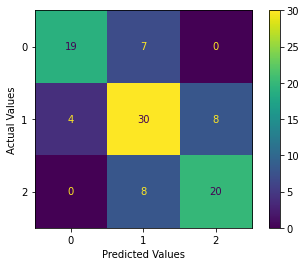

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

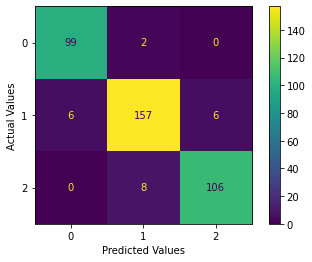

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

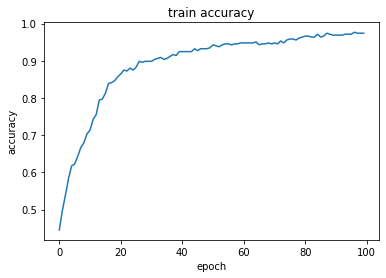

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

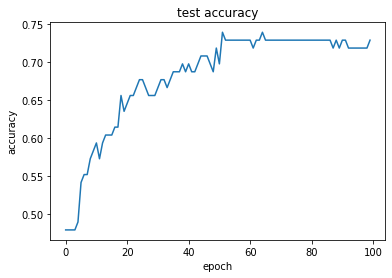

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

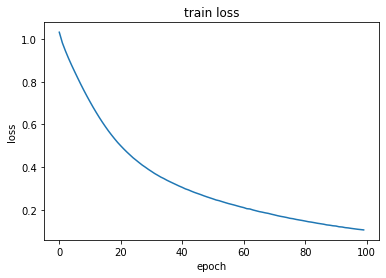

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

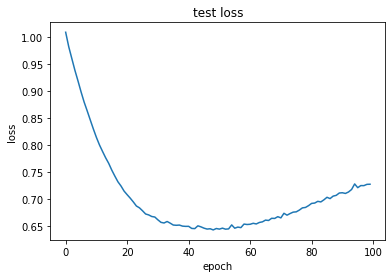

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu RSM**

In [ ]:
model_5layer_RR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_RR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_RR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.1539 - accuracy: 0.2630 - val_loss: 1.1212 - val_accuracy: 0.2500
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1288 - accuracy: 0.2995 - val_loss: 1.1081 - val_accuracy: 0.2708
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1136 - accuracy: 0.3203 - val_loss: 1.1013 - val_accuracy: 0.3229
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1032 - accuracy: 0.3411 - val_loss: 1.0968 - val_accuracy: 0.3333
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0943 - accuracy: 0.3672 - val_loss: 1.0930 - val_accuracy: 0.3542
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0864 - accuracy: 0.3932 - val_loss: 1.0902 - val_accuracy: 0.3646
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0786 - accuracy: 0.4062 - val_loss: 1.0874 - val_accuracy: 0.3542
Epoch 8/100
2

In [ ]:
predictions_test = model_5layer_RR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7227513227513227
recall; 0.6990231990231991
F1_score: 0.7074264286296569
confusion_matrix test: 
[[18  8  0]
 [ 3 29 10]
 [ 0  8 20]]
confusion_matrix train: 
[[ 96   5   0]
 [  7 152  10]
 [  0  10 104]]


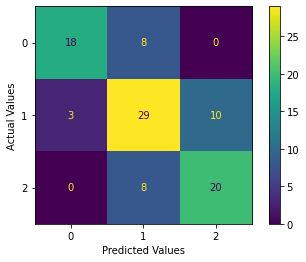

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

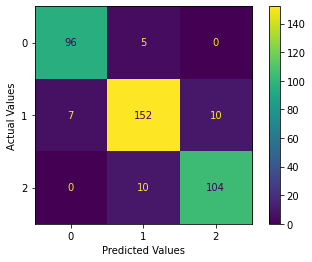

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

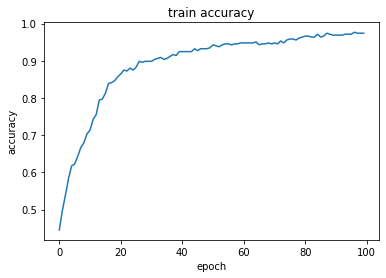

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

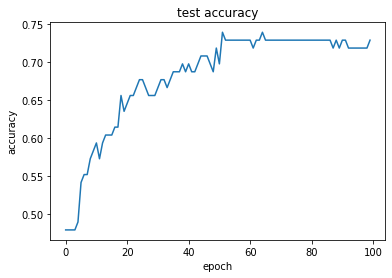

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

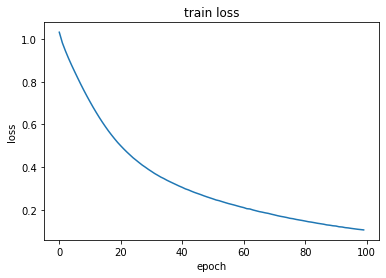

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

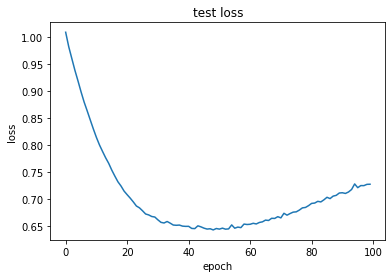

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh SGD**

In [ ]:
model_5layer_tS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dense(8, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_tS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_tS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 8ms/step - loss: 1.0154 - accuracy: 0.4453 - val_loss: 0.9090 - val_accuracy: 0.5208
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9238 - accuracy: 0.5052 - val_loss: 0.8539 - val_accuracy: 0.5521
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8603 - accuracy: 0.5755 - val_loss: 0.8145 - val_accuracy: 0.6146
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8116 - accuracy: 0.6250 - val_loss: 0.7857 - val_accuracy: 0.6354
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.7728 - accuracy: 0.6667 - val_loss: 0.7637 - val_accuracy: 0.6458
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.7406 - accuracy: 0.6953 - val_loss: 0.7461 - val_accuracy: 0.6562
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.7136 - accuracy: 0.7161 - val_loss: 0.7319 - val_accuracy: 0.6771
Epoch 8/100
2

In [ ]:
predictions_test = model_5layer_tS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.781250
precision: 0.800220593467587
recall; 0.7762515262515263
F1_score: 0.7860497507367491
confusion_matrix test: 
[[20  6  0]
 [ 3 34  5]
 [ 0  7 21]]
confusion_matrix train: 
[[101   0   0]
 [  2 165   2]
 [  0   2 112]]


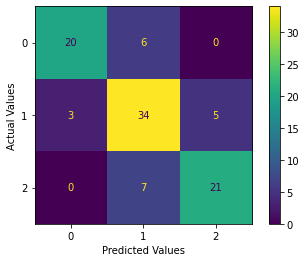

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

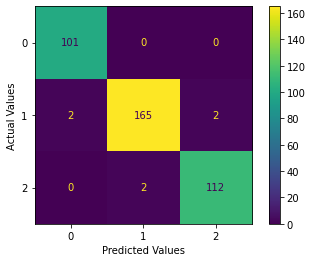

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

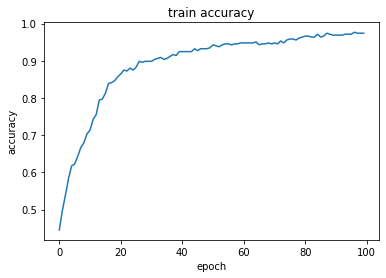

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

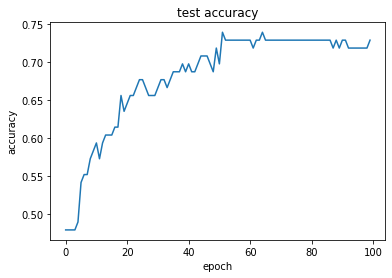

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

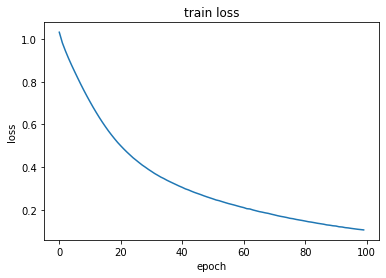

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

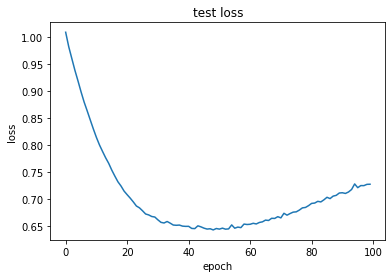

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh Adam**

In [ ]:
model_5layer_tA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dense(8, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_tA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_tA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.1707 - accuracy: 0.3438 - val_loss: 1.1161 - val_accuracy: 0.3854
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1151 - accuracy: 0.3984 - val_loss: 1.0743 - val_accuracy: 0.4271
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0686 - accuracy: 0.4479 - val_loss: 1.0369 - val_accuracy: 0.4792
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0268 - accuracy: 0.4870 - val_loss: 1.0036 - val_accuracy: 0.5104
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9895 - accuracy: 0.5260 - val_loss: 0.9743 - val_accuracy: 0.5417
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9567 - accuracy: 0.5703 - val_loss: 0.9459 - val_accuracy: 0.5521
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9269 - accuracy: 0.5859 - val_loss: 0.9239 - val_accuracy: 0.5938
Epoch 8/100
2

In [ ]:
predictions_test = model_5layer_tA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7294685990338164
recall; 0.7087912087912088
F1_score: 0.7175633889919605
confusion_matrix test: 
[[20  6  0]
 [ 3 30  9]
 [ 0 10 18]]
confusion_matrix train: 
[[ 98   3   0]
 [  4 153  12]
 [  0   7 107]]


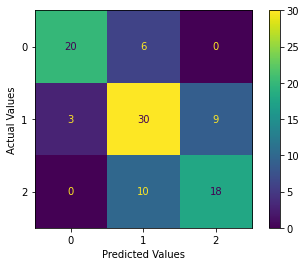

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

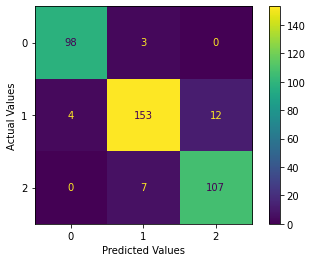

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

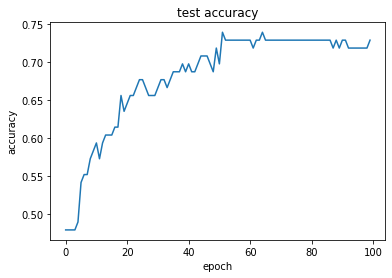

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

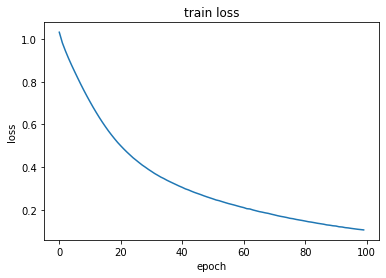

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

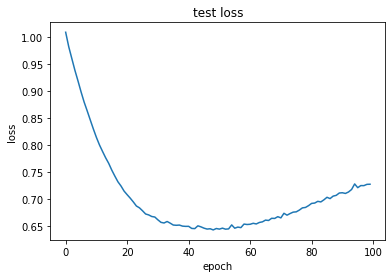

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh RMS**

In [ ]:
model_5layer_tR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dense(8, activation = 'tanh'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_tR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_tR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 8ms/step - loss: 1.0837 - accuracy: 0.4375 - val_loss: 1.0036 - val_accuracy: 0.4792
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0336 - accuracy: 0.4766 - val_loss: 0.9663 - val_accuracy: 0.5312
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9932 - accuracy: 0.5156 - val_loss: 0.9325 - val_accuracy: 0.5729
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9580 - accuracy: 0.5365 - val_loss: 0.9037 - val_accuracy: 0.6146
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9263 - accuracy: 0.5703 - val_loss: 0.8778 - val_accuracy: 0.6562
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8977 - accuracy: 0.5833 - val_loss: 0.8552 - val_accuracy: 0.6562
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8716 - accuracy: 0.5885 - val_loss: 0.8347 - val_accuracy: 0.6458
Epoch 8/100
2

In [ ]:
predictions_test = model_5layer_tR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.791667
precision: 0.8039682539682539
recall; 0.7979242979242979
F1_score: 0.8001751505199781
confusion_matrix test: 
[[22  4  0]
 [ 2 32  8]
 [ 0  6 22]]
confusion_matrix train: 
[[ 98   3   0]
 [  4 155  10]
 [  0   6 108]]


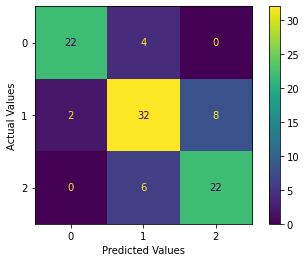

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

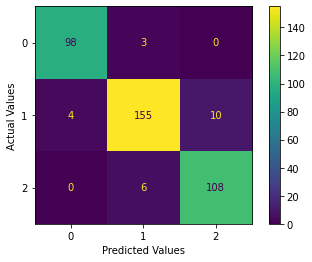

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

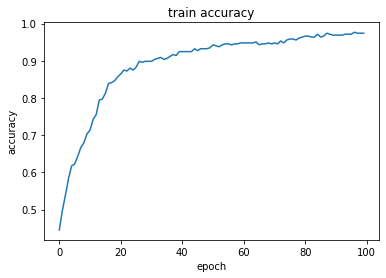

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

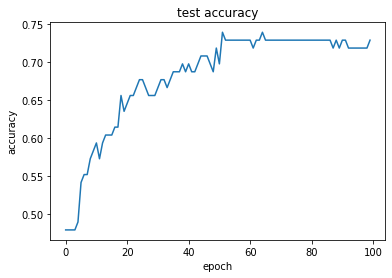

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

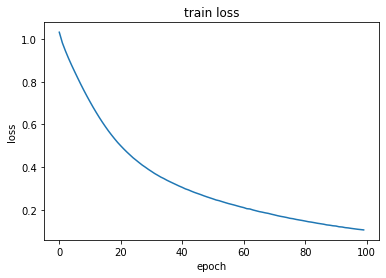

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

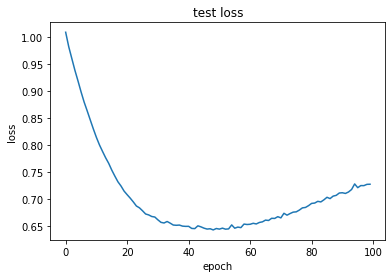

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid SGD**

In [ ]:
model_5layer_sS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(8, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_sS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_sS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 9ms/step - loss: 1.1882 - accuracy: 0.2969 - val_loss: 1.1611 - val_accuracy: 0.2917
Epoch 2/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.1337 - accuracy: 0.2969 - val_loss: 1.1225 - val_accuracy: 0.2917
Epoch 3/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.1067 - accuracy: 0.3021 - val_loss: 1.1028 - val_accuracy: 0.4375
Epoch 4/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0924 - accuracy: 0.4401 - val_loss: 1.0925 - val_accuracy: 0.4375
Epoch 5/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0850 - accuracy: 0.4401 - val_loss: 1.0863 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0804 - accuracy: 0.4401 - val_loss: 1.0825 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0779 - accuracy: 0.4401 - val_loss: 1.0803 - val_accuracy: 0.4375
Epoch 

In [ ]:
predictions_test = model_5layer_sS.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sS.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7136009959539371
recall; 0.7335164835164836
F1_score: 0.7180635025719434
confusion_matrix test: 
[[21  5  0]
 [ 6 24 12]
 [ 0  5 23]]
confusion_matrix train: 
[[ 92   9   0]
 [ 11 127  31]
 [  0  22  92]]


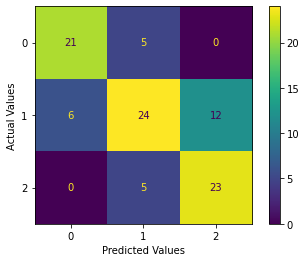

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

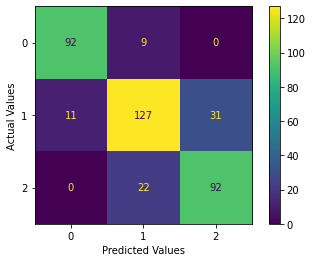

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

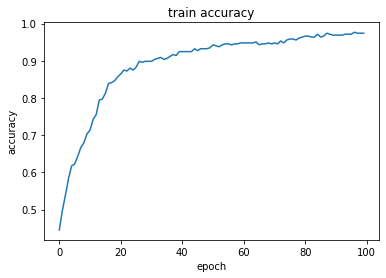

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

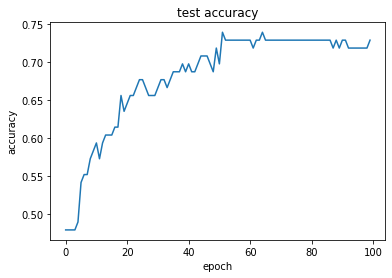

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

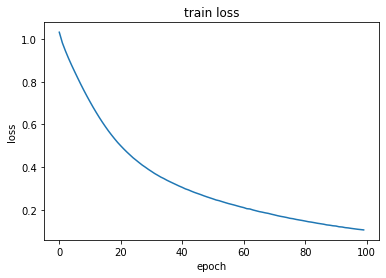

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

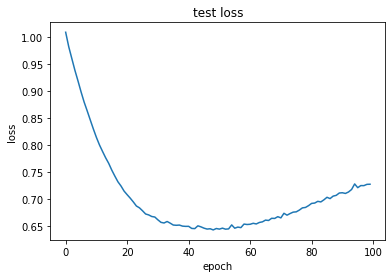

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid Adam**

In [ ]:
model_5layer_sA = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(8, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_sA.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_sA.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 10ms/step - loss: 1.0841 - accuracy: 0.4401 - val_loss: 1.0877 - val_accuracy: 0.4375
Epoch 2/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0823 - accuracy: 0.4401 - val_loss: 1.0859 - val_accuracy: 0.4375
Epoch 3/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0805 - accuracy: 0.4401 - val_loss: 1.0843 - val_accuracy: 0.4375
Epoch 4/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.0790 - accuracy: 0.4401 - val_loss: 1.0826 - val_accuracy: 0.4375
Epoch 5/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0778 - accuracy: 0.4401 - val_loss: 1.0810 - val_accuracy: 0.4375
Epoch 6/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0763 - accuracy: 0.4401 - val_loss: 1.0797 - val_accuracy: 0.4375
Epoch 7/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0753 - accuracy: 0.4401 - val_loss: 1.0784 - val_accuracy: 0.4375
Epoch

In [ ]:
predictions_test = model_5layer_sA.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sA.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7221272554605888
recall; 0.7326007326007327
F1_score: 0.7266681124846381
confusion_matrix test: 
[[20  6  0]
 [ 7 27  8]
 [ 0  6 22]]
confusion_matrix train: 
[[ 99   2   0]
 [  5 156   8]
 [  0   4 110]]


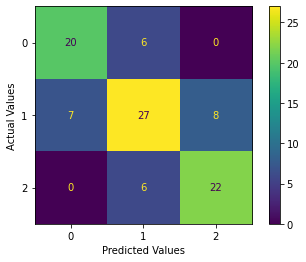

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

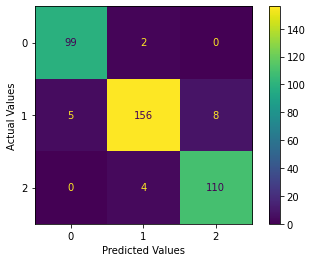

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

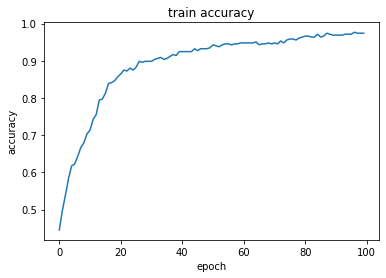

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

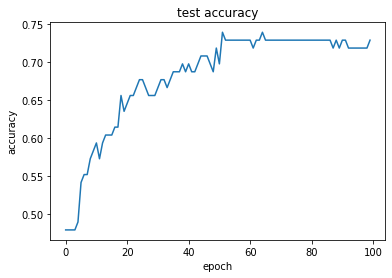

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

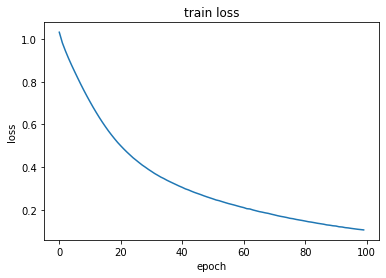

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

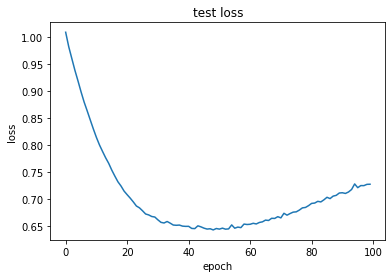

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid RMS**

In [ ]:
model_5layer_sR = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dense(8, activation = 'sigmoid'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_5layer_sR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model_5layer_sR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 1000, batch_size = 16)

Epoch 1/1000
24/24 [==============================] - 1s 9ms/step - loss: 1.1137 - accuracy: 0.2969 - val_loss: 1.1147 - val_accuracy: 0.2917
Epoch 2/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.1085 - accuracy: 0.2969 - val_loss: 1.1103 - val_accuracy: 0.2917
Epoch 3/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.1043 - accuracy: 0.2969 - val_loss: 1.1061 - val_accuracy: 0.2917
Epoch 4/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.1005 - accuracy: 0.2969 - val_loss: 1.1024 - val_accuracy: 0.2917
Epoch 5/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0970 - accuracy: 0.2969 - val_loss: 1.0991 - val_accuracy: 0.2917
Epoch 6/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0937 - accuracy: 0.2969 - val_loss: 1.0959 - val_accuracy: 0.2917
Epoch 7/1000
24/24 [==============================] - 0s 3ms/step - loss: 1.0907 - accuracy: 0.2969 - val_loss: 1.0929 - val_accuracy: 0.2917
Epoch 

In [ ]:
predictions_test = model_5layer_sR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7333333333333334
recall; 0.7414529914529915
F1_score: 0.7369015356820235
confusion_matrix test: 
[[21  5  0]
 [ 7 28  7]
 [ 0  7 21]]
confusion_matrix train: 
[[100   1   0]
 [  5 156   8]
 [  0   8 106]]


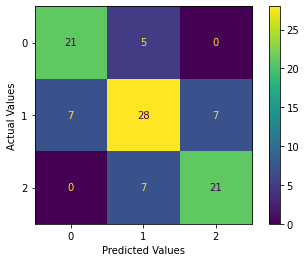

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

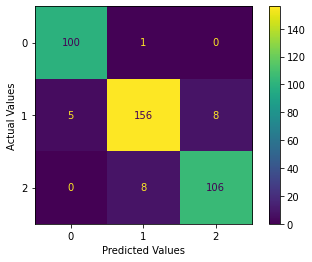

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

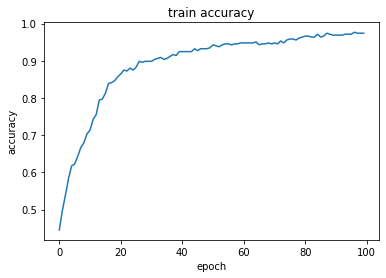

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

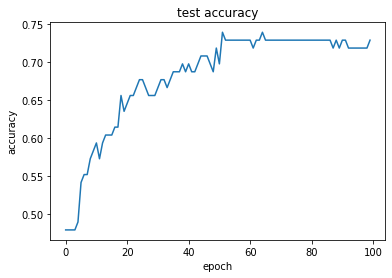

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

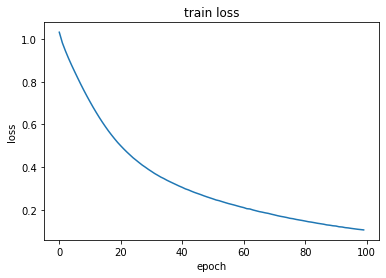

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

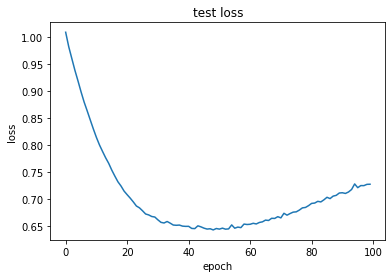

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model Relu SGD Batch normalization**

In [ ]:
model_3layer_RSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_RSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.6295 - accuracy: 0.3438 - val_loss: 1.2150 - val_accuracy: 0.2917
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4918 - accuracy: 0.3516 - val_loss: 1.2040 - val_accuracy: 0.3438
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3925 - accuracy: 0.3620 - val_loss: 1.1910 - val_accuracy: 0.3229
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3345 - accuracy: 0.4010 - val_loss: 1.1794 - val_accuracy: 0.3750
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3247 - accuracy: 0.4271 - val_loss: 1.1688 - val_accuracy: 0.3854
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2202 - accuracy: 0.4297 - val_loss: 1.1598 - val_accuracy: 0.4167
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1850 - accuracy: 0.4609 - val_loss: 1.1448 - val_accuracy: 0.4375
Epoch 8/100


In [ ]:
predictions_test = model_3layer_RSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.666667
precision: 0.6807359307359307
recall; 0.6712454212454212
F1_score: 0.6754928017718717
confusion_matrix test: 
[[18  8  0]
 [ 6 27  9]
 [ 0  9 19]]
confusion_matrix train: 
[[ 98   3   0]
 [  7 155   7]
 [  1  18  95]]


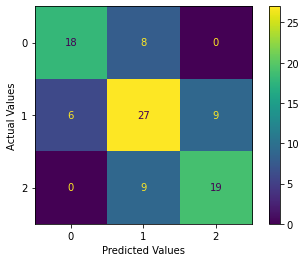

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

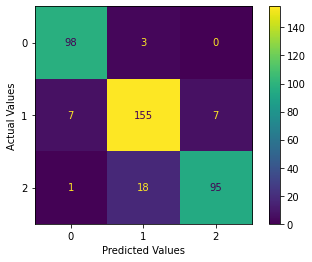

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

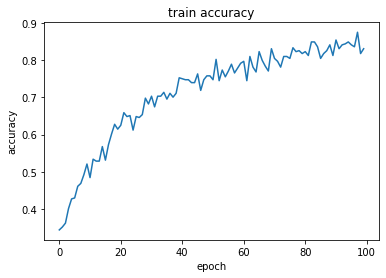

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

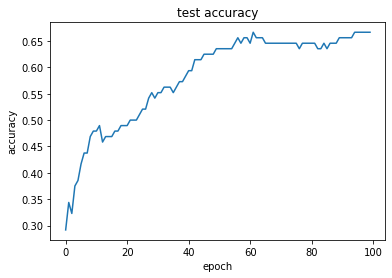

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

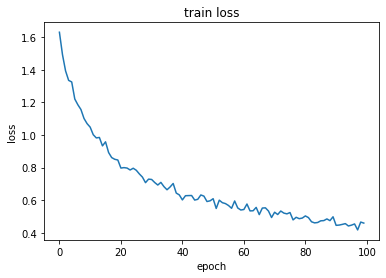

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

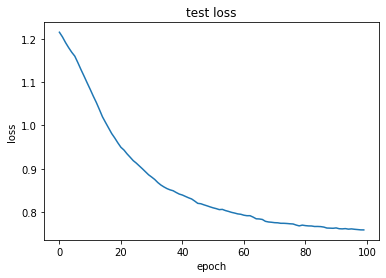

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model Relu Adam Batch normalization**

In [ ]:
model_3layer_RAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_RAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.6292 - accuracy: 0.3672 - val_loss: 1.4806 - val_accuracy: 0.2917
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.5157 - accuracy: 0.3516 - val_loss: 1.4052 - val_accuracy: 0.3333
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4180 - accuracy: 0.3750 - val_loss: 1.3434 - val_accuracy: 0.3854
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2977 - accuracy: 0.4323 - val_loss: 1.2909 - val_accuracy: 0.4271
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2377 - accuracy: 0.4323 - val_loss: 1.2472 - val_accuracy: 0.4271
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2419 - accuracy: 0.4349 - val_loss: 1.2049 - val_accuracy: 0.4271
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1686 - accuracy: 0.4766 - val_loss: 1.1691 - val_accuracy: 0.4271
Epoch 8/100


In [ ]:
predictions_test = model_3layer_RAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7348636728147554
recall; 0.7255799755799757
F1_score: 0.7296732026143791
confusion_matrix test: 
[[21  5  0]
 [ 3 29 10]
 [ 0  9 19]]
confusion_matrix train: 
[[ 98   2   1]
 [  4 161   4]
 [  1   6 107]]


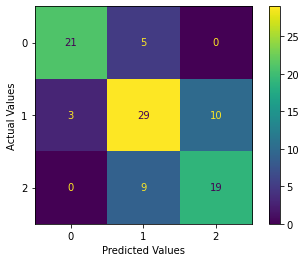

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

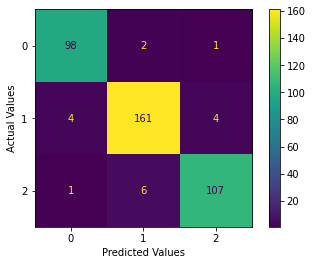

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

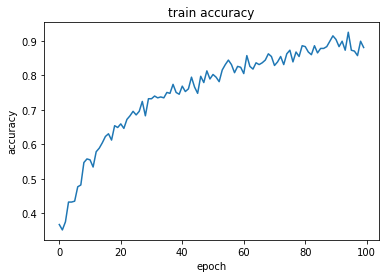

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

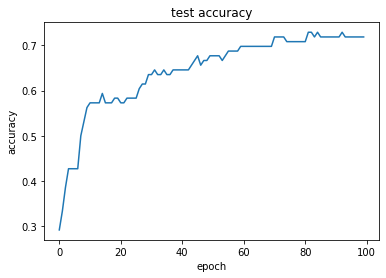

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

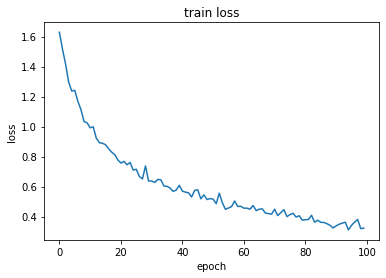

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

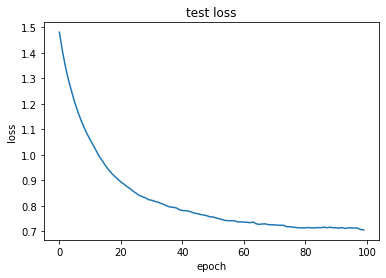

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model Relu RMS Batch normalization**

In [ ]:
model_3layer_RRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_RRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.4316 - accuracy: 0.3880 - val_loss: 1.0970 - val_accuracy: 0.4062
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3715 - accuracy: 0.3828 - val_loss: 1.0768 - val_accuracy: 0.4688
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3158 - accuracy: 0.3984 - val_loss: 1.0577 - val_accuracy: 0.4896
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3002 - accuracy: 0.4141 - val_loss: 1.0386 - val_accuracy: 0.5000
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2071 - accuracy: 0.4531 - val_loss: 1.0200 - val_accuracy: 0.5208
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1693 - accuracy: 0.4661 - val_loss: 1.0007 - val_accuracy: 0.5312
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1203 - accuracy: 0.5000 - val_loss: 0.9832 - val_accuracy: 0.5521
Epoch 8/100


In [ ]:
predictions_test = model_3layer_RRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7049382716049383
recall; 0.7145909645909647
F1_score: 0.709112133893454
confusion_matrix test: 
[[22  4  0]
 [ 5 26 11]
 [ 0  9 19]]
confusion_matrix train: 
[[ 98   2   1]
 [  4 158   7]
 [  0   8 106]]


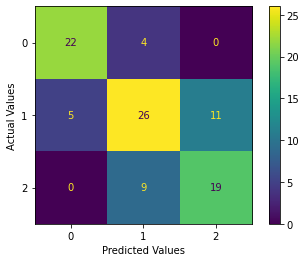

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

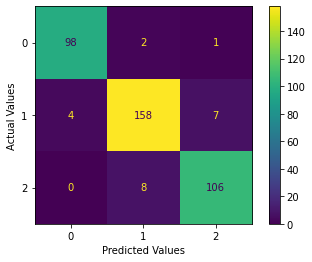

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

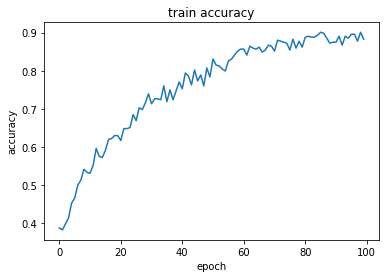

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

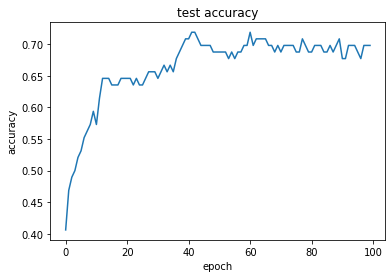

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

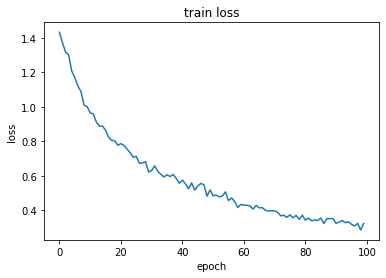

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

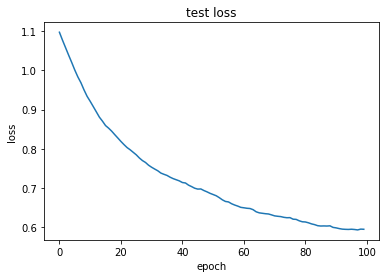

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model tanh SGD Batch normalization**

In [ ]:
model_3layer_tSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_tSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_tSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.7255 - accuracy: 0.2604 - val_loss: 1.3505 - val_accuracy: 0.2500
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.5104 - accuracy: 0.3255 - val_loss: 1.3118 - val_accuracy: 0.2917
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4045 - accuracy: 0.3542 - val_loss: 1.2759 - val_accuracy: 0.3021
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3315 - accuracy: 0.3958 - val_loss: 1.2432 - val_accuracy: 0.3438
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2621 - accuracy: 0.3932 - val_loss: 1.2131 - val_accuracy: 0.3542
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2420 - accuracy: 0.4193 - val_loss: 1.1832 - val_accuracy: 0.3646
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1743 - accuracy: 0.4740 - val_loss: 1.1541 - val_accuracy: 0.3750
Epoch 8/100


In [ ]:
predictions_test = model_3layer_tSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.677083
precision: 0.6786552960079101
recall; 0.6978021978021979
F1_score: 0.6856623602386313
confusion_matrix test: 
[[21  5  0]
 [ 7 24 11]
 [ 1  7 20]]
confusion_matrix train: 
[[ 97   4   0]
 [ 10 132  27]
 [  1  14  99]]


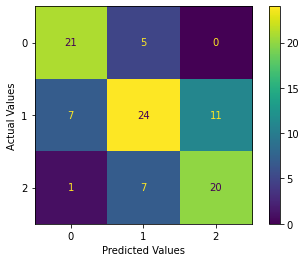

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

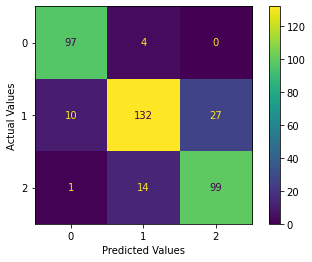

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

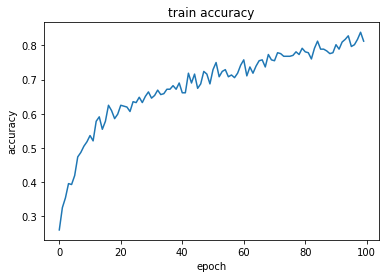

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

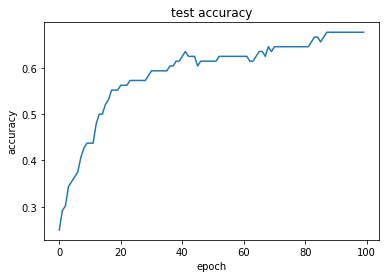

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

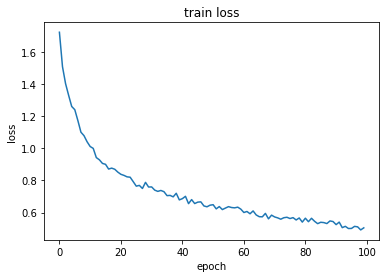

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

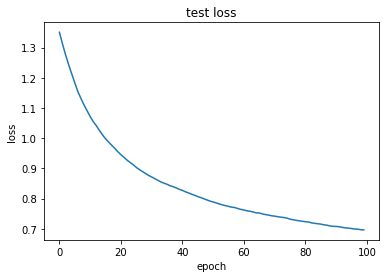

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model tanh Adam Batch normalization**

In [ ]:
model_3layer_tAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_tAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_tAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.2786 - accuracy: 0.4401 - val_loss: 1.1667 - val_accuracy: 0.4375
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2149 - accuracy: 0.4219 - val_loss: 1.1403 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1000 - accuracy: 0.4818 - val_loss: 1.1104 - val_accuracy: 0.4271
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0839 - accuracy: 0.4818 - val_loss: 1.0820 - val_accuracy: 0.4375
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0186 - accuracy: 0.5052 - val_loss: 1.0564 - val_accuracy: 0.4479
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9766 - accuracy: 0.5182 - val_loss: 1.0332 - val_accuracy: 0.5000
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9330 - accuracy: 0.5391 - val_loss: 1.0085 - val_accuracy: 0.5208
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_tAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7136470985155196
recall; 0.7246642246642246
F1_score: 0.7175213675213676
confusion_matrix test: 
[[20  6  0]
 [ 6 26 10]
 [ 0  6 22]]
confusion_matrix train: 
[[ 99   1   1]
 [  5 152  12]
 [  0   8 106]]


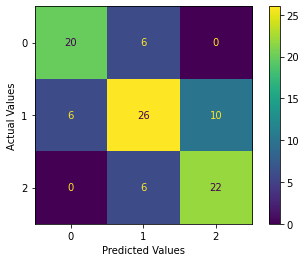

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

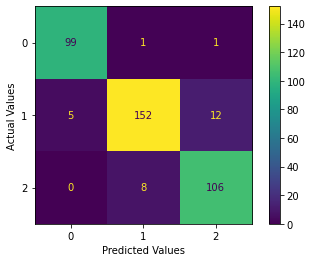

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

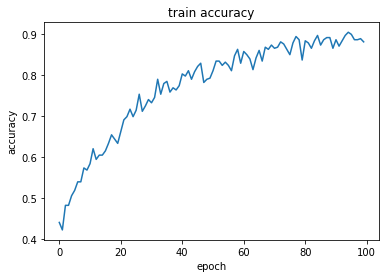

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

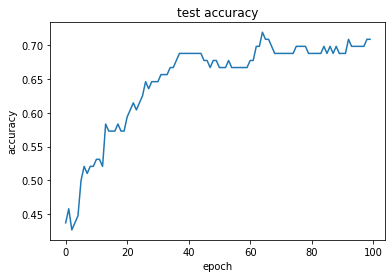

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

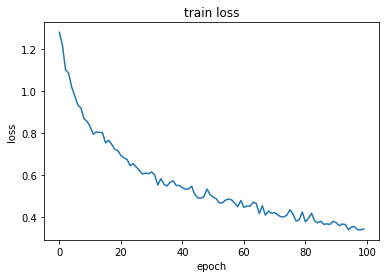

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

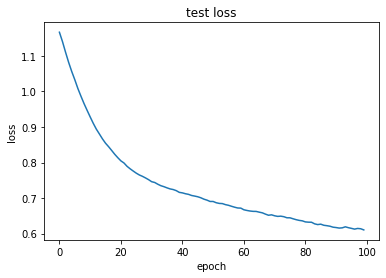

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model tanh RMS Batch normalization**

In [ ]:
model_3layer_tRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_tRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_tRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.5459 - accuracy: 0.3542 - val_loss: 1.1577 - val_accuracy: 0.3854
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3607 - accuracy: 0.3932 - val_loss: 1.1064 - val_accuracy: 0.4167
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2776 - accuracy: 0.4062 - val_loss: 1.0582 - val_accuracy: 0.4375
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1297 - accuracy: 0.4714 - val_loss: 1.0140 - val_accuracy: 0.4792
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0769 - accuracy: 0.5078 - val_loss: 0.9729 - val_accuracy: 0.4792
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0394 - accuracy: 0.4844 - val_loss: 0.9390 - val_accuracy: 0.5104
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9526 - accuracy: 0.5625 - val_loss: 0.9122 - val_accuracy: 0.5208
Epoch 8/100


In [ ]:
predictions_test = model_3layer_tRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7271310581268505
recall; 0.7167277167277167
F1_score: 0.7203197663246089
confusion_matrix test: 
[[20  6  0]
 [ 3 28 11]
 [ 0  8 20]]
confusion_matrix train: 
[[ 99   2   0]
 [  5 152  12]
 [  0   6 108]]


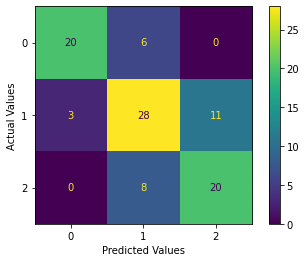

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

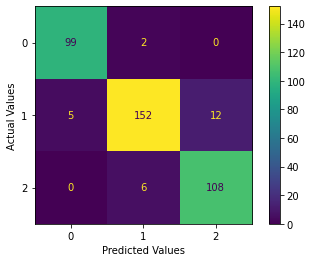

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

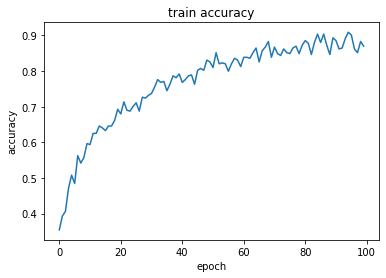

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

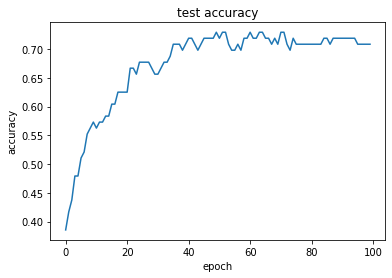

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

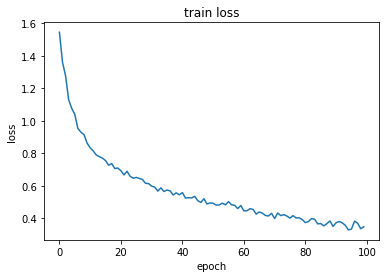

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

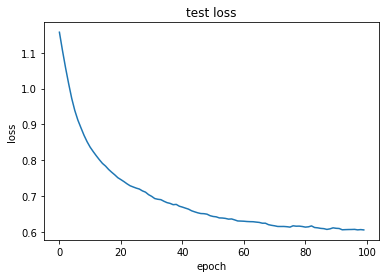

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model sigmoid SGD Batch normalization**

In [ ]:
model_3layer_sSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_sSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_sSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.8484 - accuracy: 0.2812 - val_loss: 1.1161 - val_accuracy: 0.4375
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.6998 - accuracy: 0.3021 - val_loss: 1.1025 - val_accuracy: 0.4479
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.5322 - accuracy: 0.3568 - val_loss: 1.0889 - val_accuracy: 0.4375
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4406 - accuracy: 0.3828 - val_loss: 1.0741 - val_accuracy: 0.4167
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3485 - accuracy: 0.3854 - val_loss: 1.0585 - val_accuracy: 0.4062
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2595 - accuracy: 0.4193 - val_loss: 1.0417 - val_accuracy: 0.4167
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2111 - accuracy: 0.4453 - val_loss: 1.0239 - val_accuracy: 0.4792
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_sSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.645833
precision: 0.6461601307189543
recall; 0.6828449328449328
F1_score: 0.65460594075722
confusion_matrix test: 
[[22  4  0]
 [10 19 13]
 [ 0  7 21]]
confusion_matrix train: 
[[ 95   6   0]
 [ 22 115  32]
 [  1  18  95]]


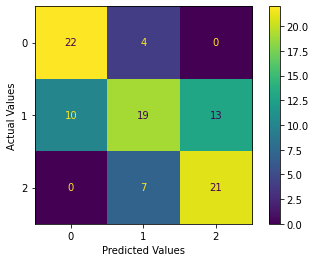

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

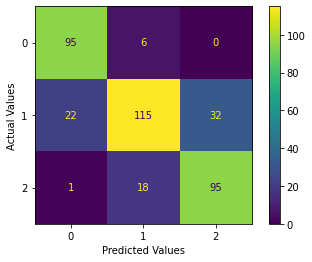

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

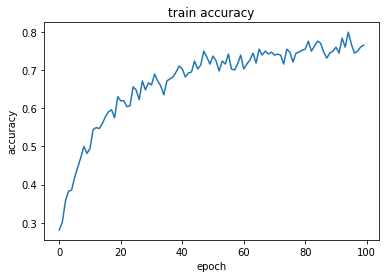

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

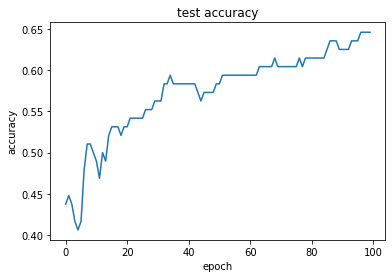

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

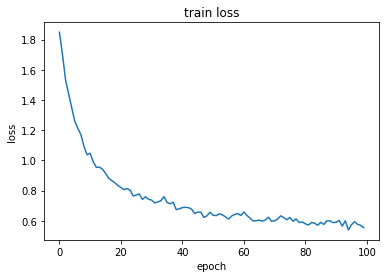

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

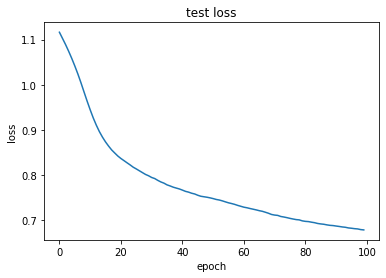

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model sigmoid Adam Batch normalization**

In [ ]:
model_3layer_sAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_sAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_sAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.3512 - accuracy: 0.4036 - val_loss: 1.2648 - val_accuracy: 0.2708
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1791 - accuracy: 0.4401 - val_loss: 1.2308 - val_accuracy: 0.2708
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1021 - accuracy: 0.4870 - val_loss: 1.1959 - val_accuracy: 0.2708
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0170 - accuracy: 0.5469 - val_loss: 1.1615 - val_accuracy: 0.2708
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9746 - accuracy: 0.5573 - val_loss: 1.1261 - val_accuracy: 0.2917
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9239 - accuracy: 0.5469 - val_loss: 1.0905 - val_accuracy: 0.3229
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9188 - accuracy: 0.5521 - val_loss: 1.0559 - val_accuracy: 0.3854
Epoch 8/100


In [ ]:
predictions_test = model_3layer_sAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.6958064516129032
recall; 0.69993894993895
F1_score: 0.6970362624862542
confusion_matrix test: 
[[19  7  0]
 [ 6 26 10]
 [ 0  7 21]]
confusion_matrix train: 
[[ 98   3   0]
 [  8 142  19]
 [  0  12 102]]


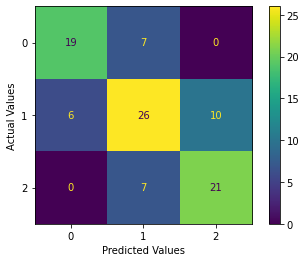

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

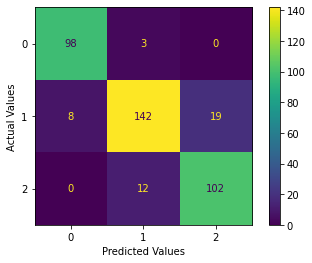

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

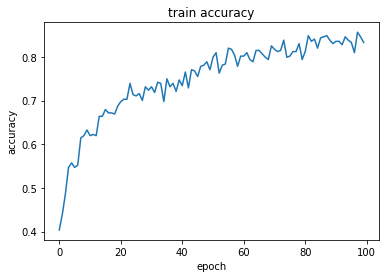

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

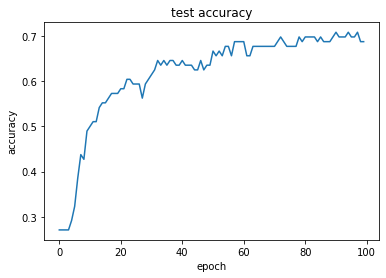

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

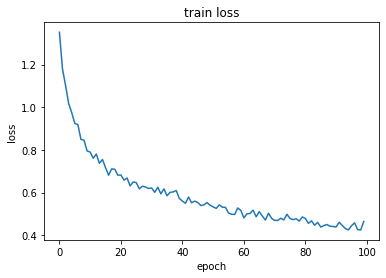

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

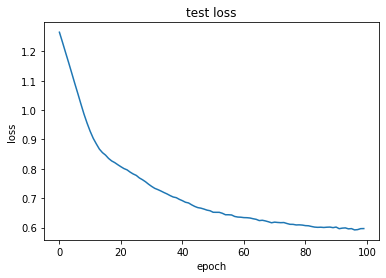

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model sigmoid RMS Batch normalization**

In [ ]:
model_3layer_sRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_sRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_sRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.5927 - accuracy: 0.3255 - val_loss: 1.1176 - val_accuracy: 0.2604
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4194 - accuracy: 0.3516 - val_loss: 1.1071 - val_accuracy: 0.3229
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2883 - accuracy: 0.4010 - val_loss: 1.0945 - val_accuracy: 0.3438
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2223 - accuracy: 0.4297 - val_loss: 1.0796 - val_accuracy: 0.3854
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1093 - accuracy: 0.4583 - val_loss: 1.0605 - val_accuracy: 0.4375
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0191 - accuracy: 0.5000 - val_loss: 1.0376 - val_accuracy: 0.5208
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9539 - accuracy: 0.5286 - val_loss: 1.0122 - val_accuracy: 0.5625
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_sRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7013054721388055
recall; 0.7167277167277167
F1_score: 0.7069872356234908
confusion_matrix test: 
[[20  6  0]
 [ 7 25 10]
 [ 0  6 22]]
confusion_matrix train: 
[[ 97   4   0]
 [  9 141  19]
 [  0  17  97]]


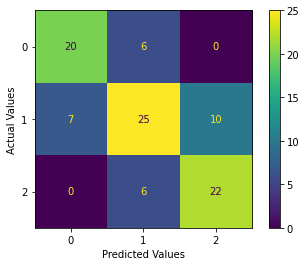

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

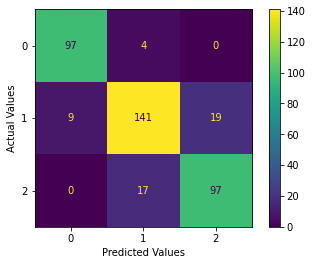

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

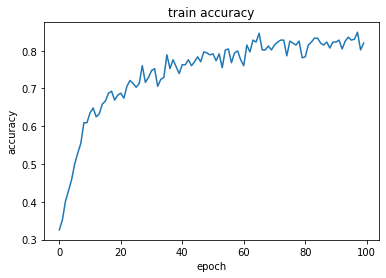

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

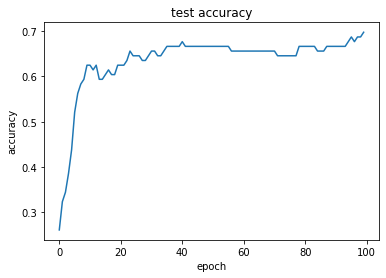

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

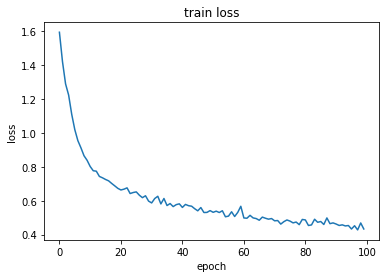

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

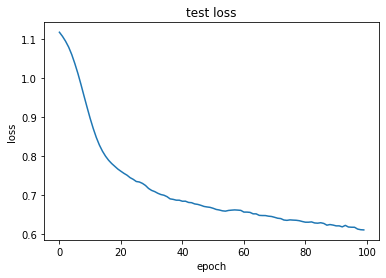

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu SGD Batch normalization**

In [ ]:
model_4layer_RSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 12ms/step - loss: 1.4831 - accuracy: 0.2995 - val_loss: 1.4231 - val_accuracy: 0.2188
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4294 - accuracy: 0.3151 - val_loss: 1.3476 - val_accuracy: 0.2812
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3575 - accuracy: 0.3594 - val_loss: 1.3103 - val_accuracy: 0.3438
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3573 - accuracy: 0.3542 - val_loss: 1.2914 - val_accuracy: 0.3542
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2677 - accuracy: 0.3750 - val_loss: 1.2785 - val_accuracy: 0.3542
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3068 - accuracy: 0.3307 - val_loss: 1.2731 - val_accuracy: 0.3542
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2085 - accuracy: 0.3932 - val_loss: 1.2717 - val_accuracy: 0.3438
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.666667
precision: 0.6810650363281942
recall; 0.6822344322344321
F1_score: 0.6756944444444444
confusion_matrix test: 
[[17  9  0]
 [ 5 24 13]
 [ 0  5 23]]
confusion_matrix train: 
[[ 93   7   1]
 [  8 137  24]
 [  1  20  93]]


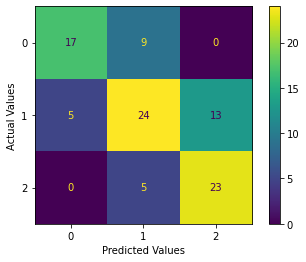

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

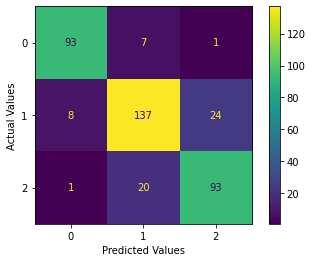

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

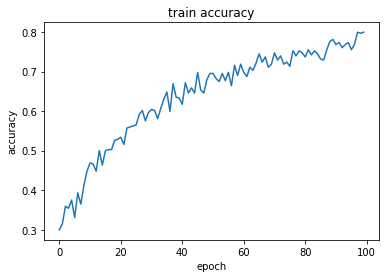

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

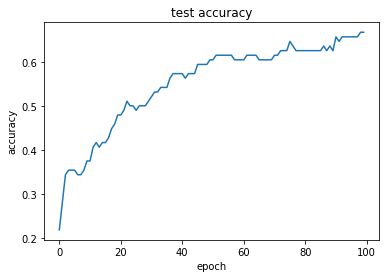

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

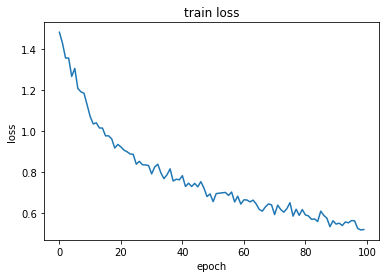

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

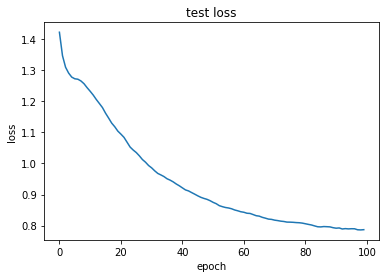

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu Adam Batch normalization**

In [ ]:
model_4layer_RAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.4662 - accuracy: 0.3802 - val_loss: 1.1898 - val_accuracy: 0.4062
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.4298 - accuracy: 0.3750 - val_loss: 1.1330 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3674 - accuracy: 0.3958 - val_loss: 1.0980 - val_accuracy: 0.4792
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3689 - accuracy: 0.4193 - val_loss: 1.0733 - val_accuracy: 0.4896
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2391 - accuracy: 0.4583 - val_loss: 1.0585 - val_accuracy: 0.5104
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2673 - accuracy: 0.3984 - val_loss: 1.0440 - val_accuracy: 0.5000
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2382 - accuracy: 0.4505 - val_loss: 1.0321 - val_accuracy: 0.5312
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.666667
precision: 0.6822725350074578
recall; 0.6752136752136751
F1_score: 0.6772358660978516
confusion_matrix test: 
[[18  8  0]
 [ 5 26 11]
 [ 0  8 20]]
confusion_matrix train: 
[[ 95   5   1]
 [  6 151  12]
 [  0   6 108]]


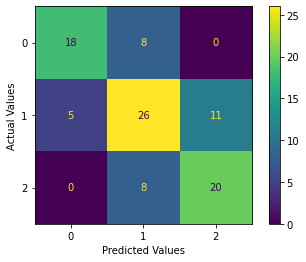

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

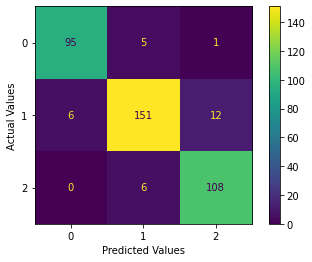

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

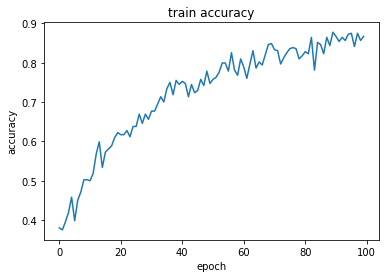

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

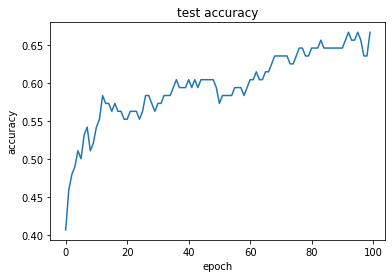

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

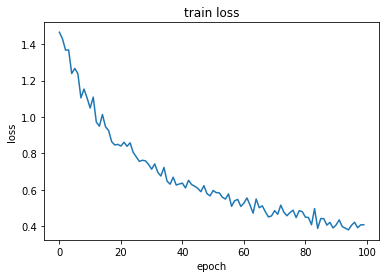

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

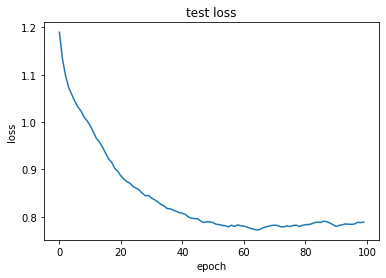

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu RMS Batch normalization**

In [ ]:
model_4layer_RRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.5434 - accuracy: 0.3281 - val_loss: 1.0632 - val_accuracy: 0.4479
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.5246 - accuracy: 0.3464 - val_loss: 1.0693 - val_accuracy: 0.3958
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3899 - accuracy: 0.3854 - val_loss: 1.0753 - val_accuracy: 0.3854
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3365 - accuracy: 0.4036 - val_loss: 1.0807 - val_accuracy: 0.3958
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3807 - accuracy: 0.3854 - val_loss: 1.0893 - val_accuracy: 0.4167
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2736 - accuracy: 0.4219 - val_loss: 1.0884 - val_accuracy: 0.4167
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2675 - accuracy: 0.4089 - val_loss: 1.0847 - val_accuracy: 0.4167
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.7044047534334306
recall; 0.683150183150183
F1_score: 0.6918392825294912
confusion_matrix test: 
[[18  7  1]
 [ 5 30  7]
 [ 0 10 18]]
confusion_matrix train: 
[[ 98   3   0]
 [  3 161   5]
 [  0  15  99]]


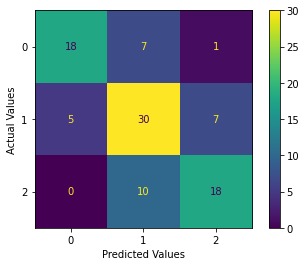

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

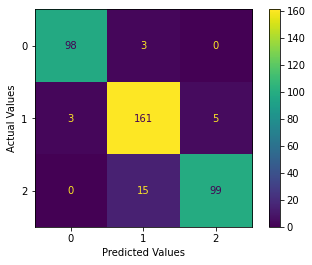

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

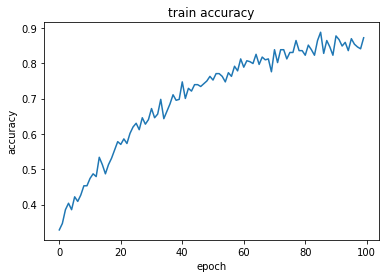

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

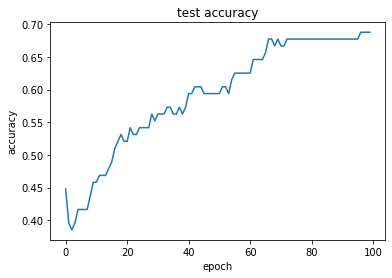

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

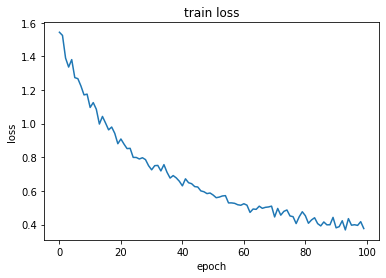

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

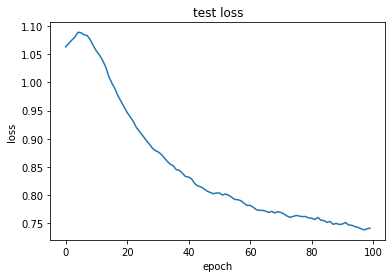

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model tanh SGD Batch normalization**

In [ ]:
model_4layer_tSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_tSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_tSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.4249 - accuracy: 0.3958 - val_loss: 1.1520 - val_accuracy: 0.4375
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3205 - accuracy: 0.4141 - val_loss: 1.1256 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2519 - accuracy: 0.4141 - val_loss: 1.1033 - val_accuracy: 0.4896
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1767 - accuracy: 0.4635 - val_loss: 1.0830 - val_accuracy: 0.4896
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1298 - accuracy: 0.4505 - val_loss: 1.0646 - val_accuracy: 0.5104
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0889 - accuracy: 0.4766 - val_loss: 1.0444 - val_accuracy: 0.5104
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0689 - accuracy: 0.4818 - val_loss: 1.0250 - val_accuracy: 0.5000
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.6943167305236271
recall; 0.7017704517704518
F1_score: 0.6977552794395868
confusion_matrix test: 
[[21  5  0]
 [ 6 26 10]
 [ 0  9 19]]
confusion_matrix train: 
[[ 96   4   1]
 [ 12 139  18]
 [  1  13 100]]


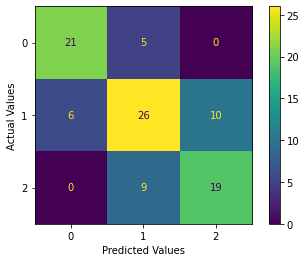

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

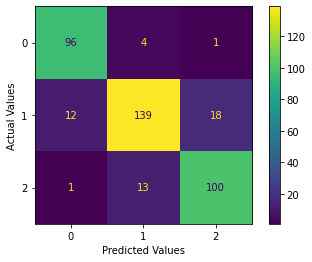

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

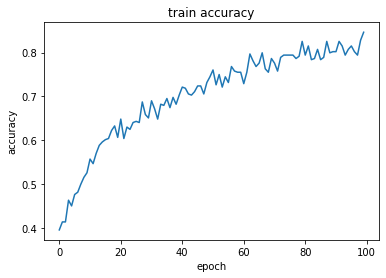

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

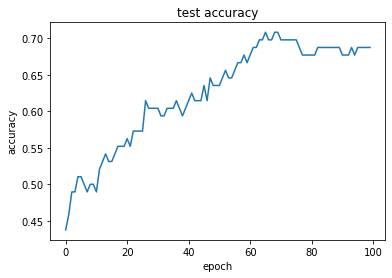

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

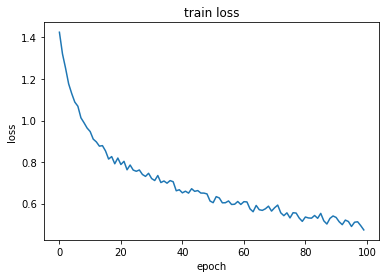

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

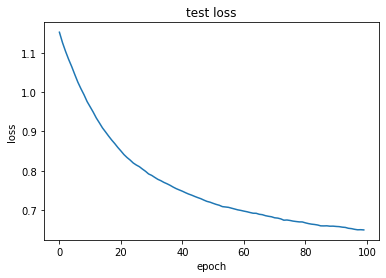

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model tanh Adam Batch normalization**

In [ ]:
model_4layer_tAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_tAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_tAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.6329 - accuracy: 0.2995 - val_loss: 1.3192 - val_accuracy: 0.1979
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.4966 - accuracy: 0.3073 - val_loss: 1.2949 - val_accuracy: 0.2500
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3973 - accuracy: 0.3255 - val_loss: 1.2607 - val_accuracy: 0.2708
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2301 - accuracy: 0.3958 - val_loss: 1.2253 - val_accuracy: 0.2708
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1846 - accuracy: 0.3932 - val_loss: 1.1923 - val_accuracy: 0.2812
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1380 - accuracy: 0.4245 - val_loss: 1.1587 - val_accuracy: 0.3021
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0542 - accuracy: 0.4714 - val_loss: 1.1264 - val_accuracy: 0.3438
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7016967706622879
recall; 0.7136752136752137
F1_score: 0.7066324621880177
confusion_matrix test: 
[[21  5  0]
 [ 8 26  8]
 [ 0  8 20]]
confusion_matrix train: 
[[ 98   2   1]
 [  5 158   6]
 [  0   3 111]]


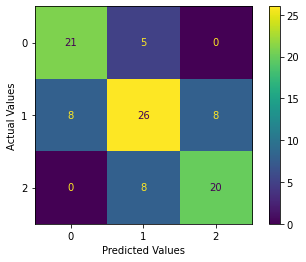

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

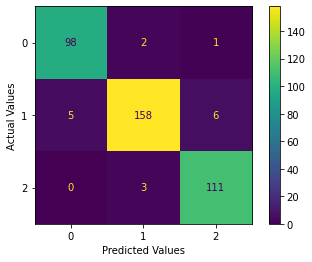

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

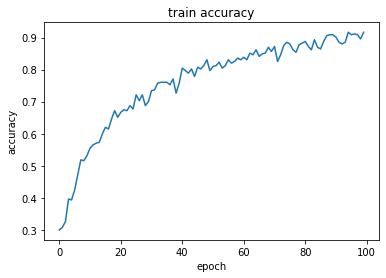

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

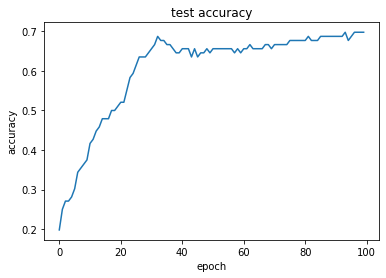

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

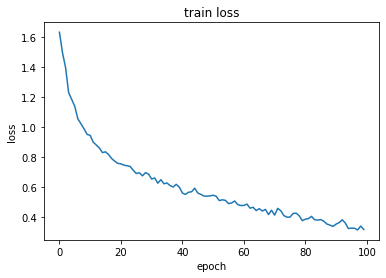

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

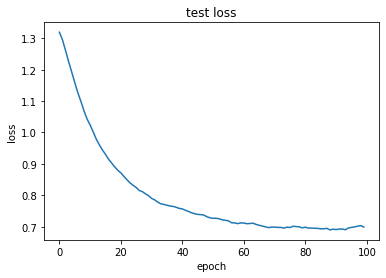

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model tanh RMS Batch normalization**

In [ ]:
model_4layer_tRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_tRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_tRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.2641 - accuracy: 0.3958 - val_loss: 1.0708 - val_accuracy: 0.4375
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1658 - accuracy: 0.4401 - val_loss: 1.0369 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1102 - accuracy: 0.4583 - val_loss: 1.0039 - val_accuracy: 0.5312
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0393 - accuracy: 0.4714 - val_loss: 0.9708 - val_accuracy: 0.5312
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9862 - accuracy: 0.5599 - val_loss: 0.9421 - val_accuracy: 0.5312
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9163 - accuracy: 0.5807 - val_loss: 0.9130 - val_accuracy: 0.5729
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8925 - accuracy: 0.5990 - val_loss: 0.8865 - val_accuracy: 0.5625
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.656250
precision: 0.6701058201058201
recall; 0.6770451770451772
F1_score: 0.6696593167181403
confusion_matrix test: 
[[20  5  1]
 [ 5 23 14]
 [ 0  8 20]]
confusion_matrix train: 
[[ 99   2   0]
 [  4 159   6]
 [  0   7 107]]


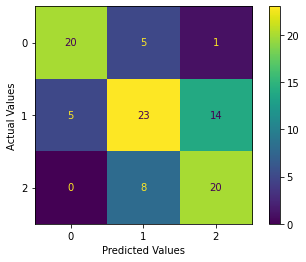

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

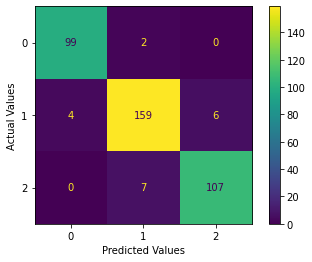

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

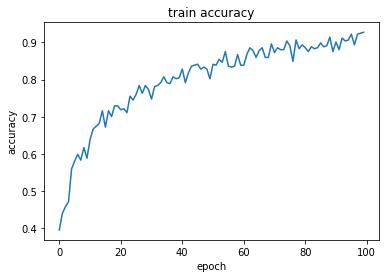

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

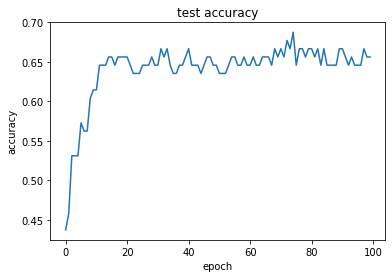

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

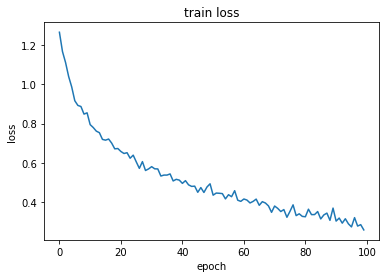

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

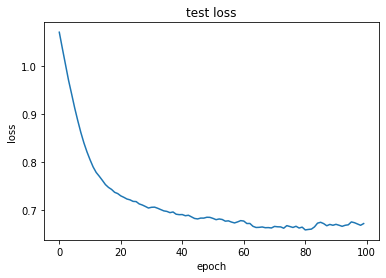

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model sigmoid SGD Batch normalization**

In [ ]:
model_4layer_sSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_sSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_sSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.7402 - accuracy: 0.3333 - val_loss: 1.1717 - val_accuracy: 0.4375
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.6040 - accuracy: 0.3516 - val_loss: 1.1373 - val_accuracy: 0.4375
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4812 - accuracy: 0.4115 - val_loss: 1.1113 - val_accuracy: 0.4375
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4399 - accuracy: 0.3854 - val_loss: 1.0914 - val_accuracy: 0.4375
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3501 - accuracy: 0.4115 - val_loss: 1.0753 - val_accuracy: 0.4375
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2688 - accuracy: 0.4479 - val_loss: 1.0606 - val_accuracy: 0.4375
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1660 - accuracy: 0.4870 - val_loss: 1.0465 - val_accuracy: 0.4271
Epoch 8/100


In [ ]:
predictions_test = model_4layer_sSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.701318447634237
recall; 0.7057387057387058
F1_score: 0.7014223722275795
confusion_matrix test: 
[[21  5  0]
 [ 4 25 13]
 [ 0  8 20]]
confusion_matrix train: 
[[ 97   4   0]
 [ 20 123  26]
 [  1  15  98]]


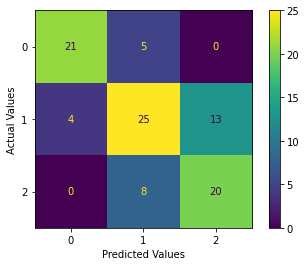

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

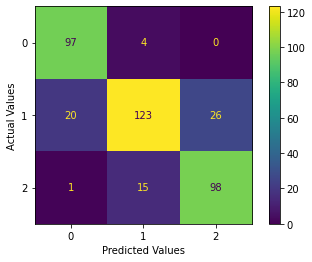

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

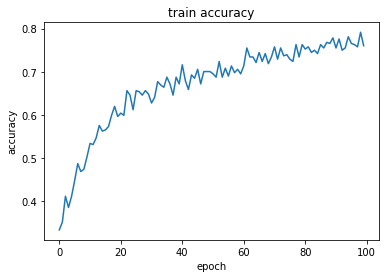

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

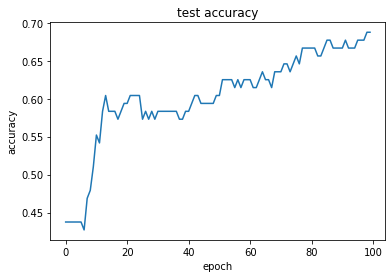

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

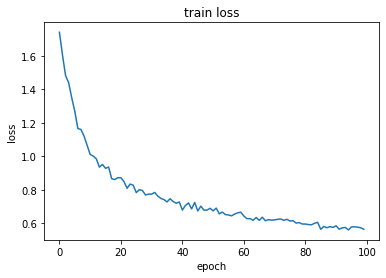

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

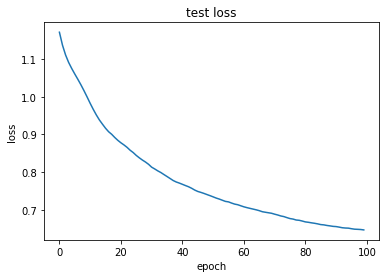

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model sigmoid Adam Batch normalization**

In [ ]:
model_4layer_sAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_sAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_sAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.6889 - accuracy: 0.2917 - val_loss: 1.2175 - val_accuracy: 0.2708
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.5645 - accuracy: 0.3646 - val_loss: 1.1831 - val_accuracy: 0.2708
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4236 - accuracy: 0.3698 - val_loss: 1.1528 - val_accuracy: 0.2708
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3136 - accuracy: 0.4141 - val_loss: 1.1254 - val_accuracy: 0.2708
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2242 - accuracy: 0.4193 - val_loss: 1.0988 - val_accuracy: 0.3021
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1745 - accuracy: 0.4271 - val_loss: 1.0722 - val_accuracy: 0.3750
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1063 - accuracy: 0.4479 - val_loss: 1.0444 - val_accuracy: 0.4375
Epoch 8/100


In [ ]:
predictions_test = model_4layer_sAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7324451147980561
recall; 0.7484737484737485
F1_score: 0.7366969947615108
confusion_matrix test: 
[[20  6  0]
 [ 6 26 10]
 [ 0  4 24]]
confusion_matrix train: 
[[ 98   3   0]
 [ 11 139  19]
 [  0   7 107]]


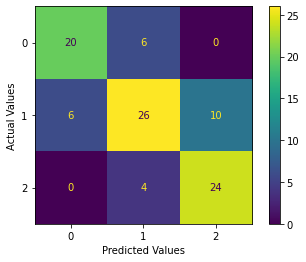

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

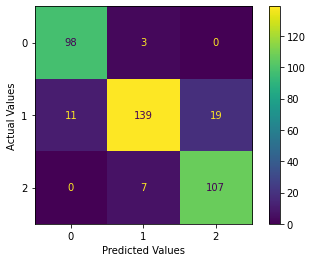

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

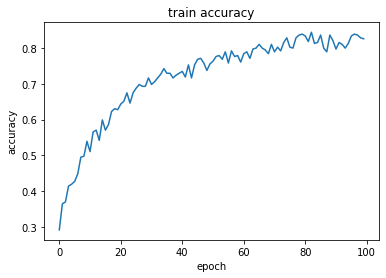

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

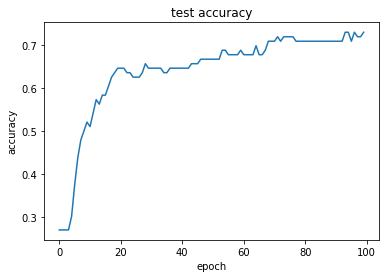

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

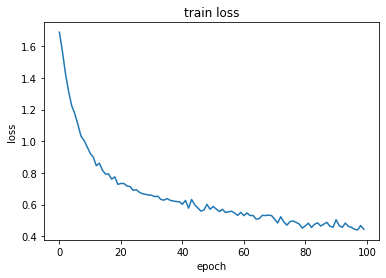

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

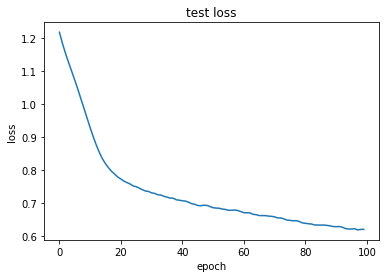

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model sigmoid RMS Batch normalization**

In [ ]:
model_4layer_sRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_sRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_sRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.4078 - accuracy: 0.3854 - val_loss: 1.1834 - val_accuracy: 0.2708
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2948 - accuracy: 0.4089 - val_loss: 1.1666 - val_accuracy: 0.2708
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1881 - accuracy: 0.4792 - val_loss: 1.1501 - val_accuracy: 0.3021
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1117 - accuracy: 0.5026 - val_loss: 1.1324 - val_accuracy: 0.4271
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0735 - accuracy: 0.5000 - val_loss: 1.1131 - val_accuracy: 0.4688
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9936 - accuracy: 0.5208 - val_loss: 1.0898 - val_accuracy: 0.5104
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9815 - accuracy: 0.5182 - val_loss: 1.0631 - val_accuracy: 0.5104
Epoch 8/100


In [ ]:
predictions_test = model_4layer_sRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.677083
precision: 0.6904843304843306
recall; 0.6810134310134309
F1_score: 0.6848061213708578
confusion_matrix test: 
[[20  6  0]
 [ 6 28  8]
 [ 0 11 17]]
confusion_matrix train: 
[[ 97   4   0]
 [ 10 144  15]
 [  1  11 102]]


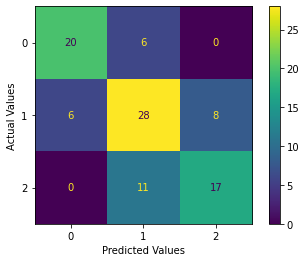

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

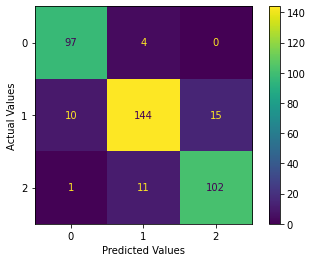

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

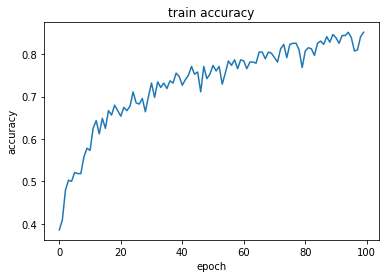

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

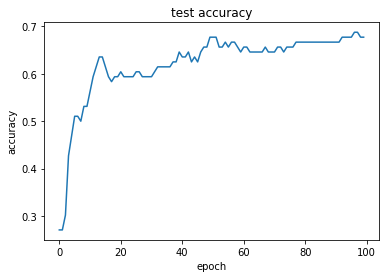

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

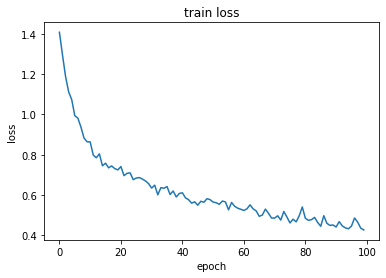

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

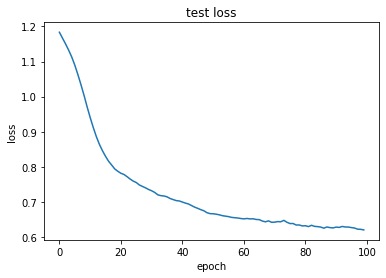

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu SGD Batch normalization**

In [ ]:
model_5layer_RSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_RSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_RSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 12ms/step - loss: 1.7304 - accuracy: 0.2656 - val_loss: 1.2928 - val_accuracy: 0.1562
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.7072 - accuracy: 0.2604 - val_loss: 1.2840 - val_accuracy: 0.1875
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.5718 - accuracy: 0.3021 - val_loss: 1.2868 - val_accuracy: 0.2292
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.5124 - accuracy: 0.2786 - val_loss: 1.2996 - val_accuracy: 0.2500
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.4756 - accuracy: 0.2995 - val_loss: 1.3104 - val_accuracy: 0.2708
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.4351 - accuracy: 0.3047 - val_loss: 1.3156 - val_accuracy: 0.2604
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.4251 - accuracy: 0.3359 - val_loss: 1.3152 - val_accuracy: 0.2708
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.593750
precision: 0.6335412605588044
recall; 0.5860805860805861
F1_score: 0.6023861806470502
confusion_matrix test: 
[[16  9  1]
 [ 3 27 12]
 [ 0 14 14]]
confusion_matrix train: 
[[ 77  24   0]
 [ 15 146   8]
 [  2  20  92]]


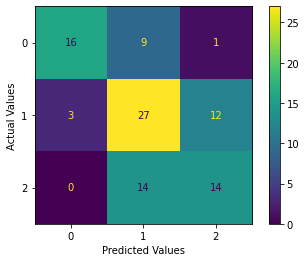

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

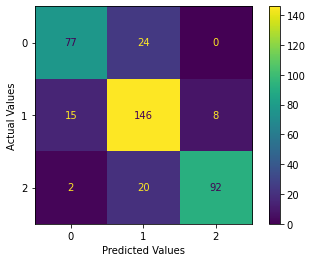

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

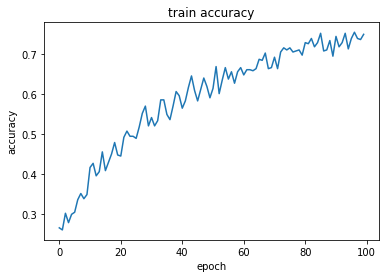

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

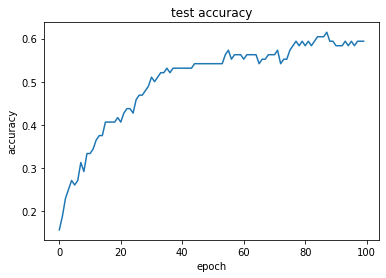

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

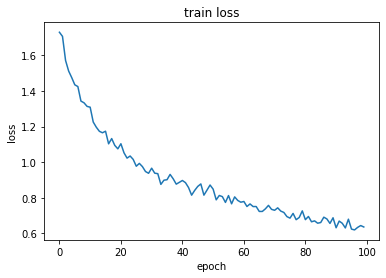

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

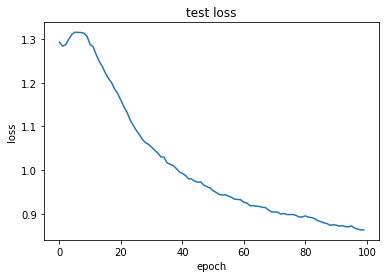

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu Adam Batch normalization**

In [ ]:
model_5layer_RAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_RAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_RAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.4204 - accuracy: 0.3073 - val_loss: 1.3463 - val_accuracy: 0.2604
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3921 - accuracy: 0.3229 - val_loss: 1.3100 - val_accuracy: 0.2812
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3099 - accuracy: 0.3438 - val_loss: 1.2974 - val_accuracy: 0.3125
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 1.2995 - accuracy: 0.3672 - val_loss: 1.2912 - val_accuracy: 0.2917
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 1.2613 - accuracy: 0.3568 - val_loss: 1.2986 - val_accuracy: 0.2812
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2776 - accuracy: 0.3646 - val_loss: 1.3076 - val_accuracy: 0.3125
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2229 - accuracy: 0.4010 - val_loss: 1.3152 - val_accuracy: 0.3229
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.6939463601532566
recall; 0.6920024420024419
F1_score: 0.6928104575163397
confusion_matrix test: 
[[19  5  2]
 [ 6 28  8]
 [ 0  9 19]]
confusion_matrix train: 
[[ 92   4   5]
 [  4 154  11]
 [  1  17  96]]


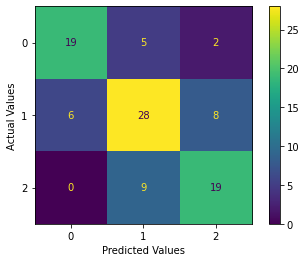

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

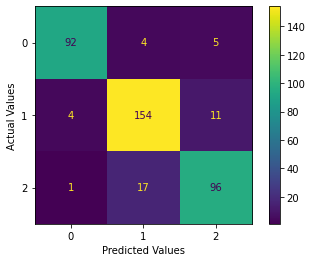

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

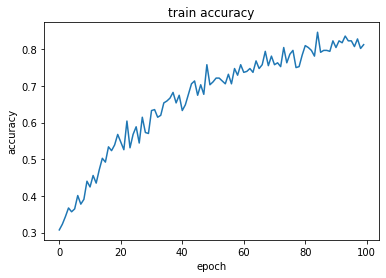

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

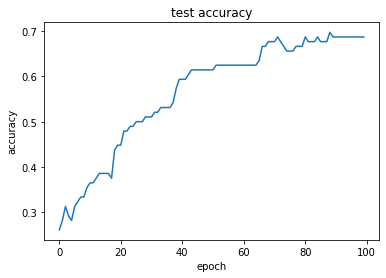

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

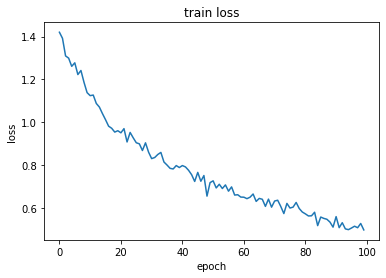

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

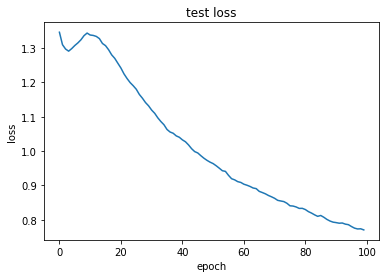

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu RMS Batch normalization**

In [ ]:
model_5layer_RRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_RRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_RRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 2s 12ms/step - loss: 1.3285 - accuracy: 0.3776 - val_loss: 1.1419 - val_accuracy: 0.3229
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3044 - accuracy: 0.3802 - val_loss: 1.1362 - val_accuracy: 0.3438
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2016 - accuracy: 0.4193 - val_loss: 1.1301 - val_accuracy: 0.3854
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1504 - accuracy: 0.4141 - val_loss: 1.1200 - val_accuracy: 0.4167
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1278 - accuracy: 0.4089 - val_loss: 1.1085 - val_accuracy: 0.4271
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0798 - accuracy: 0.4714 - val_loss: 1.0995 - val_accuracy: 0.4583
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0638 - accuracy: 0.5000 - val_loss: 1.0939 - val_accuracy: 0.4583
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.729563492063492
recall; 0.6910866910866912
F1_score: 0.7047849091327353
confusion_matrix test: 
[[18  7  1]
 [ 2 31  9]
 [ 0 10 18]]
confusion_matrix train: 
[[ 98   3   0]
 [  6 160   3]
 [  1  10 103]]


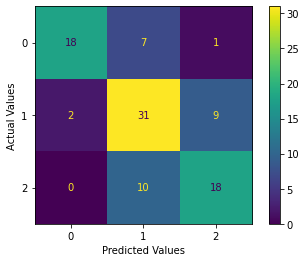

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

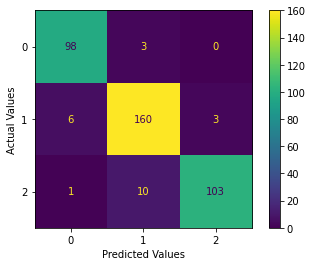

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

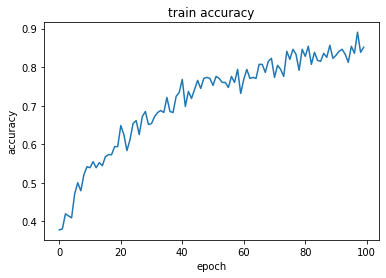

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

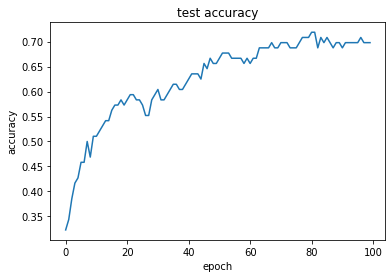

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

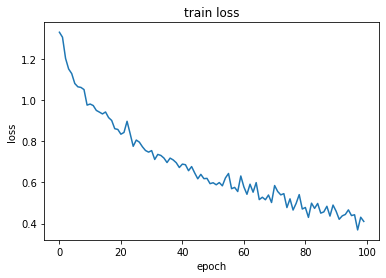

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

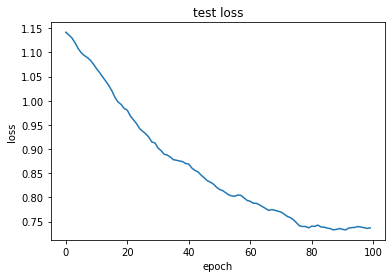

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh SGD Batch normalization**

In [ ]:
model_5layer_tSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_tSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_tSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.4680 - accuracy: 0.2760 - val_loss: 1.1913 - val_accuracy: 0.3229
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3686 - accuracy: 0.3255 - val_loss: 1.1642 - val_accuracy: 0.3125
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2635 - accuracy: 0.3490 - val_loss: 1.1403 - val_accuracy: 0.3438
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2055 - accuracy: 0.3984 - val_loss: 1.1162 - val_accuracy: 0.3958
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1442 - accuracy: 0.4115 - val_loss: 1.0946 - val_accuracy: 0.4062
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0994 - accuracy: 0.4479 - val_loss: 1.0704 - val_accuracy: 0.4167
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0979 - accuracy: 0.4531 - val_loss: 1.0485 - val_accuracy: 0.4375
Epoch 8/100


In [ ]:
predictions_test = model_5layer_tSB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tSB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.666667
precision: 0.6728645481180978
recall; 0.6956654456654455
F1_score: 0.6786445096122514
confusion_matrix test: 
[[23  2  1]
 [ 6 22 14]
 [ 0  9 19]]
confusion_matrix train: 
[[ 98   2   1]
 [ 20 128  21]
 [  2  14  98]]


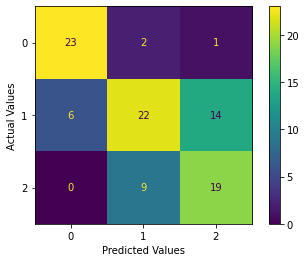

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

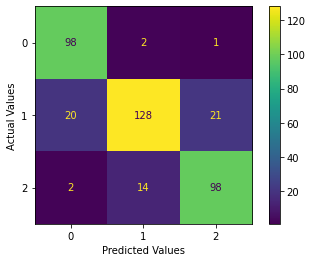

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

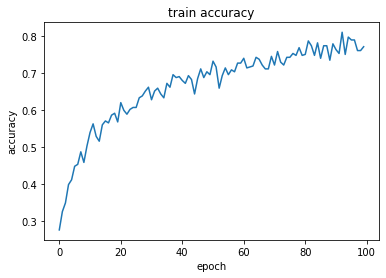

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

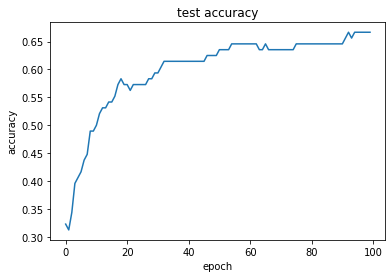

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

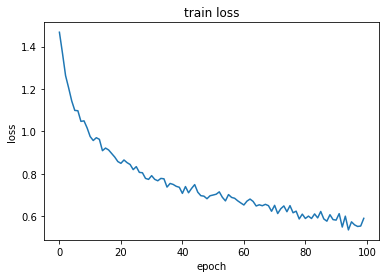

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

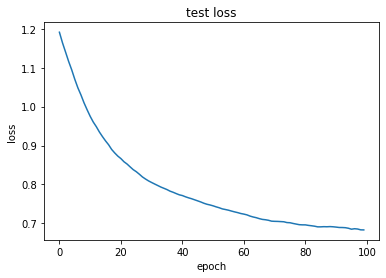

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh Adam Batch normalization**

In [ ]:
model_5layer_tAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_tAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_tAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.4736 - accuracy: 0.3464 - val_loss: 1.2063 - val_accuracy: 0.3542
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3168 - accuracy: 0.4141 - val_loss: 1.1618 - val_accuracy: 0.4062
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2406 - accuracy: 0.4479 - val_loss: 1.1125 - val_accuracy: 0.4583
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 1.1610 - accuracy: 0.4922 - val_loss: 1.0660 - val_accuracy: 0.4688
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1628 - accuracy: 0.4635 - val_loss: 1.0231 - val_accuracy: 0.5000
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0737 - accuracy: 0.5286 - val_loss: 0.9858 - val_accuracy: 0.5417
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0011 - accuracy: 0.5182 - val_loss: 0.9543 - val_accuracy: 0.5625
Epoch 8/100


In [ ]:
predictions_test = model_5layer_tAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.714975845410628
recall; 0.695970695970696
F1_score: 0.7039579468150897
confusion_matrix test: 
[[19  6  1]
 [ 4 30  8]
 [ 0 10 18]]
confusion_matrix train: 
[[100   0   1]
 [  5 154  10]
 [  0   3 111]]


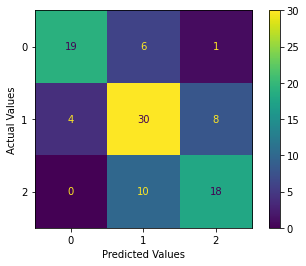

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

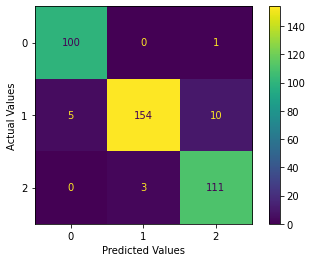

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

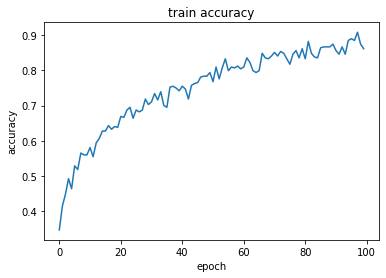

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

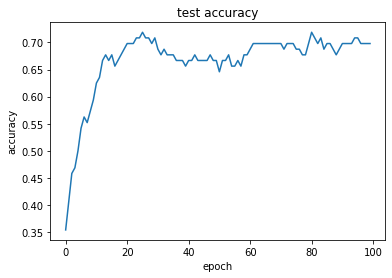

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

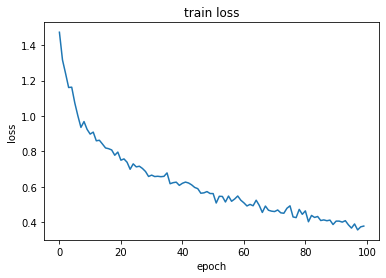

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

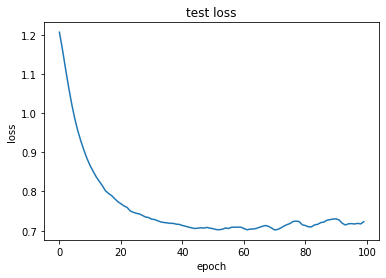

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh RMS Batch normalization**

In [ ]:
model_5layer_tRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'tanh'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_tRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_tRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 2s 13ms/step - loss: 1.3194 - accuracy: 0.2995 - val_loss: 1.1842 - val_accuracy: 0.2812
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2890 - accuracy: 0.3229 - val_loss: 1.1753 - val_accuracy: 0.2812
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2579 - accuracy: 0.3203 - val_loss: 1.1619 - val_accuracy: 0.3021
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2007 - accuracy: 0.3724 - val_loss: 1.1432 - val_accuracy: 0.3438
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1497 - accuracy: 0.4010 - val_loss: 1.1258 - val_accuracy: 0.3854
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1455 - accuracy: 0.4141 - val_loss: 1.1082 - val_accuracy: 0.3958
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0846 - accuracy: 0.4531 - val_loss: 1.0883 - val_accuracy: 0.4479
Epoch 8/100


In [ ]:
predictions_test = model_5layer_tRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7257575757575757
recall; 0.7472527472527473
F1_score: 0.7300881834215168
confusion_matrix test: 
[[23  3  0]
 [ 5 24 13]
 [ 0  6 22]]
confusion_matrix train: 
[[ 98   2   1]
 [  5 154  10]
 [  0   7 107]]


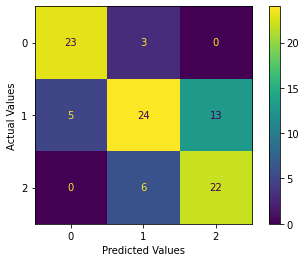

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

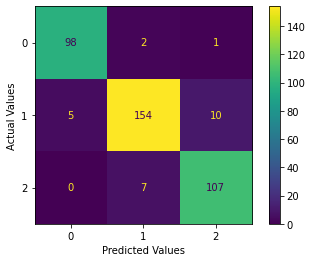

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

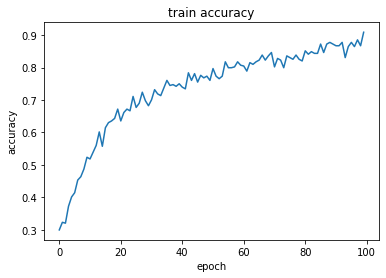

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

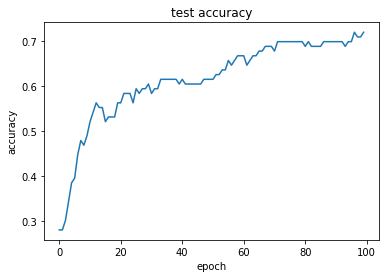

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

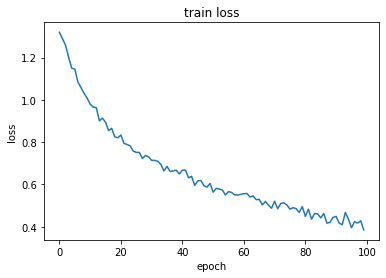

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

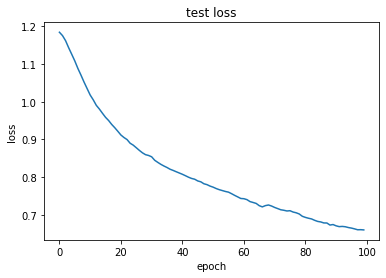

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid SGD Batch normalization**

In [ ]:
model_5layer_sSB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_sSB.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_sSB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 12ms/step - loss: 1.6822 - accuracy: 0.3073 - val_loss: 1.1675 - val_accuracy: 0.2708
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.5747 - accuracy: 0.3099 - val_loss: 1.1586 - val_accuracy: 0.2708
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.4515 - accuracy: 0.3333 - val_loss: 1.1504 - val_accuracy: 0.2708
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3736 - accuracy: 0.3203 - val_loss: 1.1427 - val_accuracy: 0.2708
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3120 - accuracy: 0.3490 - val_loss: 1.1345 - val_accuracy: 0.2708
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2230 - accuracy: 0.3828 - val_loss: 1.1251 - val_accuracy: 0.2708
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1057 - accuracy: 0.4297 - val_loss: 1.1144 - val_accuracy: 0.2708
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.729563492063492
recall; 0.6910866910866912
F1_score: 0.7047849091327353
confusion_matrix test: 
[[18  7  1]
 [ 2 31  9]
 [ 0 10 18]]
confusion_matrix train: 
[[ 98   3   0]
 [  6 160   3]
 [  1  10 103]]


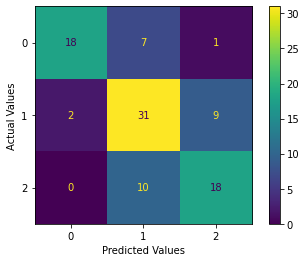

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

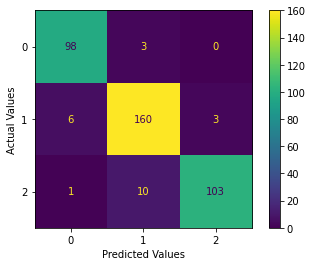

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

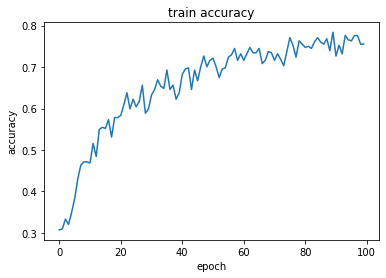

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

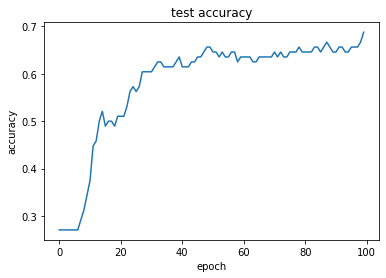

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

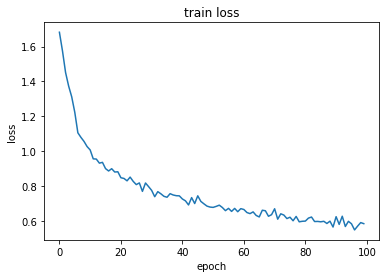

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

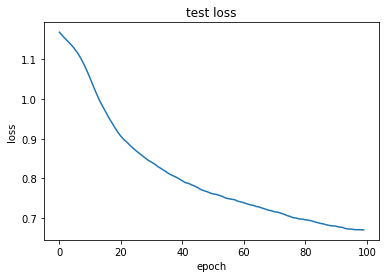

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid Adam Batch normalization**

In [ ]:
model_5layer_sAB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_sAB.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_sAB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 1.6626 - accuracy: 0.3490 - val_loss: 1.1749 - val_accuracy: 0.2917
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.4822 - accuracy: 0.3776 - val_loss: 1.1603 - val_accuracy: 0.3125
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 1.3456 - accuracy: 0.4323 - val_loss: 1.1473 - val_accuracy: 0.4062
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2477 - accuracy: 0.4661 - val_loss: 1.1337 - val_accuracy: 0.4479
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 1.1709 - accuracy: 0.5156 - val_loss: 1.1194 - val_accuracy: 0.4479
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1079 - accuracy: 0.4974 - val_loss: 1.1028 - val_accuracy: 0.4583
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0757 - accuracy: 0.5104 - val_loss: 1.0828 - val_accuracy: 0.4583
Epoch 8/100


In [ ]:
predictions_test = model_5layer_sAB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sAB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.6943167305236271
recall; 0.7017704517704518
F1_score: 0.6977552794395868
confusion_matrix test: 
[[21  5  0]
 [ 6 26 10]
 [ 0  9 19]]
confusion_matrix train: 
[[ 97   3   1]
 [  8 148  13]
 [  0  10 104]]


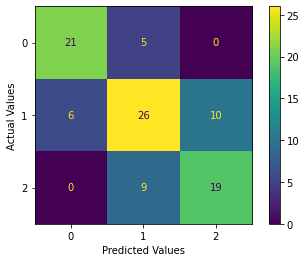

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

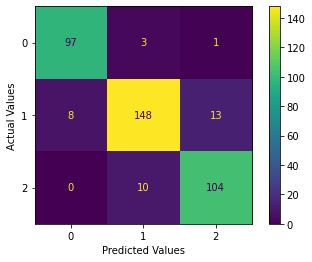

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

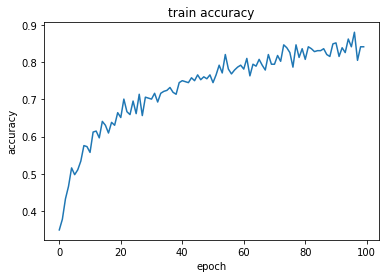

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

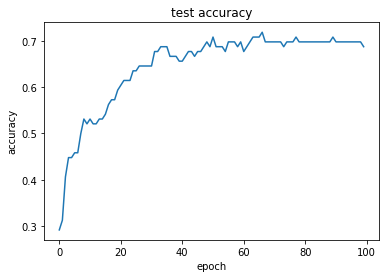

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

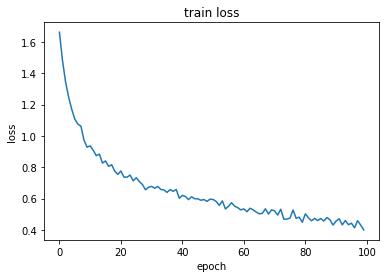

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

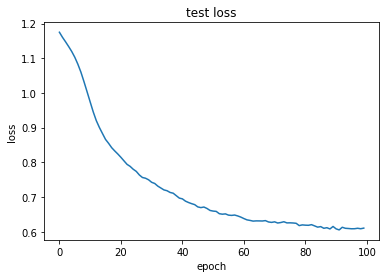

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid RMS Batch normalization**

In [ ]:
model_5layer_sRB = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(8, activation = 'sigmoid'),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_sRB.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_sRB.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 2s 13ms/step - loss: 1.4039 - accuracy: 0.4036 - val_loss: 1.1123 - val_accuracy: 0.2708
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2816 - accuracy: 0.4271 - val_loss: 1.1059 - val_accuracy: 0.2708
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1741 - accuracy: 0.4635 - val_loss: 1.1002 - val_accuracy: 0.2708
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0970 - accuracy: 0.5495 - val_loss: 1.0940 - val_accuracy: 0.3958
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0655 - accuracy: 0.5130 - val_loss: 1.0863 - val_accuracy: 0.4688
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9750 - accuracy: 0.5495 - val_loss: 1.0761 - val_accuracy: 0.5104
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9578 - accuracy: 0.5807 - val_loss: 1.0627 - val_accuracy: 0.5417
Epoch 8/100


In [ ]:
predictions_test = model_5layer_sRB.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sRB.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7129859387923904
recall; 0.7206959706959708
F1_score: 0.715920614225699
confusion_matrix test: 
[[20  5  1]
 [ 6 27  9]
 [ 0  7 21]]
confusion_matrix train: 
[[ 97   3   1]
 [ 12 142  15]
 [  0   9 105]]


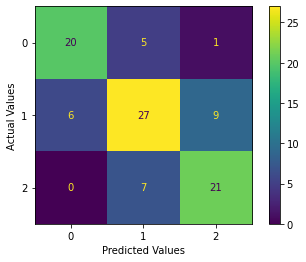

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

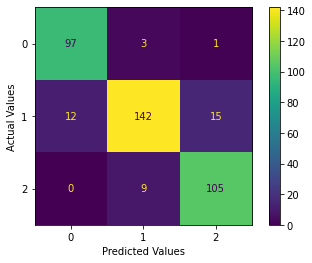

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

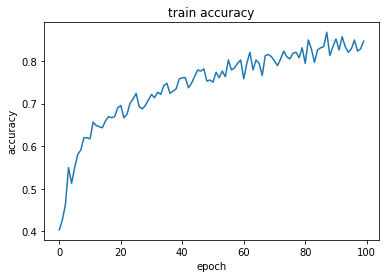

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

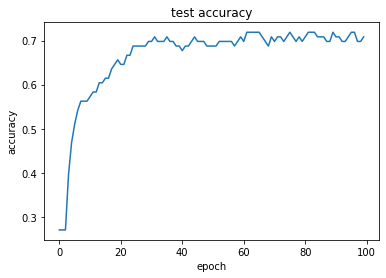

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

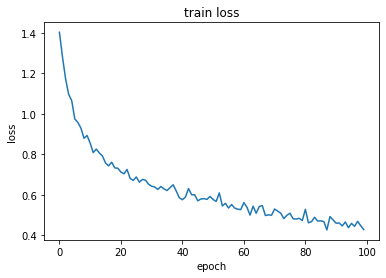

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

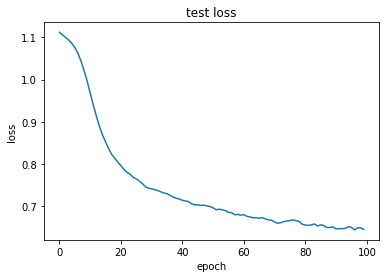

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model Relu SGD Dropout**

In [ ]:
model_3layer_RSD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_RSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 8ms/step - loss: 1.3552 - accuracy: 0.3385 - val_loss: 1.0556 - val_accuracy: 0.4688
Epoch 2/100
24/24 [==============================] - 0s 2ms/step - loss: 1.1499 - accuracy: 0.4297 - val_loss: 0.9507 - val_accuracy: 0.6042
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0319 - accuracy: 0.4766 - val_loss: 0.8955 - val_accuracy: 0.6250
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9489 - accuracy: 0.5286 - val_loss: 0.8516 - val_accuracy: 0.6354
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9270 - accuracy: 0.5651 - val_loss: 0.8186 - val_accuracy: 0.6354
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8105 - accuracy: 0.6276 - val_loss: 0.7883 - val_accuracy: 0.6771
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8325 - accuracy: 0.5703 - val_loss: 0.7594 - val_accuracy: 0.6875
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_RSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7384469696969697
recall; 0.710927960927961
F1_score: 0.7190091001011121
confusion_matrix test: 
[[18  8  0]
 [ 2 29 11]
 [ 0  7 21]]
confusion_matrix train: 
[[ 99   2   0]
 [  5 155   9]
 [  0   7 107]]


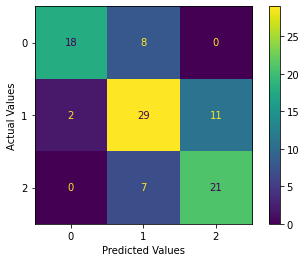

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

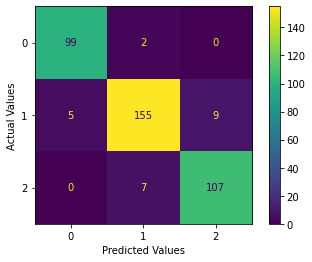

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

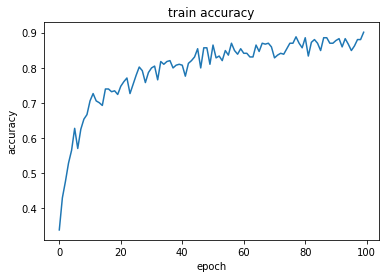

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

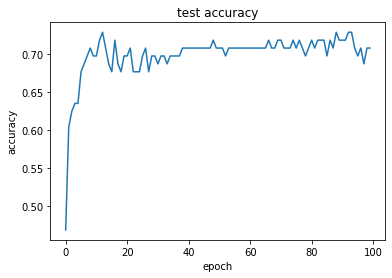

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

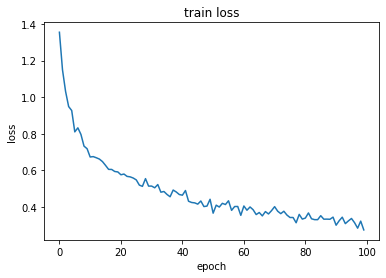

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

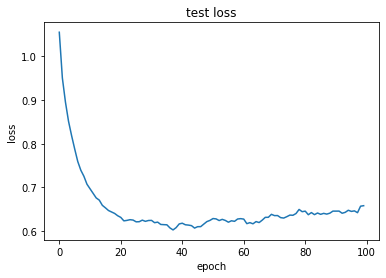

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model Relu Adam Dropout**

In [ ]:
model_3layer_RAD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_RAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.3088 - accuracy: 0.3177 - val_loss: 1.2276 - val_accuracy: 0.2500
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2585 - accuracy: 0.3359 - val_loss: 1.1929 - val_accuracy: 0.2500
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2297 - accuracy: 0.3490 - val_loss: 1.1611 - val_accuracy: 0.2917
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1920 - accuracy: 0.3698 - val_loss: 1.1344 - val_accuracy: 0.3229
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1816 - accuracy: 0.3672 - val_loss: 1.1107 - val_accuracy: 0.3750
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0851 - accuracy: 0.4167 - val_loss: 1.0899 - val_accuracy: 0.4375
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1030 - accuracy: 0.4271 - val_loss: 1.0722 - val_accuracy: 0.4688
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_RAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.677083
precision: 0.6875094347760453
recall; 0.68986568986569
F1_score: 0.6885924263857048
confusion_matrix test: 
[[21  5  0]
 [ 5 26 11]
 [ 0 10 18]]
confusion_matrix train: 
[[ 97   4   0]
 [ 13 139  17]
 [  0  19  95]]


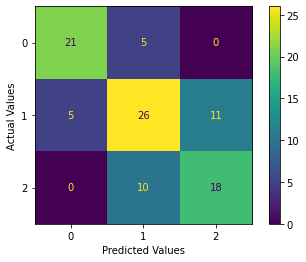

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

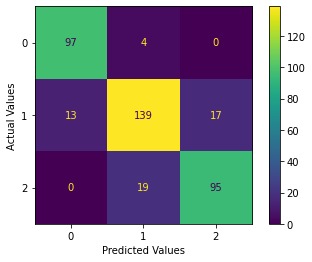

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

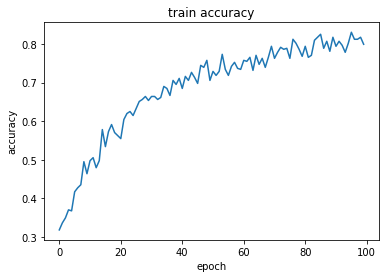

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

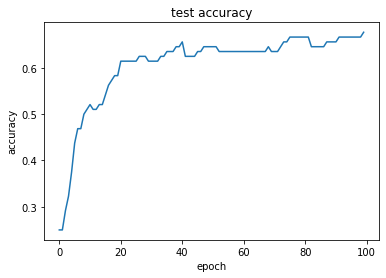

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

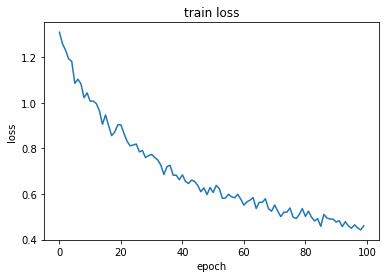

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

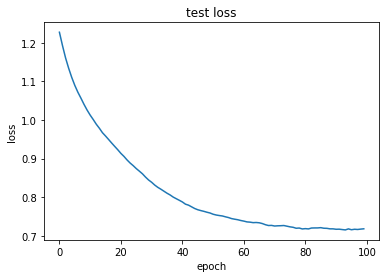

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model Relu RMS Dropout**

In [ ]:
model_3layer_RRD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_RRD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_RRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.3905 - accuracy: 0.3099 - val_loss: 1.2402 - val_accuracy: 0.3542
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.3807 - accuracy: 0.3464 - val_loss: 1.1946 - val_accuracy: 0.3333
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3490 - accuracy: 0.3333 - val_loss: 1.1567 - val_accuracy: 0.3646
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2517 - accuracy: 0.3568 - val_loss: 1.1249 - val_accuracy: 0.3854
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2068 - accuracy: 0.3932 - val_loss: 1.0981 - val_accuracy: 0.4062
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1885 - accuracy: 0.3906 - val_loss: 1.0744 - val_accuracy: 0.4062
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1360 - accuracy: 0.4505 - val_loss: 1.0543 - val_accuracy: 0.4479
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_RRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_RRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.7111111111111111
recall; 0.6920024420024419
F1_score: 0.6993339570524815
confusion_matrix test: 
[[19  7  0]
 [ 3 28 11]
 [ 0  9 19]]
confusion_matrix train: 
[[ 96   5   0]
 [  8 144  17]
 [  0  13 101]]


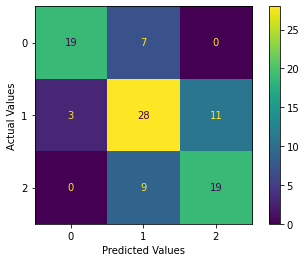

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

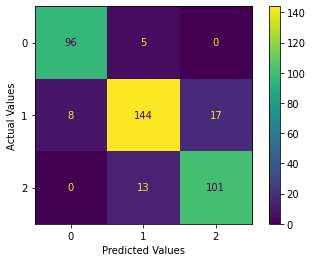

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

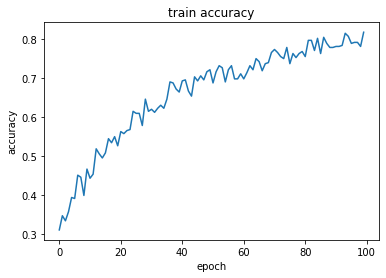

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

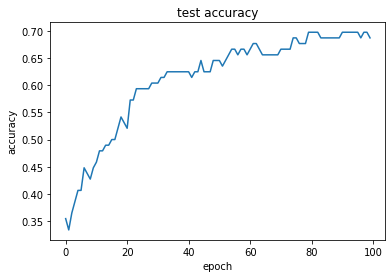

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

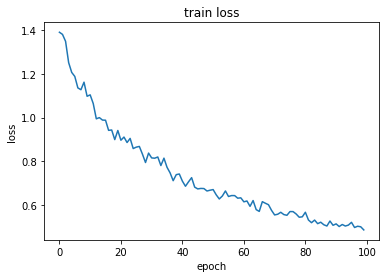

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

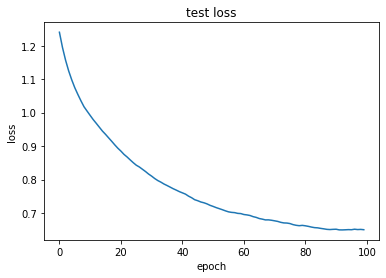

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model tanh SGD Dropout**

In [ ]:
model_3layer_tSD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_tSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_tSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.1406 - accuracy: 0.3854 - val_loss: 0.9419 - val_accuracy: 0.5417
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9526 - accuracy: 0.5443 - val_loss: 0.8539 - val_accuracy: 0.6042
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8837 - accuracy: 0.5859 - val_loss: 0.8097 - val_accuracy: 0.6146
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8319 - accuracy: 0.5938 - val_loss: 0.7779 - val_accuracy: 0.6458
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.7743 - accuracy: 0.6354 - val_loss: 0.7554 - val_accuracy: 0.6354
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.7426 - accuracy: 0.6406 - val_loss: 0.7363 - val_accuracy: 0.6458
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.7011 - accuracy: 0.6901 - val_loss: 0.7234 - val_accuracy: 0.6667
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_tSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7307692307692307
recall; 0.7326007326007327
F1_score: 0.7293260473588342
confusion_matrix test: 
[[20  6  0]
 [ 4 27 11]
 [ 0  6 22]]
confusion_matrix train: 
[[ 99   2   0]
 [  4 152  13]
 [  0  10 104]]


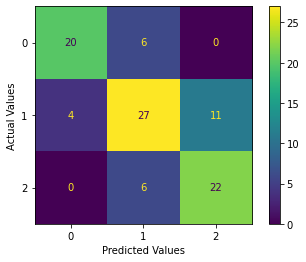

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

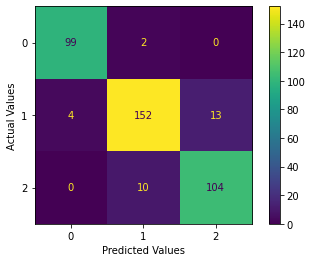

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

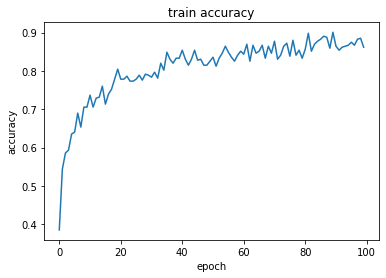

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

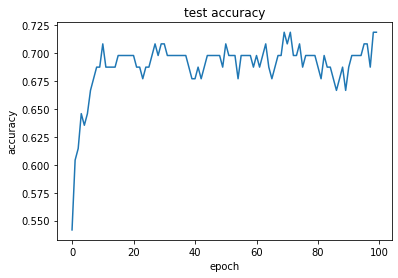

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

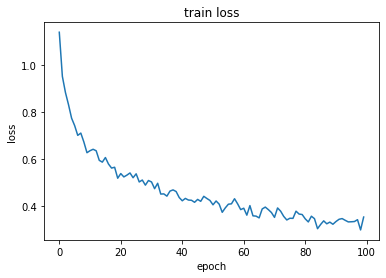

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

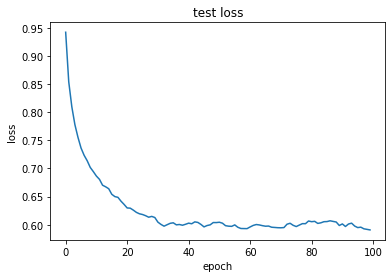

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model tanh Adam Dropout**

In [ ]:
model_3layer_tAD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_tAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_tAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.2266 - accuracy: 0.3828 - val_loss: 1.1452 - val_accuracy: 0.4167
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 1.1791 - accuracy: 0.4010 - val_loss: 1.0947 - val_accuracy: 0.4375
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1285 - accuracy: 0.4375 - val_loss: 1.0539 - val_accuracy: 0.4688
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0900 - accuracy: 0.4688 - val_loss: 1.0177 - val_accuracy: 0.4583
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0253 - accuracy: 0.4844 - val_loss: 0.9869 - val_accuracy: 0.4688
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0186 - accuracy: 0.4922 - val_loss: 0.9596 - val_accuracy: 0.4792
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9899 - accuracy: 0.4974 - val_loss: 0.9347 - val_accuracy: 0.4896
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_tAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.70840108401084
recall; 0.7087912087912088
F1_score: 0.7081904358475145
confusion_matrix test: 
[[20  6  0]
 [ 5 27 10]
 [ 0  8 20]]
confusion_matrix train: 
[[ 96   5   0]
 [  9 144  16]
 [  0  18  96]]


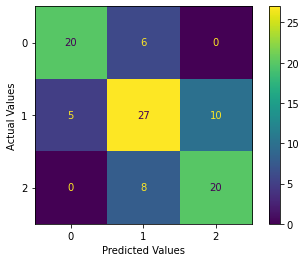

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

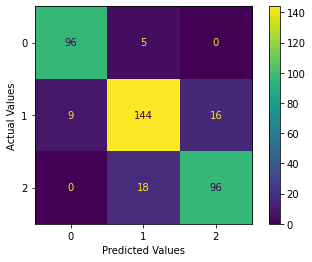

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

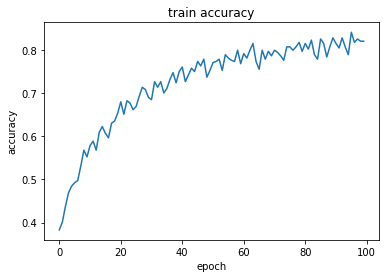

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

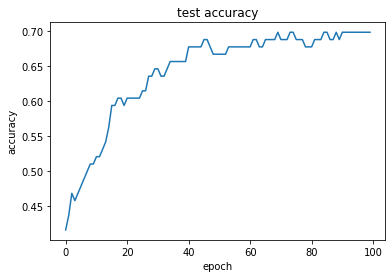

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

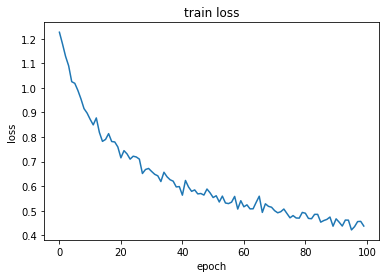

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

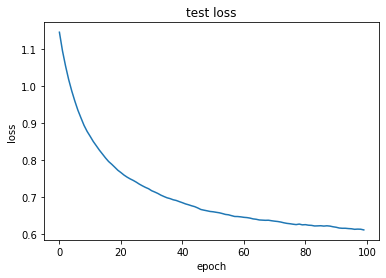

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model tanh RMS Dropout**

In [ ]:
model_3layer_tRD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_tRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_tRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.2501 - accuracy: 0.3411 - val_loss: 1.1687 - val_accuracy: 0.3125
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2461 - accuracy: 0.3359 - val_loss: 1.1229 - val_accuracy: 0.3958
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1687 - accuracy: 0.3828 - val_loss: 1.0850 - val_accuracy: 0.4375
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1512 - accuracy: 0.4245 - val_loss: 1.0511 - val_accuracy: 0.4479
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0969 - accuracy: 0.4297 - val_loss: 1.0213 - val_accuracy: 0.4583
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0552 - accuracy: 0.4245 - val_loss: 0.9941 - val_accuracy: 0.4688
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0465 - accuracy: 0.4609 - val_loss: 0.9688 - val_accuracy: 0.5104
Epoch 8/100
2

In [ ]:
predictions_test = model_3layer_tRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_tRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.677083
precision: 0.6818797964631299
recall; 0.696886446886447
F1_score: 0.6874373059469786
confusion_matrix test: 
[[20  6  0]
 [ 7 24 11]
 [ 0  7 21]]
confusion_matrix train: 
[[ 95   6   0]
 [  9 142  18]
 [  0  15  99]]


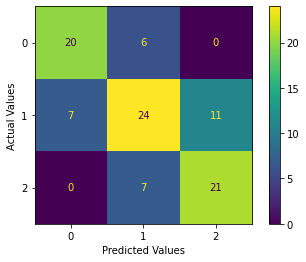

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

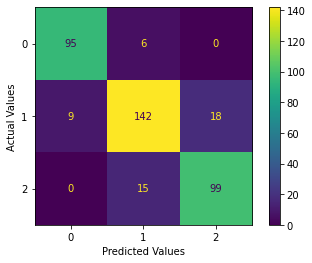

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

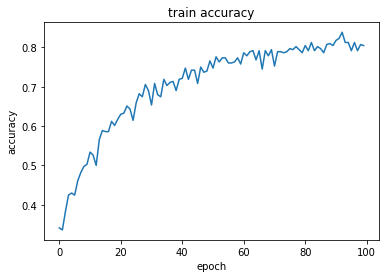

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

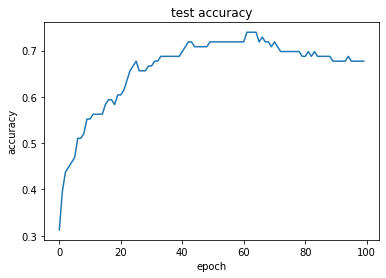

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

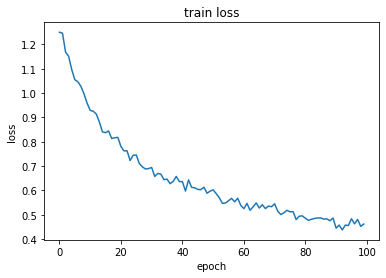

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

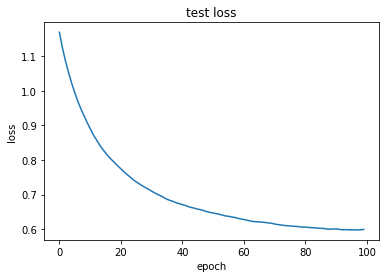

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model sigmoid SGD Dropout**

In [ ]:
model_3layer_sSD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_sSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_sSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 9ms/step - loss: 1.1617 - accuracy: 0.3229 - val_loss: 1.0743 - val_accuracy: 0.4375
Epoch 2/500
24/24 [==============================] - 0s 4ms/step - loss: 1.1232 - accuracy: 0.3906 - val_loss: 1.0628 - val_accuracy: 0.4375
Epoch 3/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1223 - accuracy: 0.3958 - val_loss: 1.0588 - val_accuracy: 0.4375
Epoch 4/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1157 - accuracy: 0.3698 - val_loss: 1.0562 - val_accuracy: 0.4375
Epoch 5/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0972 - accuracy: 0.3906 - val_loss: 1.0536 - val_accuracy: 0.4375
Epoch 6/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1517 - accuracy: 0.3568 - val_loss: 1.0507 - val_accuracy: 0.4375
Epoch 7/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0750 - accuracy: 0.4141 - val_loss: 1.0483 - val_accuracy: 0.4375
Epoch 8/500
2

In [ ]:
predictions_test = model_3layer_sSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.739583
precision: 0.7447972447972449
recall; 0.7573260073260073
F1_score: 0.7484449907151712
confusion_matrix test: 
[[21  5  0]
 [ 5 27 10]
 [ 0  5 23]]
confusion_matrix train: 
[[ 92   9   0]
 [ 11 130  28]
 [  0  19  95]]


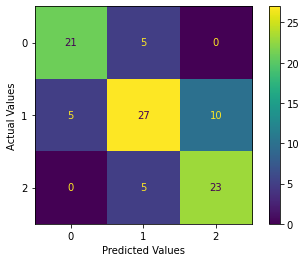

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

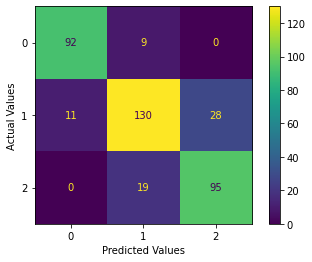

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

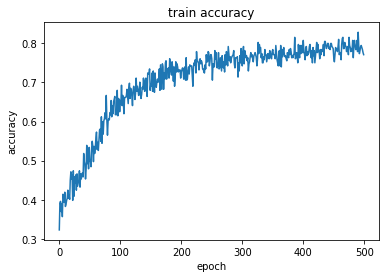

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

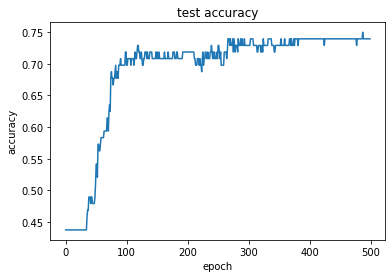

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

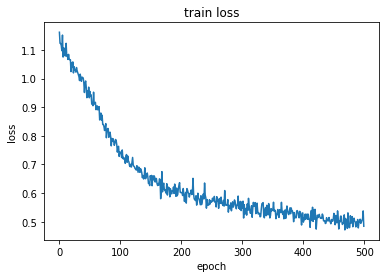

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

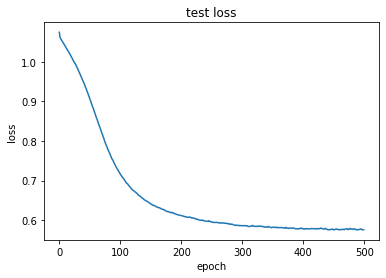

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model sigmoid Adam Dropout**

In [ ]:
model_3layer_sAD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_sAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_sAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 9ms/step - loss: 1.1880 - accuracy: 0.3542 - val_loss: 1.0833 - val_accuracy: 0.4479
Epoch 2/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1409 - accuracy: 0.3880 - val_loss: 1.0718 - val_accuracy: 0.4479
Epoch 3/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1339 - accuracy: 0.3906 - val_loss: 1.0627 - val_accuracy: 0.4271
Epoch 4/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1435 - accuracy: 0.3724 - val_loss: 1.0548 - val_accuracy: 0.4375
Epoch 5/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1705 - accuracy: 0.3464 - val_loss: 1.0489 - val_accuracy: 0.4479
Epoch 6/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1082 - accuracy: 0.4115 - val_loss: 1.0429 - val_accuracy: 0.4479
Epoch 7/500
24/24 [==============================] - 0s 4ms/step - loss: 1.0906 - accuracy: 0.3958 - val_loss: 1.0366 - val_accuracy: 0.4479
Epoch 8/500
2

In [ ]:
predictions_test = model_3layer_sAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7365591397849464
recall; 0.7405372405372406
F1_score: 0.7376677555409653
confusion_matrix test: 
[[20  6  0]
 [ 5 28  9]
 [ 0  6 22]]
confusion_matrix train: 
[[ 95   6   0]
 [  8 145  16]
 [  0  17  97]]


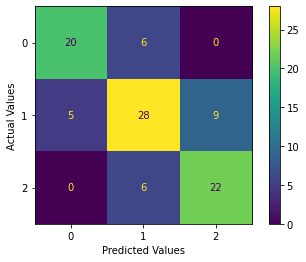

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

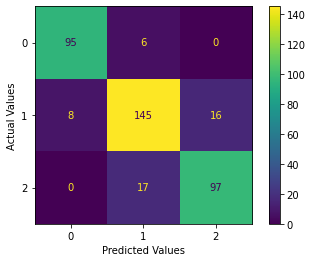

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

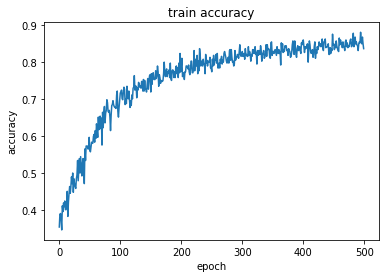

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

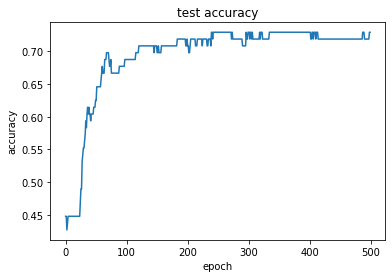

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

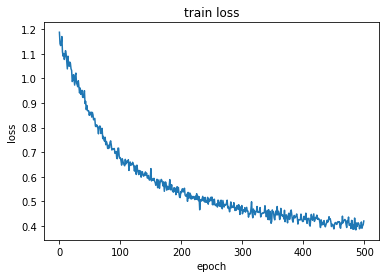

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

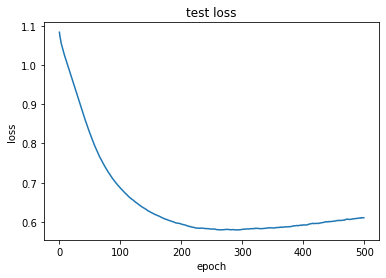

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 3-layer model sigmoid RMS Dropout**

In [ ]:
model_3layer_sRD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_3layer_sRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_3layer_sRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 9ms/step - loss: 1.2605 - accuracy: 0.3177 - val_loss: 1.1706 - val_accuracy: 0.2708
Epoch 2/500
24/24 [==============================] - 0s 3ms/step - loss: 1.2055 - accuracy: 0.3646 - val_loss: 1.1435 - val_accuracy: 0.3021
Epoch 3/500
24/24 [==============================] - 0s 3ms/step - loss: 1.2315 - accuracy: 0.3281 - val_loss: 1.1192 - val_accuracy: 0.3750
Epoch 4/500
24/24 [==============================] - 0s 4ms/step - loss: 1.1836 - accuracy: 0.3438 - val_loss: 1.1002 - val_accuracy: 0.4688
Epoch 5/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1480 - accuracy: 0.3464 - val_loss: 1.0847 - val_accuracy: 0.4583
Epoch 6/500
24/24 [==============================] - 0s 4ms/step - loss: 1.1513 - accuracy: 0.3802 - val_loss: 1.0718 - val_accuracy: 0.4375
Epoch 7/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1124 - accuracy: 0.4062 - val_loss: 1.0621 - val_accuracy: 0.4375
Epoch 8/500
2

In [ ]:
predictions_test = model_3layer_sRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_3layer_sRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7266025641025641
recall; 0.7326007326007327
F1_score: 0.7281045751633988
confusion_matrix test: 
[[20  6  0]
 [ 5 27 10]
 [ 0  6 22]]
confusion_matrix train: 
[[ 92   9   0]
 [  8 144  17]
 [  0  15  99]]


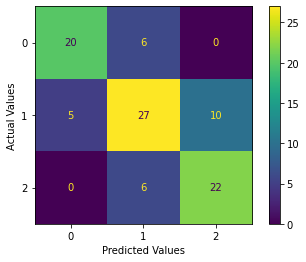

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

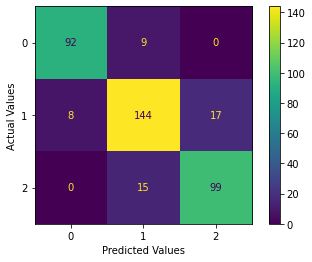

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

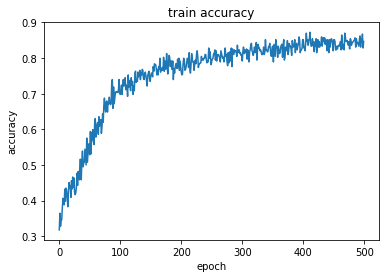

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

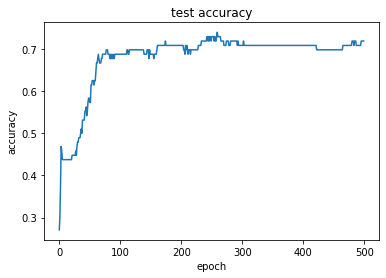

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

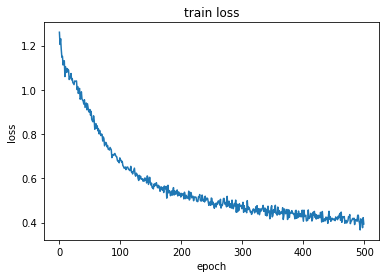

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

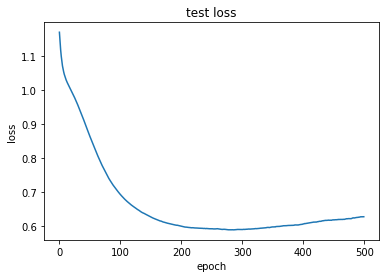

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu SGD Dropout**

In [ ]:
model_4layer_RSD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.3532 - accuracy: 0.3255 - val_loss: 1.1235 - val_accuracy: 0.3750
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2067 - accuracy: 0.3438 - val_loss: 1.0582 - val_accuracy: 0.4375
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0802 - accuracy: 0.4245 - val_loss: 1.0323 - val_accuracy: 0.4896
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0752 - accuracy: 0.4141 - val_loss: 1.0072 - val_accuracy: 0.5000
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0098 - accuracy: 0.5026 - val_loss: 0.9855 - val_accuracy: 0.5000
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0378 - accuracy: 0.4740 - val_loss: 0.9642 - val_accuracy: 0.5208
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9820 - accuracy: 0.5130 - val_loss: 0.9383 - val_accuracy: 0.5625
Epoch 8/100
2

In [ ]:
predictions_test = model_4layer_RSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.750000
precision: 0.7702922077922079
recall; 0.7564102564102564
F1_score: 0.7603174603174603
confusion_matrix test: 
[[20  6  0]
 [ 2 30 10]
 [ 0  6 22]]
confusion_matrix train: 
[[ 98   3   0]
 [  4 151  14]
 [  0   8 106]]


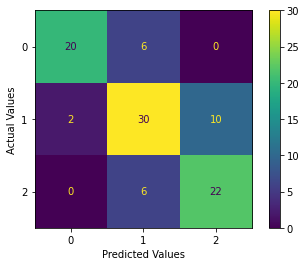

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

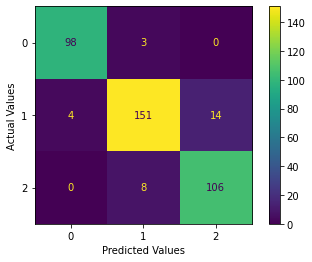

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

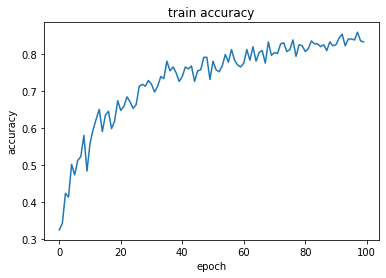

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

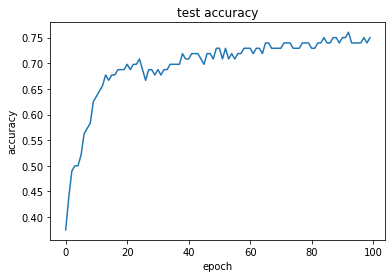

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

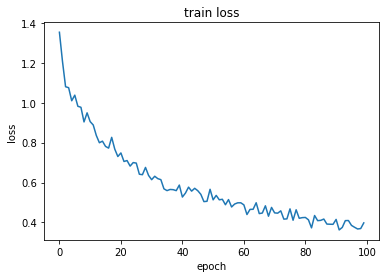

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

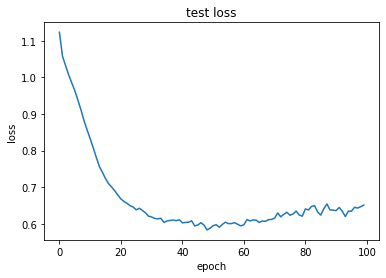

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu Adam Dropout**

In [ ]:
model_4layer_RAD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.2575 - accuracy: 0.3281 - val_loss: 1.2244 - val_accuracy: 0.2708
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1959 - accuracy: 0.3333 - val_loss: 1.1721 - val_accuracy: 0.2604
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0815 - accuracy: 0.4089 - val_loss: 1.1287 - val_accuracy: 0.3125
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1093 - accuracy: 0.3776 - val_loss: 1.0906 - val_accuracy: 0.3750
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0567 - accuracy: 0.4297 - val_loss: 1.0618 - val_accuracy: 0.3854
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0155 - accuracy: 0.4688 - val_loss: 1.0347 - val_accuracy: 0.4062
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0100 - accuracy: 0.4609 - val_loss: 1.0114 - val_accuracy: 0.4167
Epoch 8/100


In [ ]:
predictions_test = model_4layer_RAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.729167
precision: 0.7470128572077597
recall; 0.7326007326007327
F1_score: 0.7385851117272694
confusion_matrix test: 
[[20  6  0]
 [ 3 30  9]
 [ 0  8 20]]
confusion_matrix train: 
[[ 98   3   0]
 [  7 152  10]
 [  0   8 106]]


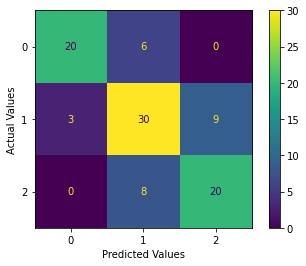

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

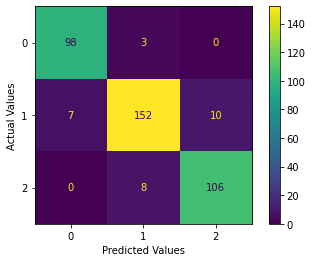

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

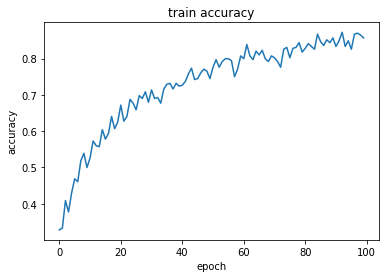

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

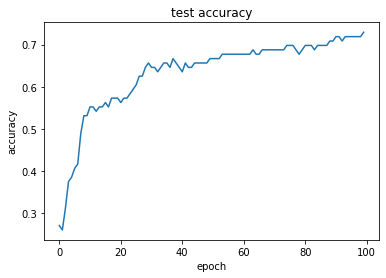

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

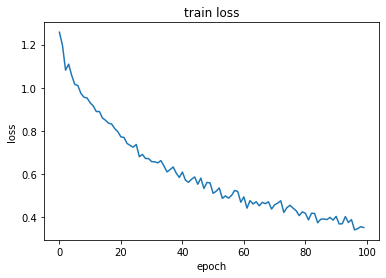

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

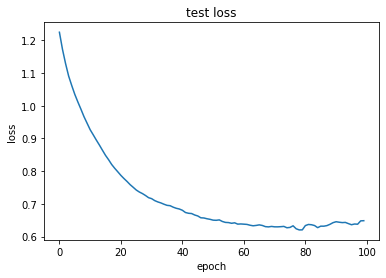

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model Relu RMS Dropout**

In [ ]:
model_4layer_RSD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_RSD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_RSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.2217 - accuracy: 0.3307 - val_loss: 1.1270 - val_accuracy: 0.3229
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1584 - accuracy: 0.3411 - val_loss: 1.0868 - val_accuracy: 0.3646
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1295 - accuracy: 0.3828 - val_loss: 1.0565 - val_accuracy: 0.3958
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1197 - accuracy: 0.3724 - val_loss: 1.0367 - val_accuracy: 0.4375
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1019 - accuracy: 0.3802 - val_loss: 1.0173 - val_accuracy: 0.4896
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0406 - accuracy: 0.4297 - val_loss: 1.0040 - val_accuracy: 0.5417
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0472 - accuracy: 0.4401 - val_loss: 0.9889 - val_accuracy: 0.5417
Epoch 8/100
2

In [ ]:
predictions_test = model_4layer_RSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_RSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7299205087440382
recall; 0.7374847374847375
F1_score: 0.7304782264069368
confusion_matrix test: 
[[21  5  0]
 [ 4 26 12]
 [ 0  6 22]]
confusion_matrix train: 
[[ 98   3   0]
 [  8 149  12]
 [  0  10 104]]


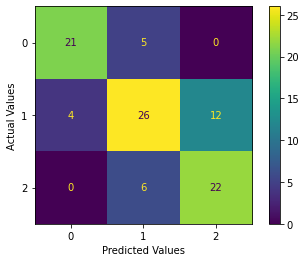

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

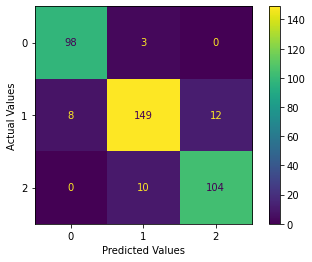

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

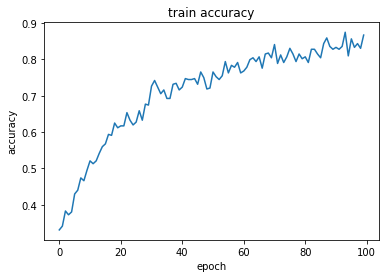

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

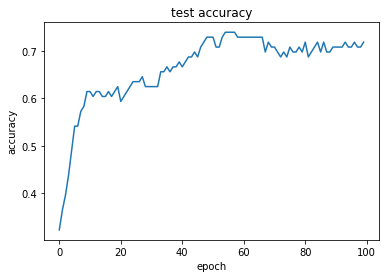

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

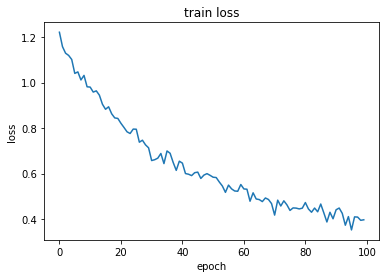

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

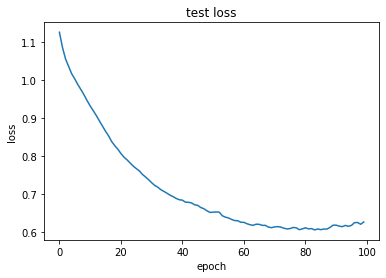

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model tanh SGD Dropout**

In [ ]:
model_4layer_tSD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_tSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_tSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.1549 - accuracy: 0.4297 - val_loss: 0.9784 - val_accuracy: 0.5312
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0809 - accuracy: 0.4479 - val_loss: 0.9079 - val_accuracy: 0.5729
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0041 - accuracy: 0.5026 - val_loss: 0.8589 - val_accuracy: 0.5729
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9121 - accuracy: 0.5286 - val_loss: 0.8249 - val_accuracy: 0.5417
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9666 - accuracy: 0.5312 - val_loss: 0.7938 - val_accuracy: 0.6042
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8573 - accuracy: 0.5911 - val_loss: 0.7679 - val_accuracy: 0.6042
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8717 - accuracy: 0.5599 - val_loss: 0.7477 - val_accuracy: 0.5938
Epoch 8/100
2

In [ ]:
predictions_test = model_4layer_tSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.687500
precision: 0.6890917286454812
recall; 0.7136752136752137
F1_score: 0.6967369989803122
confusion_matrix test: 
[[21  5  0]
 [ 8 23 11]
 [ 0  6 22]]
confusion_matrix train: 
[[ 98   3   0]
 [ 10 138  21]
 [  0   7 107]]


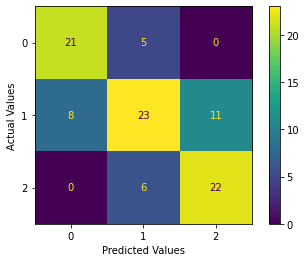

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

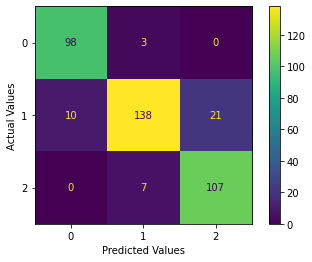

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

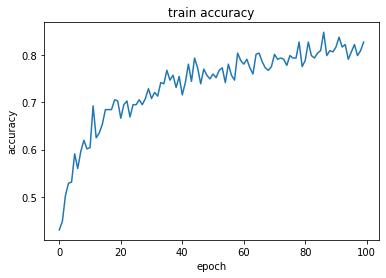

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

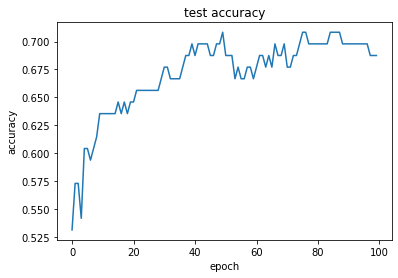

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

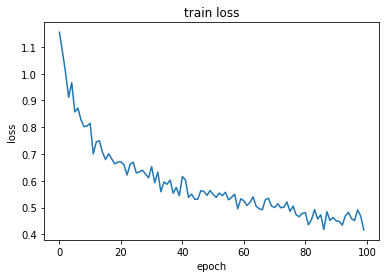

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

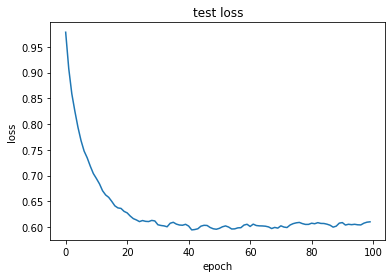

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model tanh Adam Dropout**

In [ ]:
model_4layer_tAD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_tAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_tAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.2457 - accuracy: 0.3125 - val_loss: 1.2168 - val_accuracy: 0.2917
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1811 - accuracy: 0.3672 - val_loss: 1.1667 - val_accuracy: 0.3229
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0976 - accuracy: 0.4245 - val_loss: 1.1215 - val_accuracy: 0.3333
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0939 - accuracy: 0.3906 - val_loss: 1.0817 - val_accuracy: 0.3750
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0846 - accuracy: 0.4219 - val_loss: 1.0479 - val_accuracy: 0.4271
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0071 - accuracy: 0.4661 - val_loss: 1.0184 - val_accuracy: 0.4479
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0373 - accuracy: 0.4401 - val_loss: 0.9927 - val_accuracy: 0.4375
Epoch 8/100


In [ ]:
predictions_test = model_4layer_tAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7299205087440382
recall; 0.7374847374847375
F1_score: 0.7304782264069368
confusion_matrix test: 
[[21  5  0]
 [ 4 26 12]
 [ 0  6 22]]
confusion_matrix train: 
[[ 97   4   0]
 [ 11 142  16]
 [  0  14 100]]


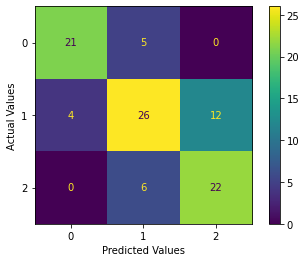

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

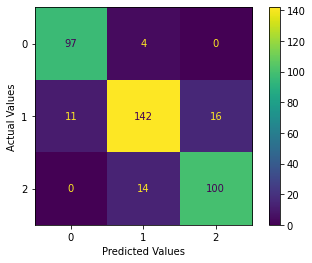

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

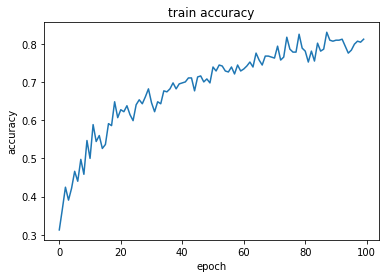

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

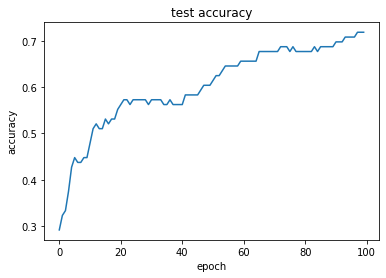

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

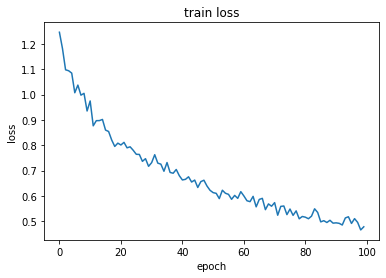

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

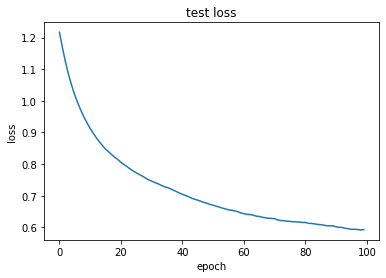

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model tanh RMS Dropout**

In [ ]:
model_4layer_tRD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_tRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_tRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.2327 - accuracy: 0.3359 - val_loss: 1.1172 - val_accuracy: 0.4167
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2261 - accuracy: 0.3802 - val_loss: 1.0918 - val_accuracy: 0.4271
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2068 - accuracy: 0.3698 - val_loss: 1.0686 - val_accuracy: 0.4375
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1753 - accuracy: 0.3932 - val_loss: 1.0451 - val_accuracy: 0.4479
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1277 - accuracy: 0.4401 - val_loss: 1.0245 - val_accuracy: 0.4479
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1556 - accuracy: 0.4115 - val_loss: 1.0082 - val_accuracy: 0.4479
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1431 - accuracy: 0.4245 - val_loss: 0.9916 - val_accuracy: 0.4583
Epoch 8/100
2

In [ ]:
predictions_test = model_4layer_tRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_tRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.666667
precision: 0.6771094402673349
recall; 0.7026862026862027
F1_score: 0.6790123456790124
confusion_matrix test: 
[[22  4  0]
 [ 6 20 16]
 [ 0  6 22]]
confusion_matrix train: 
[[ 96   5   0]
 [ 15 124  30]
 [  1  15  98]]


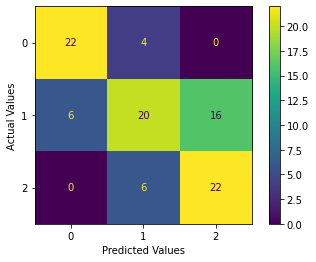

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

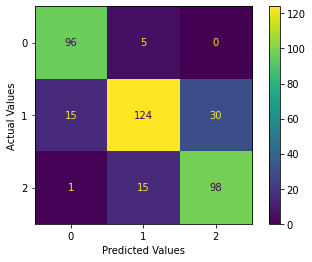

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

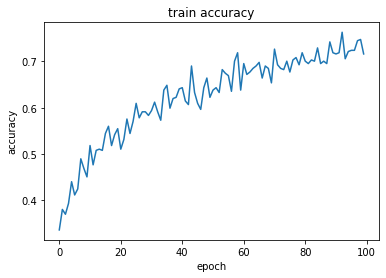

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

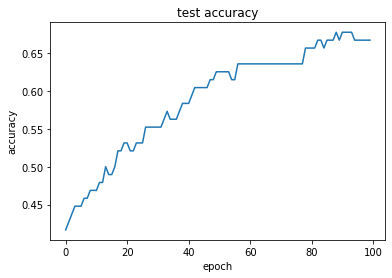

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

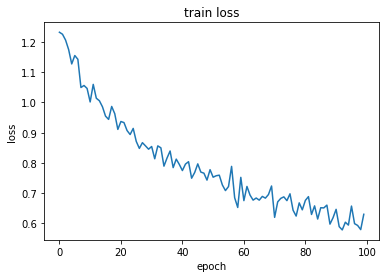

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

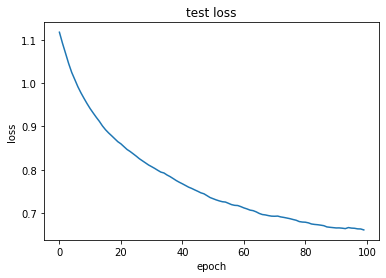

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model sigmoid SGD Dropout**

In [ ]:
model_4layer_sSD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_sSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.1), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_sSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 9ms/step - loss: 1.1279 - accuracy: 0.3411 - val_loss: 1.0751 - val_accuracy: 0.4375
Epoch 2/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1035 - accuracy: 0.3854 - val_loss: 1.0738 - val_accuracy: 0.4375
Epoch 3/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0807 - accuracy: 0.4115 - val_loss: 1.0776 - val_accuracy: 0.4375
Epoch 4/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0779 - accuracy: 0.4245 - val_loss: 1.0729 - val_accuracy: 0.4375
Epoch 5/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0885 - accuracy: 0.4375 - val_loss: 1.0767 - val_accuracy: 0.4375
Epoch 6/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0860 - accuracy: 0.4349 - val_loss: 1.0809 - val_accuracy: 0.4375
Epoch 7/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0898 - accuracy: 0.4141 - val_loss: 1.0774 - val_accuracy: 0.4375
Epoch 8/500
2

In [ ]:
predictions_test = model_4layer_sSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.739583
precision: 0.7532193732193733
recall; 0.7414529914529915
F1_score: 0.746625597876443
confusion_matrix test: 
[[21  5  0]
 [ 4 31  7]
 [ 0  9 19]]
confusion_matrix train: 
[[100   1   0]
 [  3 160   6]
 [  0   4 110]]


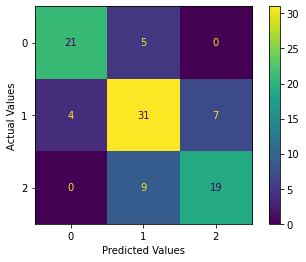

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

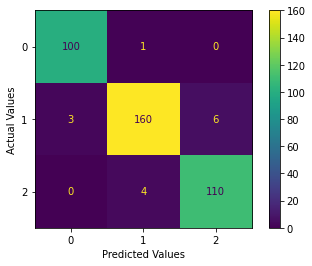

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

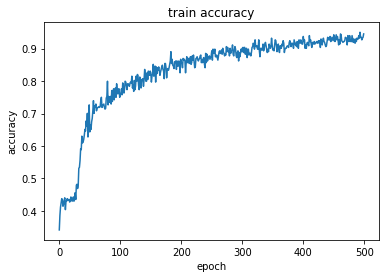

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

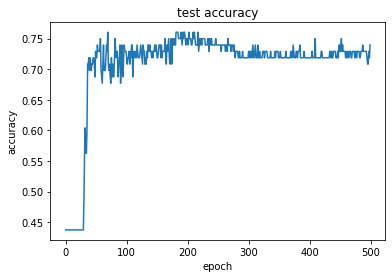

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

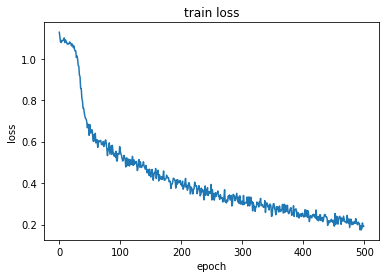

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

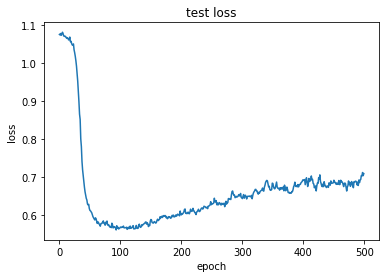

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model sigmoid Adam Dropout**

In [ ]:
model_4layer_sAD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_sAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_sAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 10ms/step - loss: 1.3738 - accuracy: 0.4427 - val_loss: 1.3019 - val_accuracy: 0.4375
Epoch 2/500
24/24 [==============================] - 0s 3ms/step - loss: 1.3092 - accuracy: 0.4427 - val_loss: 1.2662 - val_accuracy: 0.4375
Epoch 3/500
24/24 [==============================] - 0s 4ms/step - loss: 1.2759 - accuracy: 0.4453 - val_loss: 1.2364 - val_accuracy: 0.4375
Epoch 4/500
24/24 [==============================] - 0s 3ms/step - loss: 1.2352 - accuracy: 0.4401 - val_loss: 1.2090 - val_accuracy: 0.4375
Epoch 5/500
24/24 [==============================] - 0s 3ms/step - loss: 1.2228 - accuracy: 0.4401 - val_loss: 1.1866 - val_accuracy: 0.4375
Epoch 6/500
24/24 [==============================] - 0s 4ms/step - loss: 1.2253 - accuracy: 0.4245 - val_loss: 1.1648 - val_accuracy: 0.4375
Epoch 7/500
24/24 [==============================] - 0s 4ms/step - loss: 1.1935 - accuracy: 0.4401 - val_loss: 1.1471 - val_accuracy: 0.4375
Epoch 8/500


In [ ]:
predictions_test = model_4layer_sAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7266025641025641
recall; 0.7326007326007327
F1_score: 0.7281045751633988
confusion_matrix test: 
[[20  6  0]
 [ 5 27 10]
 [ 0  6 22]]
confusion_matrix train: 
[[ 96   5   0]
 [  7 147  15]
 [  0  14 100]]


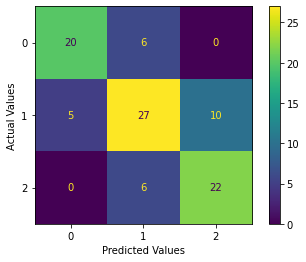

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

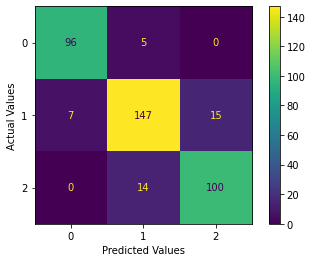

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

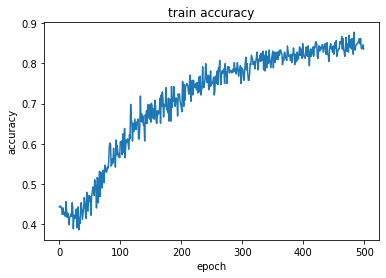

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

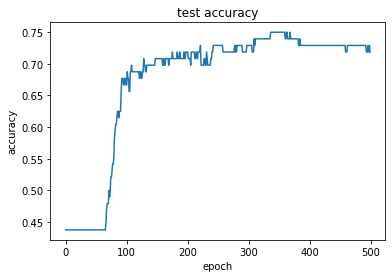

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

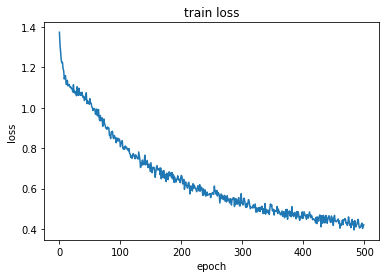

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

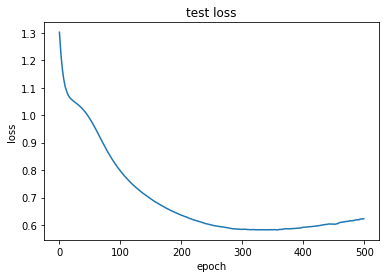

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 4-layer model sigmoid RMS Dropout**

In [ ]:
model_4layer_sRD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_4layer_sRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_4layer_sRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 9ms/step - loss: 1.1359 - accuracy: 0.4245 - val_loss: 1.0822 - val_accuracy: 0.4375
Epoch 2/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1405 - accuracy: 0.3854 - val_loss: 1.0778 - val_accuracy: 0.4375
Epoch 3/500
24/24 [==============================] - 0s 4ms/step - loss: 1.1186 - accuracy: 0.4062 - val_loss: 1.0753 - val_accuracy: 0.4375
Epoch 4/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1190 - accuracy: 0.4062 - val_loss: 1.0730 - val_accuracy: 0.4375
Epoch 5/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0866 - accuracy: 0.4349 - val_loss: 1.0708 - val_accuracy: 0.4375
Epoch 6/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1314 - accuracy: 0.3906 - val_loss: 1.0688 - val_accuracy: 0.4375
Epoch 7/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1058 - accuracy: 0.4219 - val_loss: 1.0671 - val_accuracy: 0.4375
Epoch 8/500
2

In [ ]:
predictions_test = model_4layer_sRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layer_sRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu SGD Dropout**

In [ ]:
model_5layer_RSD = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_RSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_RSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

In [ ]:
predictions_test = model_5layer_RSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu Adam Dropout**

In [ ]:
model_5layer_RAD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_RAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_RAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.3948 - accuracy: 0.2812 - val_loss: 1.2302 - val_accuracy: 0.2812
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.2584 - accuracy: 0.3177 - val_loss: 1.1749 - val_accuracy: 0.3229
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1835 - accuracy: 0.3490 - val_loss: 1.1401 - val_accuracy: 0.3542
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1823 - accuracy: 0.3438 - val_loss: 1.1167 - val_accuracy: 0.3854
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1402 - accuracy: 0.3906 - val_loss: 1.0988 - val_accuracy: 0.3854
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1450 - accuracy: 0.3542 - val_loss: 1.0847 - val_accuracy: 0.4167
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1273 - accuracy: 0.3932 - val_loss: 1.0739 - val_accuracy: 0.4792
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.718750
precision: 0.7453194953194954
recall; 0.7316849816849818
F1_score: 0.7313091016548463
confusion_matrix test: 
[[19  7  0]
 [ 2 27 13]
 [ 0  5 23]]
confusion_matrix train: 
[[ 97   4   0]
 [  6 142  21]
 [  0   6 108]]


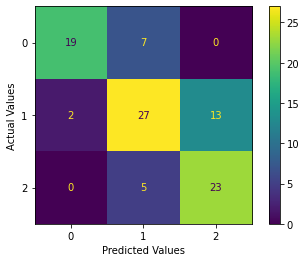

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

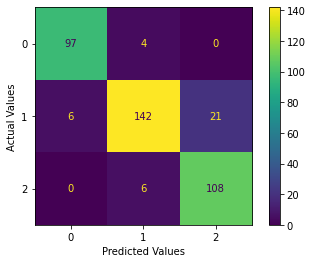

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

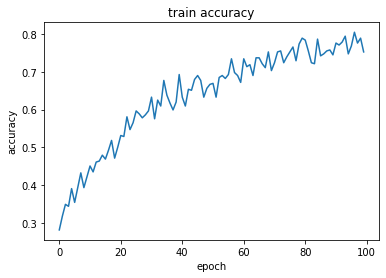

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

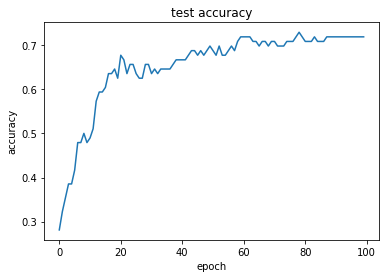

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

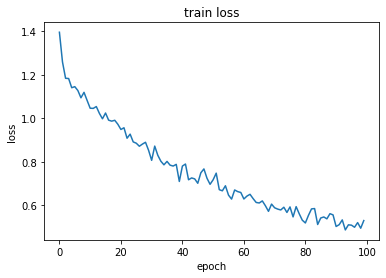

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

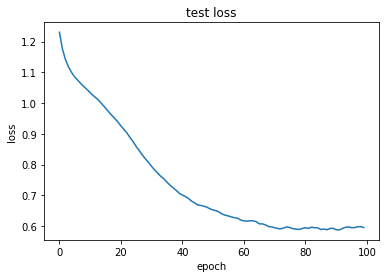

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model Relu RMS Dropout**

In [ ]:
model_5layer_RRD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_RRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_RRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 10ms/step - loss: 1.1700 - accuracy: 0.2969 - val_loss: 1.1159 - val_accuracy: 0.3125
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1662 - accuracy: 0.2917 - val_loss: 1.1017 - val_accuracy: 0.3333
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1325 - accuracy: 0.3177 - val_loss: 1.0902 - val_accuracy: 0.3542
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1178 - accuracy: 0.2943 - val_loss: 1.0780 - val_accuracy: 0.3854
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0878 - accuracy: 0.3724 - val_loss: 1.0713 - val_accuracy: 0.3750
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1254 - accuracy: 0.3672 - val_loss: 1.0640 - val_accuracy: 0.3646
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0679 - accuracy: 0.4245 - val_loss: 1.0556 - val_accuracy: 0.4167
Epoch 8/100


In [ ]:
predictions_test = model_5layer_RRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_RRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7201913875598086
recall; 0.7255799755799757
F1_score: 0.720684667309547
confusion_matrix test: 
[[21  5  0]
 [ 4 26 12]
 [ 0  7 21]]
confusion_matrix train: 
[[ 97   4   0]
 [  9 142  18]
 [  0  17  97]]


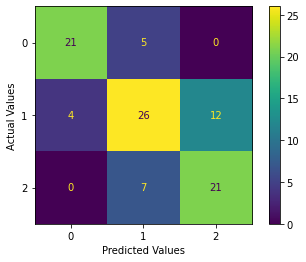

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

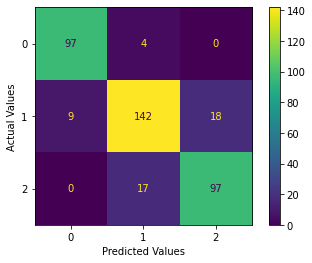

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

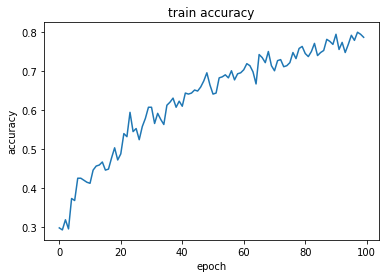

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

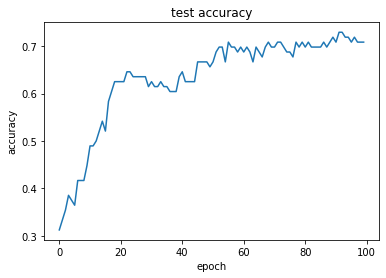

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

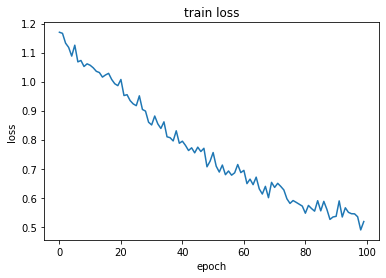

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

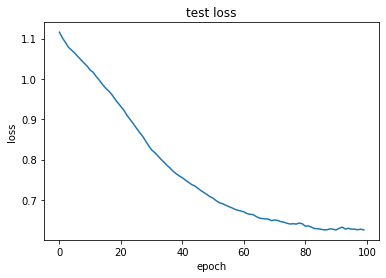

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh SGD Dropout**

In [ ]:
model_5layer_tSD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(64, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_tSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_tSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 1.1605 - accuracy: 0.3490 - val_loss: 1.0261 - val_accuracy: 0.4688
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0734 - accuracy: 0.4349 - val_loss: 0.9454 - val_accuracy: 0.5417
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0094 - accuracy: 0.4661 - val_loss: 0.8887 - val_accuracy: 0.6146
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9847 - accuracy: 0.4948 - val_loss: 0.8414 - val_accuracy: 0.6042
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9228 - accuracy: 0.5182 - val_loss: 0.8092 - val_accuracy: 0.6042
Epoch 6/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9042 - accuracy: 0.4844 - val_loss: 0.7818 - val_accuracy: 0.6250
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8681 - accuracy: 0.5990 - val_loss: 0.7595 - val_accuracy: 0.6146
Epoch 8/100
2

In [ ]:
predictions_test = model_5layer_tSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7076388888888889
recall; 0.7127594627594628
F1_score: 0.7087630113773905
confusion_matrix test: 
[[20  6  0]
 [ 5 26 11]
 [ 0  7 21]]
confusion_matrix train: 
[[ 98   3   0]
 [ 10 135  24]
 [  0   6 108]]


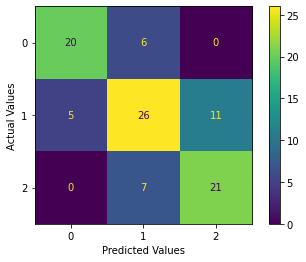

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

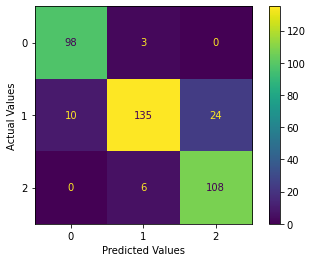

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

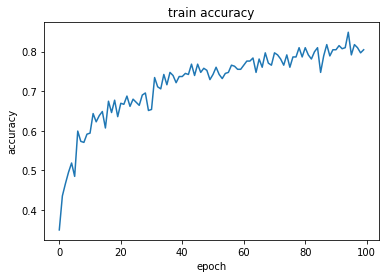

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

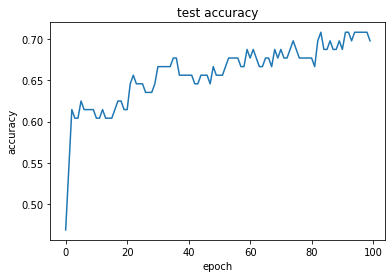

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

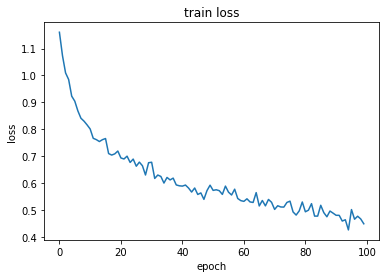

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

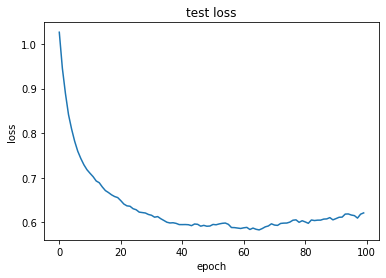

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh Adam Dropout**

In [ ]:
model_5layer_tAD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(64, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_tAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_tAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 2s 10ms/step - loss: 1.2506 - accuracy: 0.3620 - val_loss: 1.0889 - val_accuracy: 0.3750
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 1.3044 - accuracy: 0.3333 - val_loss: 1.0391 - val_accuracy: 0.3958
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1249 - accuracy: 0.4062 - val_loss: 1.0000 - val_accuracy: 0.4688
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1338 - accuracy: 0.4323 - val_loss: 0.9709 - val_accuracy: 0.5312
Epoch 5/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1314 - accuracy: 0.4297 - val_loss: 0.9454 - val_accuracy: 0.5312
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 1.0862 - accuracy: 0.4453 - val_loss: 0.9214 - val_accuracy: 0.5312
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0802 - accuracy: 0.4557 - val_loss: 0.9032 - val_accuracy: 0.5625
Epoch 8/100


In [ ]:
predictions_test = model_5layer_tAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.697917
precision: 0.7045454545454546
recall; 0.7255799755799757
F1_score: 0.7081787211740042
confusion_matrix test: 
[[21  5  0]
 [ 6 23 13]
 [ 0  5 23]]
confusion_matrix train: 
[[ 98   3   0]
 [ 10 128  31]
 [  1  14  99]]


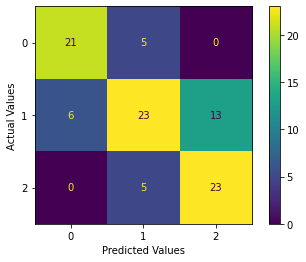

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

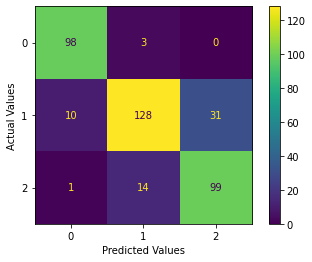

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

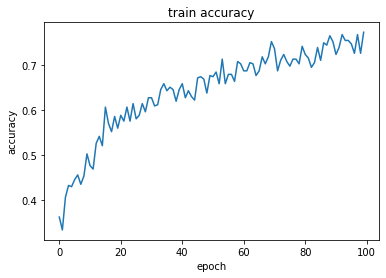

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

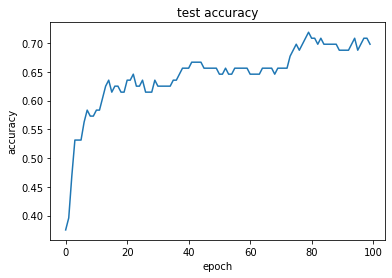

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

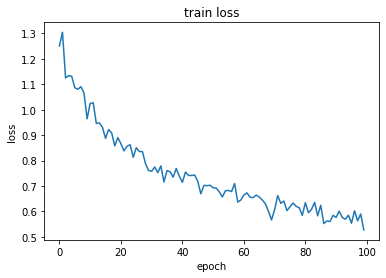

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

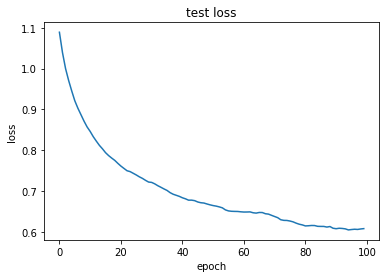

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model tanh RMS Dropout**

In [ ]:
model_5layer_tRD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'tanh'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_tRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_tRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 11ms/step - loss: 1.3811 - accuracy: 0.3802 - val_loss: 1.0900 - val_accuracy: 0.3958
Epoch 2/100
24/24 [==============================] - 0s 3ms/step - loss: 1.2420 - accuracy: 0.3568 - val_loss: 0.9922 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 1.1908 - accuracy: 0.4167 - val_loss: 0.9292 - val_accuracy: 0.5000
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 1.0751 - accuracy: 0.4661 - val_loss: 0.8799 - val_accuracy: 0.5625
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 1.0521 - accuracy: 0.4896 - val_loss: 0.8452 - val_accuracy: 0.6042
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.9964 - accuracy: 0.5391 - val_loss: 0.8198 - val_accuracy: 0.6667
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9361 - accuracy: 0.5547 - val_loss: 0.7985 - val_accuracy: 0.6771
Epoch 8/100


In [ ]:
predictions_test = model_5layer_tRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_tRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.708333
precision: 0.7169590643274854
recall; 0.7246642246642246
F1_score: 0.7185417336333441
confusion_matrix test: 
[[20  6  0]
 [ 5 26 11]
 [ 0  6 22]]
confusion_matrix train: 
[[ 97   4   0]
 [  9 144  16]
 [  0   7 107]]


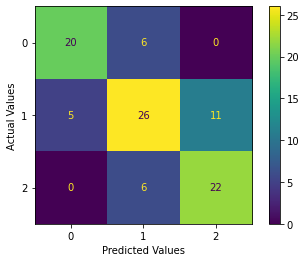

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

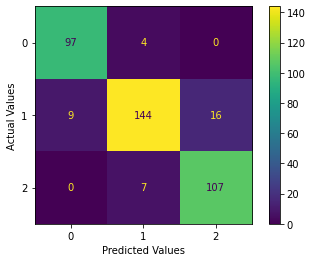

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

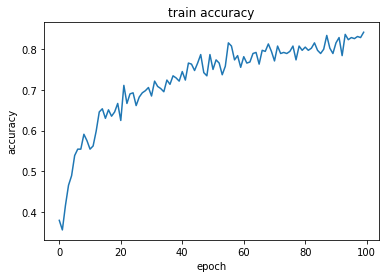

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

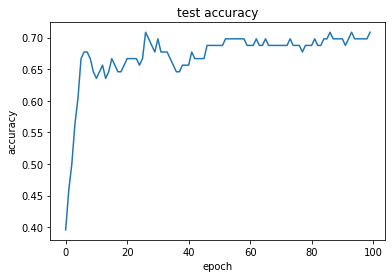

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

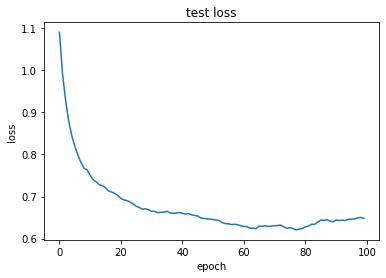

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid SGD Dropout**

In [ ]:
model_5layer_sSD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_sSD.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.1), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model_5layer_sSD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

Epoch 1/500
24/24 [==============================] - 1s 9ms/step - loss: 1.0784 - accuracy: 0.4453 - val_loss: 1.0876 - val_accuracy: 0.4375
Epoch 2/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1101 - accuracy: 0.3620 - val_loss: 1.0818 - val_accuracy: 0.4375
Epoch 3/500
24/24 [==============================] - 0s 3ms/step - loss: 1.1078 - accuracy: 0.3906 - val_loss: 1.0771 - val_accuracy: 0.4375
Epoch 4/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0968 - accuracy: 0.4115 - val_loss: 1.0783 - val_accuracy: 0.4375
Epoch 5/500
24/24 [==============================] - 0s 4ms/step - loss: 1.1120 - accuracy: 0.4115 - val_loss: 1.0751 - val_accuracy: 0.4375
Epoch 6/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0938 - accuracy: 0.3854 - val_loss: 1.0795 - val_accuracy: 0.4375
Epoch 7/500
24/24 [==============================] - 0s 3ms/step - loss: 1.0963 - accuracy: 0.3984 - val_loss: 1.0743 - val_accuracy: 0.4375
Epoch 8/500
2

In [ ]:
predictions_test = model_5layer_sSD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sSD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid Adam Dropout**

In [ ]:
model_5layer_sAD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_sAD.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_sAD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

In [ ]:
predictions_test = model_5layer_sAD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sAD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

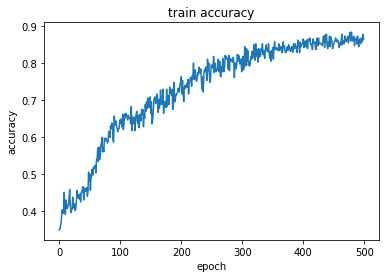

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**Model 5-layer model sigmoid RMS Dropout**

In [ ]:
model_5layer_sRD = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(64, activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(16, activation = 'sigmoid'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
#make ready for training
model_5layer_sRD.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
#fit model
model = model_5layer_sRD.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 500, batch_size = 16)

In [ ]:
predictions_test = model_5layer_sRD.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_5layer_sRD.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

#**K-Fold**

In [ ]:
kf =KFold(n_splits=5)
count = 1
# split() ->  method generate indices to split data into training and test set.
for train_index, test_index in kf.split(X, Y):
    print(f'Fold:{count}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    count += 1

#**Model-1 k-Fold - 3 layer Relu SGD**

In [ ]:
count = 1
cm_test, cm_train, precision, recall, F1_score, accuracy  = ([] for i in range(6))
for train_index, test_index in KFold(n_splits=5).split(X):
  print(f'Fold:{count}') #print each fold
  count += 1
  X_train, X_test = X[train_index], X[test_index] #seprate part
  y_train, y_test = Y[train_index], Y[test_index]
  X_train = tf.convert_to_tensor(X_train, dtype=tf.float64)
  y_train = tf.convert_to_tensor(y_train, dtype=tf.float32) 
  X_test = tf.convert_to_tensor(X_test, dtype=tf.float64)
  y_test = tf.convert_to_tensor(y_test, dtype=tf.float32) #converting
  model_3layerk_RS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )#model
  model_3layerk_RS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = 0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy']) #compile
  model = model_3layerk_RS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16) #fitting
  predictions_test = model_3layerk_RS.predict(X_test, batch_size = 16)
  y_pred_test = np.argmax(predictions_test, axis = -1)
  cm_test.append(confusion_matrix(y_test, y_pred_test))
  
  prediction_train = model_3layerk_RS.predict(X_train, batch_size = 16)
  y_pred_train = np.argmax(prediction_train, axis = -1)
  cm_train.append(confusion_matrix(y_train, y_pred_train))

  precision.append(precision_score(y_test, y_pred_test , average="macro"))
  recall.append(recall_score(y_test, y_pred_test , average="macro"))
  F1_score.append(f1_score(y_test, y_pred_test , average="macro"))
  accuracy.append(accuracy_score(y_test, y_pred_test))

print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, 5):
  print('------------------------------------------------------------------------')
  print(f'> Fold {i+1} - Accuracy: {accuracy[i] * 100}%')
print('------------------------------------------------------------------------')

#**1-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[0])
print("precision: " + str(precision[0]))
print("recall; " + str(recall[0]))
print("F1_score: " + str(F1_score[0]))
print("confusion_matrix test: ")
print(cm_test[0])
print("confusion_matrix train: ")
print(cm_train[0])

Accuracy: 0.677083
precision: 0.6628479921162848
recall; 0.6710702298937593
F1_score: 0.6594871794871796
confusion_matrix test: 
[[29 10  3]
 [ 4 25  8]
 [ 0  6 11]]
confusion_matrix train: 
[[ 61  19   5]
 [  4  79  91]
 [  1  11 113]]


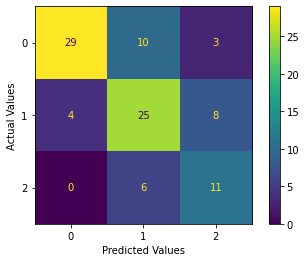

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[0], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

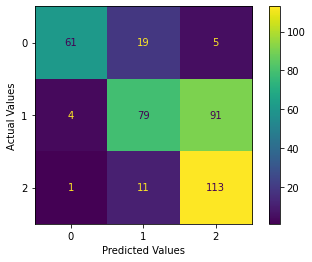

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[0], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**2-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[1])
print("precision: " + str(precision[1]))
print("recall; " + str(recall[1]))
print("F1_score: " + str(F1_score[1]))
print("confusion_matrix test: ")
print(cm_test[1])
print("confusion_matrix train: ")
print(cm_train[1])

Accuracy: 0.583333
precision: 0.594017094017094
recall; 0.5906783671011313
F1_score: 0.5922504032301714
confusion_matrix test: 
[[18 10  0]
 [ 9 22 10]
 [ 1 10 16]]
confusion_matrix train: 
[[ 93   5   1]
 [ 18 118  34]
 [  3  36  76]]


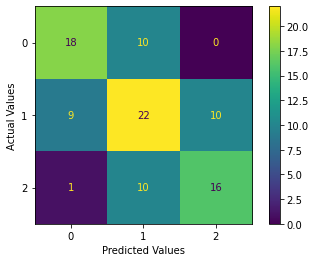

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[1], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

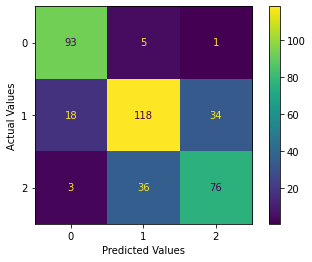

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[1], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**3-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[2])
print("precision: " + str(precision[2]))
print("recall; " + str(recall[2]))
print("F1_score: " + str(F1_score[2]))
print("confusion_matrix test: ")
print(cm_test[2])
print("confusion_matrix train: ")
print(cm_train[2])

Accuracy: 0.510417
precision: 0.5212962962962963
recall; 0.5626303712974551
F1_score: 0.5061919935049407
confusion_matrix test: 
[[14  3  0]
 [16 23  8]
 [ 6 14 12]]
confusion_matrix train: 
[[106   4   0]
 [ 39 105  20]
 [  3  44  63]]


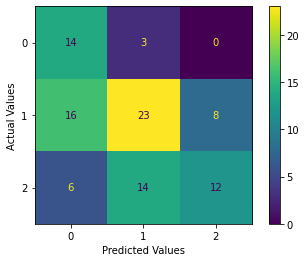

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[2], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

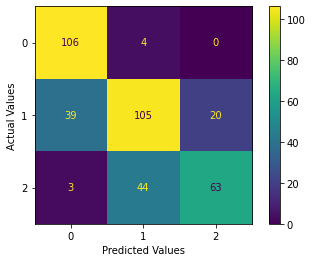

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[2], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**4-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[3])
print("precision: " + str(precision[3]))
print("recall; " + str(recall[3]))
print("F1_score: " + str(F1_score[3]))
print("confusion_matrix test: ")
print(cm_test[3])
print("confusion_matrix train: ")
print(cm_train[3])

Accuracy: 0.666667
precision: 0.7473642037786775
recall; 0.6408730158730159
F1_score: 0.6513090536785139
confusion_matrix test: 
[[17  7  0]
 [ 2 37  3]
 [ 0 20 10]]
confusion_matrix train: 
[[ 81  22   0]
 [  7 159   3]
 [  1  75  36]]


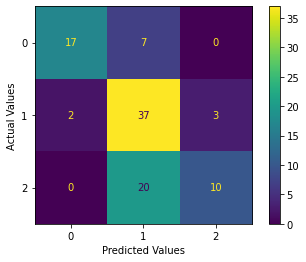

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[3], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

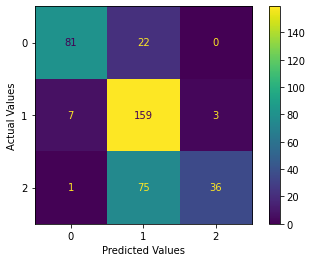

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[3], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**5-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[4])
print("precision: " + str(precision[4]))
print("recall; " + str(recall[4]))
print("F1_score: " + str(F1_score[4]))
print("confusion_matrix test: ")
print(cm_test[4])
print("confusion_matrix train: ")
print(cm_train[4])

Accuracy: 0.541667
precision: 0.6677083333333332
recall; 0.6018518518518519
F1_score: 0.5936309523809524
confusion_matrix test: 
[[12  2  2]
 [ 0 11 33]
 [ 0  7 29]]
confusion_matrix train: 
[[102   9   0]
 [ 20 110  37]
 [  3  29  74]]


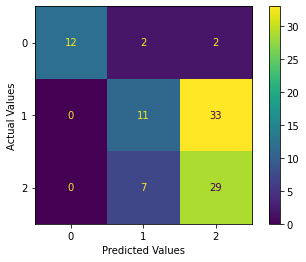

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[4], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

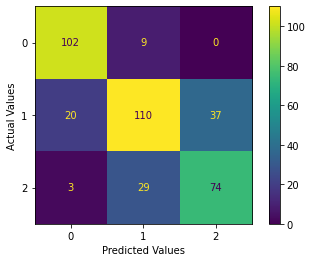

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[4], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**Model-2 k-Fold - 4 layer Relu RMS**

In [ ]:
count = 1
cm_test, cm_train, precision, recall, F1_score, accuracy  = ([] for i in range(6))
for train_index, test_index in KFold(n_splits=5).split(X):
  print(f'Fold:{count}')
  count += 1
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = Y[train_index], Y[test_index]
  X_train = tf.convert_to_tensor(X_train, dtype=tf.float64)
  y_train = tf.convert_to_tensor(y_train, dtype=tf.float32) 
  X_test = tf.convert_to_tensor(X_test, dtype=tf.float64)
  y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
  model_4layerk_RR = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(64, activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
  model_4layerk_RR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
  model = model_4layerk_RR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)
  
  predictions_test = model_4layerk_RR.predict(X_test, batch_size = 16)
  y_pred_test = np.argmax(predictions_test, axis = -1)
  cm_test.append(confusion_matrix(y_test, y_pred_test))
  
  prediction_train = model_4layerk_RR.predict(X_train, batch_size = 16)
  y_pred_train = np.argmax(prediction_train, axis = -1)
  cm_train.append(confusion_matrix(y_train, y_pred_train))

  precision.append(precision_score(y_test, y_pred_test , average="macro"))
  recall.append(recall_score(y_test, y_pred_test , average="macro"))
  F1_score.append(f1_score(y_test, y_pred_test , average="macro"))
  accuracy.append(accuracy_score(y_test, y_pred_test))

print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, 5):
  print('------------------------------------------------------------------------')
  print(f'> Fold {i+1} - Accuracy: {accuracy[i] * 100}%')
print('------------------------------------------------------------------------')

Fold:1
Epoch 1/100
24/24 [==============================] - 1s 9ms/step - loss: 7.2268 - accuracy: 0.3750 - val_loss: 2.6589 - val_accuracy: 0.3229
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 3.2553 - accuracy: 0.3906 - val_loss: 1.2752 - val_accuracy: 0.4583
Epoch 3/100
24/24 [==============================] - 0s 3ms/step - loss: 1.1915 - accuracy: 0.4609 - val_loss: 1.0882 - val_accuracy: 0.5521
Epoch 4/100
24/24 [==============================] - 0s 3ms/step - loss: 0.9441 - accuracy: 0.5260 - val_loss: 0.9654 - val_accuracy: 0.5938
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8835 - accuracy: 0.5469 - val_loss: 0.9265 - val_accuracy: 0.6979
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 0.8574 - accuracy: 0.5312 - val_loss: 0.9027 - val_accuracy: 0.7604
Epoch 7/100
24/24 [==============================] - 0s 3ms/step - loss: 0.8312 - accuracy: 0.6042 - val_loss: 0.8863 - val_accuracy: 0.6875
Epoch 

#**1-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[0])
print("precision: " + str(precision[0]))
print("recall; " + str(recall[0]))
print("F1_score: " + str(F1_score[0]))
print("confusion_matrix test: ")
print(cm_test[0])
print("confusion_matrix train: ")
print(cm_train[0])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[0], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[0], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**2-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[1])
print("precision: " + str(precision[1]))
print("recall; " + str(recall[1]))
print("F1_score: " + str(F1_score[1]))
print("confusion_matrix test: ")
print(cm_test[1])
print("confusion_matrix train: ")
print(cm_train[1])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[1], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[1], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**3-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[2])
print("precision: " + str(precision[2]))
print("recall; " + str(recall[2]))
print("F1_score: " + str(F1_score[2]))
print("confusion_matrix test: ")
print(cm_test[2])
print("confusion_matrix train: ")
print(cm_train[2])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[2], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[2], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**4-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[3])
print("precision: " + str(precision[3]))
print("recall; " + str(recall[3]))
print("F1_score: " + str(F1_score[3]))
print("confusion_matrix test: ")
print(cm_test[3])
print("confusion_matrix train: ")
print(cm_train[3])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[3], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[3], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**5-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[4])
print("precision: " + str(precision[4]))
print("recall; " + str(recall[4]))
print("F1_score: " + str(F1_score[4]))
print("confusion_matrix test: ")
print(cm_test[4])
print("confusion_matrix train: ")
print(cm_train[4])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[4], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

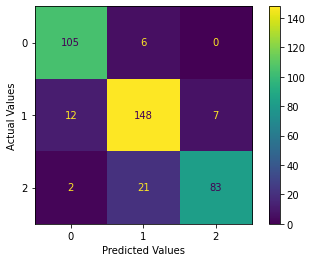

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[4], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**Model-3 k-Fold - 5 layer relu SGD**

In [ ]:
count = 1
cm_test, cm_train, precision, recall, F1_score, accuracy  = ([] for i in range(6))
for train_index, test_index in KFold(n_splits=5).split(X):
  print(f'Fold:{count}')
  count += 1
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = Y[train_index], Y[test_index]
  X_train = tf.convert_to_tensor(X_train, dtype=tf.float64)
  y_train = tf.convert_to_tensor(y_train, dtype=tf.float32) 
  X_test = tf.convert_to_tensor(X_test, dtype=tf.float64)
  y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
  model_5layerk_RS = keras.Sequential(
    [
        keras.layers.Dense(64, input_shape = (X_train.shape[1],), activation = 'relu'),
        keras.layers.Dense(32, activation = 'relu'),
        keras.layers.Dense(16, activation = 'relu'),
        keras.layers.Dense(8, activation = 'relu'),
        keras.layers.Dense(3, activation = 'softmax')
    ]
  )
  model_5layerk_RS.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.01), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
  model_5layerk_RS.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

  predictions_test = model_5layerk_RS.predict(X_test, batch_size = 16)
  y_pred_test = np.argmax(predictions_test, axis = -1)
  cm_test.append(confusion_matrix(y_test, y_pred_test))
  
  prediction_train = model_5layerk_RS.predict(X_train, batch_size = 16)
  y_pred_train = np.argmax(prediction_train, axis = -1)
  cm_train.append(confusion_matrix(y_train, y_pred_train))

  precision.append(precision_score(y_test, y_pred_test , average="macro"))
  recall.append(recall_score(y_test, y_pred_test , average="macro"))
  F1_score.append(f1_score(y_test, y_pred_test , average="macro"))
  accuracy.append(accuracy_score(y_test, y_pred_test))

print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(0, 5):
  print('------------------------------------------------------------------------')
  print(f'> Fold {i+1} - Accuracy: {accuracy[i] * 100}%')
print('------------------------------------------------------------------------')

#**1-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[0])
print("precision: " + str(precision[0]))
print("recall; " + str(recall[0]))
print("F1_score: " + str(F1_score[0]))
print("confusion_matrix test: ")
print(cm_test[0])
print("confusion_matrix train: ")
print(cm_train[0])

Accuracy: 0.718750
precision: 0.7195652173913043
recall; 0.6593484240543064
F1_score: 0.6741618687940562
confusion_matrix test: 
[[34  8  0]
 [ 6 28  3]
 [ 0 10  7]]
confusion_matrix train: 
[[ 63  20   2]
 [  7 108  59]
 [  1  26  98]]


In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[0], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[0], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**2-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[1])
print("precision: " + str(precision[1]))
print("recall; " + str(recall[1]))
print("F1_score: " + str(F1_score[1]))
print("confusion_matrix test: ")
print(cm_test[1])
print("confusion_matrix train: ")
print(cm_train[1])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[1], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[1], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**3-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[2])
print("precision: " + str(precision[2]))
print("recall; " + str(recall[2]))
print("F1_score: " + str(F1_score[2]))
print("confusion_matrix test: ")
print(cm_test[2])
print("confusion_matrix train: ")
print(cm_train[2])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[2], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[2], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**4-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[3])
print("precision: " + str(precision[3]))
print("recall; " + str(recall[3]))
print("F1_score: " + str(F1_score[3]))
print("confusion_matrix test: ")
print(cm_test[3])
print("confusion_matrix train: ")
print(cm_train[3])

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[3], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[3], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**5-Fold**

In [ ]:
print('Accuracy: %f' % accuracy[4])
print("precision: " + str(precision[4]))
print("recall; " + str(recall[4]))
print("F1_score: " + str(F1_score[4]))
print("confusion_matrix test: ")
print(cm_test[4])
print("confusion_matrix train: ")
print(cm_train[4])

Accuracy: 0.520833
precision: 0.6436781609195402
recall; 0.5799663299663299
F1_score: 0.5868287740628166
confusion_matrix test: 
[[12  2  2]
 [ 0 13 31]
 [ 0 11 25]]
confusion_matrix train: 
[[ 94  17   0]
 [ 23 112  32]
 [  1  31  74]]


In [ ]:
cmd = ConfusionMatrixDisplay(cm_test[4], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

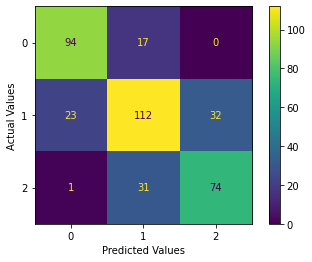

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train[4], display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

#**Regularization For best Model**

In [ ]:
model_4layerL_RR = keras.Sequential(
    [
        keras.layers.Dense(128, input_shape = (X_train.shape[1],), activation = 'relu', activity_regularizer = keras.regularizers.L2(0.01)),
        keras.layers.Dense(64, activation = 'relu', activity_regularizer = keras.regularizers.L2(0.01)),
        keras.layers.Dense(32, activation = 'relu', activity_regularizer = keras.regularizers.L2(0.01)),
        keras.layers.Dense(3, activation = 'softmax')
    ]
)
model_4layerL_RR.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model = model_4layerL_RR.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 16)

Epoch 1/100
24/24 [==============================] - 1s 12ms/step - loss: 88.8572 - accuracy: 0.4141 - val_loss: 134.4344 - val_accuracy: 0.3646
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 75.6962 - accuracy: 0.4349 - val_loss: 117.4559 - val_accuracy: 0.4062
Epoch 3/100
24/24 [==============================] - 0s 4ms/step - loss: 66.7028 - accuracy: 0.4297 - val_loss: 104.3183 - val_accuracy: 0.4062
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 59.6335 - accuracy: 0.4219 - val_loss: 93.6944 - val_accuracy: 0.3854
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 53.6855 - accuracy: 0.4479 - val_loss: 84.3641 - val_accuracy: 0.3854
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 48.5206 - accuracy: 0.4531 - val_loss: 76.3321 - val_accuracy: 0.4479
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 43.9892 - accuracy: 0.4766 - val_loss: 69.2197 - val_accuracy: 0.

In [ ]:
predictions_test = model_4layerL_RR.predict(X_test, batch_size = 16)
y_pred_test = np.argmax(predictions_test, axis = -1)
cm_test = confusion_matrix(y_test, y_pred_test)

prediction_train = model_4layerL_RR.predict(X_train, batch_size = 16)
y_pred_train = np.argmax(prediction_train, axis = -1)
cm_train = confusion_matrix(y_train, y_pred_train)

precision = precision_score(y_test, y_pred_test , average="macro")
recall = recall_score(y_test, y_pred_test , average="macro")
F1_score = f1_score(y_test, y_pred_test , average="macro")
accuracy = accuracy_score(y_test, y_pred_test)
print('Accuracy: %f' % accuracy)
print("precision: " + str(precision))
print("recall; " + str(recall))
print("F1_score: " + str(F1_score))
print("confusion_matrix test: ")
print(cm_test)
print("confusion_matrix train: ")
print(cm_train)

Accuracy: 0.645833
precision: 0.7246031746031746
recall; 0.6923400673400674
F1_score: 0.7054945054945055
confusion_matrix test: 
[[14  0  2]
 [ 0 26 18]
 [ 0 14 22]]
confusion_matrix train: 
[[106   5   0]
 [ 30 112  25]
 [  3  35  68]]


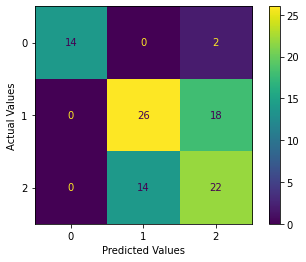

In [ ]:
cmd = ConfusionMatrixDisplay(cm_test, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

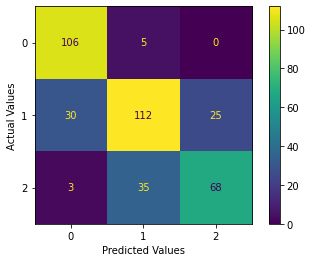

In [ ]:
cmd = ConfusionMatrixDisplay(cm_train, display_labels=[0, 1, 2])
cmd.plot()
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

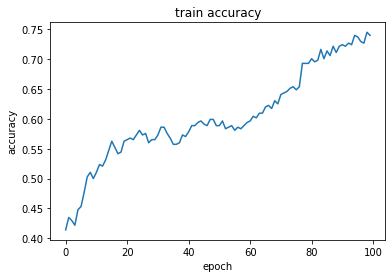

In [ ]:
plt.plot(model.history['accuracy'])
plt.title('train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

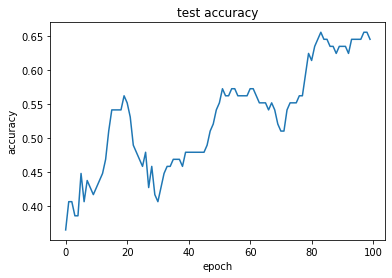

In [ ]:
plt.plot(model.history['val_accuracy'])
plt.title('test accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()

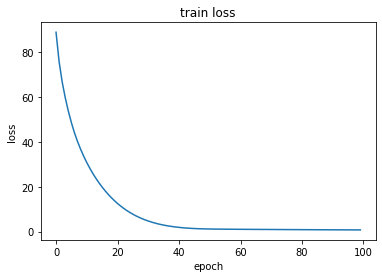

In [ ]:
plt.plot(model.history['loss'])
plt.title('train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

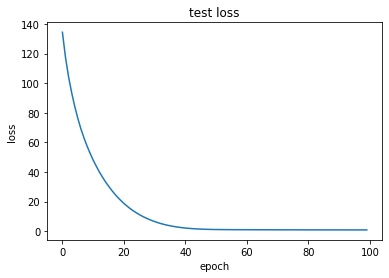

In [ ]:
plt.plot(model.history['val_loss'])
plt.title('test loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()